<a href="https://colab.research.google.com/github/ParhamPishro/Flavonoid/blob/main/Flavonoid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#pip install imbalanced-learn

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

from scipy.stats import chisquare
from imblearn.over_sampling import SMOTE, SMOTENC, SVMSMOTE
from pylab import rcParams

from sklearn.preprocessing import MinMaxScaler , LabelEncoder#, OneHotEncoder
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_predict, cross_val_score
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.svm import SVR, SVC
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from tensorflow import keras
from keras.models import Sequential
from keras import layers


from sklearn.metrics import mean_absolute_error, r2_score, get_scorer_names, pairwise, confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
#from sklearn.feature_selection import chi2, RFE, RFECV, SelectKBest


In [6]:
df = pd.read_excel("/content/FlavonoidData.xlsx")
df

,authors,flavonoid,cell line,time,dose,viability-mean,viability-error,viability-SD,viability-SE
0,Chen et al. 2017,Luteolin,KYSE30,48,10.0,77.272727,77.272727,0.001000,NaN
1,Chen et al. 2017,Luteolin,KYSE30,48,20.0,67.613636,67.613636,0.001000,NaN
2,Chen et al. 2017,Luteolin,KYSE30,48,40.0,47.159091,47.159091,0.001000,NaN
3,Chen et al. 2017,Luteolin,KYSE30,48,80.0,32.386364,32.386364,0.001000,NaN
4,Chen et al. 2017,Luteolin,KYSE30,72,10.0,69.886364,69.886364,0.001000,NaN
...,...,...,...,...,...,...,...,...,...
479,Zhu et al. 2016,Apigenin,KYSE150,24,20.0,88.407643,88.407643,0.001000,NaN
480,Zhu et al. 2016,Apigenin,KYSE150,24,40.0,78.980892,82.802548,3.821656,NaN
481,Zhu et al. 2016,Apigenin,KYSE150,24,60.0,67.261146,70.828025,3.566879,NaN
482,Zhu et al. 2016,Apigenin,KYSE150,24,80.0,45.350318,47.643312,2.292994,NaN


In [7]:
test = pd.read_excel("/content/FlavonoidTest.xlsx")

In [8]:
df[:][df['viability-error']==100]#[df['authors']=='Xin 2008']

,authors,flavonoid,cell line,time,dose,viability-mean,viability-error,viability-SD,viability-SE


In [9]:
df[['authors']].groupby(['authors']).size()


,0
authors,
Chen et al. 2017,16
Chen et al. 2021,24
Li et al. 2023,8
Qin et al. 2021,24
Qiu et al. 2019,5
Ren et al. 2016,7
Wang and Renquan 2023,18
Wang and Zheng 2016,15
Wang et al. 2011,34


# Flavonoid

## DataFrame

In [10]:
df['v01'] = 1
df.loc[df['viability-mean']>50, 'v01'] = 0

test['v01'] = 1
test.loc[test['viability-mean']>50, 'v01'] = 0

In [11]:
df['v01'].value_counts(sort = True)


,count
v01,
0,298
1,186


In [12]:
df = df.drop(['authors', 'viability-error', 'viability-SD', 'viability-SE'], axis=1)
df

,flavonoid,cell line,time,dose,viability-mean,v01
0,Luteolin,KYSE30,48,10.0,77.272727,0
1,Luteolin,KYSE30,48,20.0,67.613636,0
2,Luteolin,KYSE30,48,40.0,47.159091,1
3,Luteolin,KYSE30,48,80.0,32.386364,1
4,Luteolin,KYSE30,72,10.0,69.886364,0
...,...,...,...,...,...,...
479,Apigenin,KYSE150,24,20.0,88.407643,0
480,Apigenin,KYSE150,24,40.0,78.980892,0
481,Apigenin,KYSE150,24,60.0,67.261146,0
482,Apigenin,KYSE150,24,80.0,45.350318,1


In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time,484.0,50.330579,19.053977,24.000000,24.000000,48.00000,72.000000,72.000000
dose,484.0,41.383264,33.629117,1.000000,20.000000,40.00000,63.750000,300.000000
viability-mean,484.0,57.088105,21.670983,1.714286,44.279525,61.07748,73.846554,95.769231
v01,484.0,0.384298,0.486932,0.000000,0.000000,0.00000,1.000000,1.000000


In [14]:
df_encoded = pd.get_dummies(df, dtype=int)
df_encoded

,time,dose,viability-mean,v01,flavonoid_Acacetin,flavonoid_Apigenin,flavonoid_Chrysin,flavonoid_Galangin,flavonoid_Kaempferol,flavonoid_Luteolin,...,cell line_KYSE150,cell line_KYSE30,cell line_KYSE410,cell line_KYSE450,cell line_KYSE510,cell line_OE19,cell line_OE33,cell line_TE-1,cell line_TE-10,cell line_YES2
0,48,10.0,77.272727,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
1,48,20.0,67.613636,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
2,48,40.0,47.159091,1,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
3,48,80.0,32.386364,1,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
4,72,10.0,69.886364,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,24,20.0,88.407643,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
480,24,40.0,78.980892,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
481,24,60.0,67.261146,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
482,24,80.0,45.350318,1,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [15]:
#df_encoded
X = df_encoded.drop(['viability-mean', 'v01'], axis=1)
y = df['viability-mean']
y01 = df['v01']

X_test = test.drop(['authors', 'flavonoid', 'cell line', 'viability-mean', 'v01'], axis=1)
y_test = test['v01']

## Data Visualization

([<matplotlib.patches.Wedge at 0x7adaf8e9af10>,
 [Text(-1.0281278765071942, -0.39109214968956846, 'Over 50%'),
  Text(1.1215941115204953, 0.4266458121235349, 'Under 50%')],
 [Text(-0.5607970235493785, -0.2133229907397646, '61.57%'),
  Text(0.6542632317202889, 0.24887672373872868, '38.43%')])

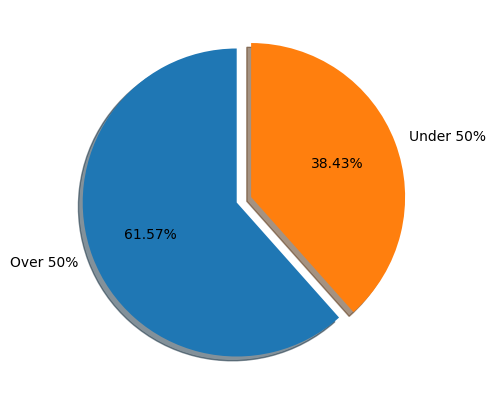

In [16]:
# Data to plot
sizes = df['v01'].value_counts(sort = True)

rcParams['figure.figsize'] = 5,5 # Plot

plt.pie(sizes, explode = (0,0.1), labels=["Over 50%", "Under 50%"], autopct='%.2f%%', shadow=True, startangle=90)#, colors=plt.cm.tab10.colors)

#plt.title('Percentage of Viability in Dataset')

<Axes: >

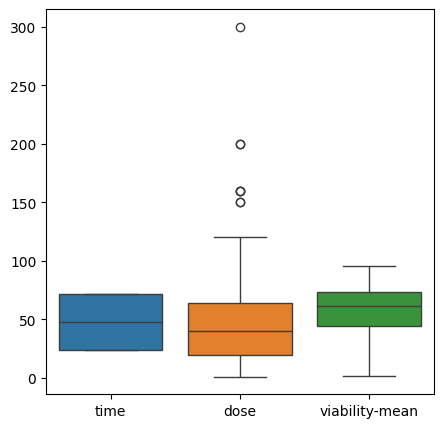

In [17]:
sns.boxplot(df[['time', 'dose', 'viability-mean']], palette=plt.cm.tab10.colors)

In [43]:
df['flavonoid'].value_counts()

,count
flavonoid,
Chrysin,92
Luteolin,88
Kaempferol,75
Apigenin,69
Quercetin,56
Myricetin,47
Galangin,39
Acacetin,18


In [23]:
flavonoid_count = df['flavonoid'].value_counts()
cell_line_count = df['cell line'].value_counts()

flavonoid_labels = ["Chrysin", "Luteolin", "Kaempferol", "Apigenin", "Quercetin", "Myricetin", "Galangin",
                    "Acacetin"] #"Baicalein", "Cirsiliol", "Casticin",
cell_line_labels = ["OE 33", "KYSE 510", "TE-1", "KYSE 30", "KYSE 150", "KYSE 450", 'TE-10',
                    "OE 19", "YES 2", "KYSE 410"]


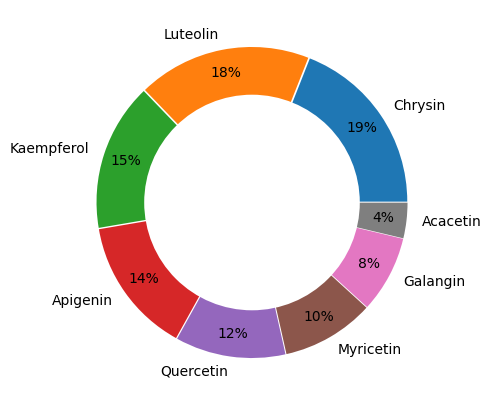

In [20]:
# explosion
explode = (0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01)

# Pie Chart
plt.pie(flavonoid_count, labels=flavonoid_labels, autopct='%1.0f%%', pctdistance=0.85, explode=explode, colors=plt.cm.tab10.colors)

# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()

# Adding Circle in Pie chart (donut churt)
fig.gca().add_artist(centre_circle)

# Adding Title of chart
#plt.title('Flavonoids')

# Displaying Chart
plt.show()


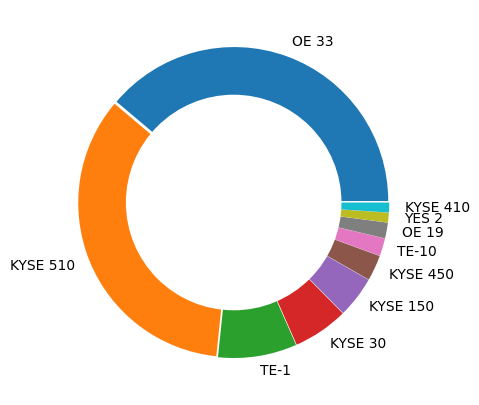

In [24]:
# explosion
explode = (0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01)

# Pie Chart
plt.pie(cell_line_count, labels=cell_line_labels, pctdistance=0.85, explode=explode, colors=plt.cm.tab10.colors) #autopct='%1.1f%%'

# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()

# Adding Circle in Pie chart (donut churt)
fig.gca().add_artist(centre_circle)

# Adding Title of chart
#plt.title('Cell Lines')

# Displaying Chart
plt.show()


In [25]:
aca = df['flavonoid']=='Acacetin'
api = df['flavonoid']=='Apigenin'
chr = df['flavonoid']=='Chrysin'
gal = df['flavonoid']=='Galangin'
kae = df['flavonoid']=='Kaempferol'
lut = df['flavonoid']=='Luteolin'
myr = df['flavonoid']=='Myricetin'
que = df['flavonoid']=='Quercetin'


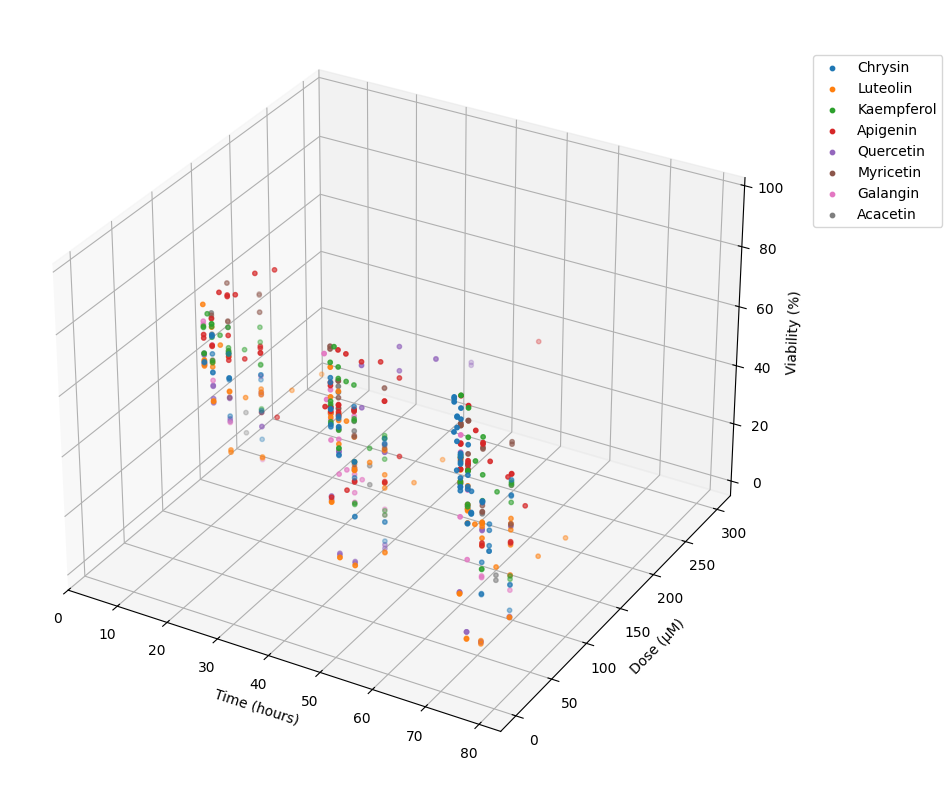

In [26]:
# 3D Plot
fig = plt.figure(figsize=(10,10))
ax3D = fig.add_subplot(111, projection='3d')

p3d = ax3D.scatter(df['time'][chr], df['dose'][chr], df['viability-mean'][chr], s=10, color=plt.cm.tab10.colors[0])
p3d = ax3D.scatter(df['time'][lut], df['dose'][lut], df['viability-mean'][lut], s=10, color=plt.cm.tab10.colors[1])
p3d = ax3D.scatter(df['time'][kae], df['dose'][kae], df['viability-mean'][kae], s=10, color=plt.cm.tab10.colors[2])
p3d = ax3D.scatter(df['time'][api], df['dose'][api], df['viability-mean'][api], s=10, color=plt.cm.tab10.colors[3])
p3d = ax3D.scatter(df['time'][que], df['dose'][que], df['viability-mean'][que], s=10, color=plt.cm.tab10.colors[4])
p3d = ax3D.scatter(df['time'][myr], df['dose'][myr], df['viability-mean'][myr], s=10, color=plt.cm.tab10.colors[5])
p3d = ax3D.scatter(df['time'][gal], df['dose'][gal], df['viability-mean'][gal], s=10, color=plt.cm.tab10.colors[6])
p3d = ax3D.scatter(df['time'][aca], df['dose'][aca], df['viability-mean'][aca], s=10, color=plt.cm.tab10.colors[7])

ax3D.set_xlabel('Time (hours)')
ax3D.set_ylabel('Dose (μM)')
ax3D.set_zlabel('Viability (%)')

ax3D.set_xbound(lower=0, upper=84)
ax3D.set_xbound()

#ax3D.set_title('3D Plot of Flavonoids')
ax3D.legend(flavonoid_labels, bbox_to_anchor=(1.22, 0.95))

plt.show()

## Hyperparameter Tuning

In [16]:
#initialize

knc = KNeighborsClassifier()
svc = SVC()
lor = LogisticRegression()
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()
ada = AdaBoostClassifier()
xgb = XGBClassifier()


### KNN

In [ ]:
param_kn = {'n_neighbors': range(3, 100, 2),
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
%time gs_kn.fit(X, y01)
print(gs_kn.best_params_)
print(gs_kn.best_score_)

CPU times: user 12.2 s, sys: 35.9 ms, total: 12.2 s
Wall time: 12.3 s
{'metric': 'euclidean', 'n_neighbors': 51, 'weights': 'distance'}
0.9112113402061854


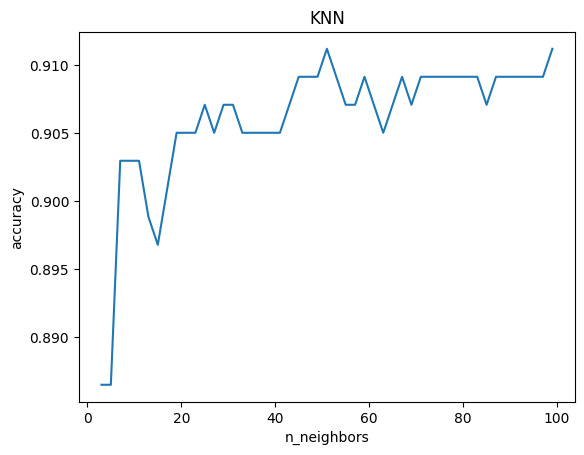

In [15]:
param_kn = {'n_neighbors': range(3, 100, 2),
            'weights': ['distance'],
            'metric': ['euclidean']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
gs_kn.fit(X, y01)

plt.plot(range(3, 100, 2), gs_kn.cv_results_['mean_test_score'])

plt.xlabel('n_neighbors')
plt.ylabel('accuracy')
plt.title('KNN')
#plt.ylim(.83, .87)

plt.show()

In [ ]:
param_kn = {'n_neighbors': [51],
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
gs_kn.fit(X, y01)
print(gs_kn.cv_results_['params'][0:2], gs_kn.cv_results_['mean_test_score'][0:2].max())
print(gs_kn.cv_results_['params'][2:4], gs_kn.cv_results_['mean_test_score'][2:4].max())
print(gs_kn.cv_results_['params'][4:6], gs_kn.cv_results_['mean_test_score'][4:6].max())
print(gs_kn.cv_results_['params'][0:5:2], gs_kn.cv_results_['mean_test_score'][0:5:2].max())
print(gs_kn.cv_results_['params'][1:6:2], gs_kn.cv_results_['mean_test_score'][1:6:2].max())


[{'metric': 'euclidean', 'n_neighbors': 51, 'weights': 'uniform'}, {'metric': 'euclidean', 'n_neighbors': 51, 'weights': 'distance'}] 0.9112113402061854
[{'metric': 'manhattan', 'n_neighbors': 51, 'weights': 'uniform'}, {'metric': 'manhattan', 'n_neighbors': 51, 'weights': 'distance'}] 0.9070876288659793
[{'metric': 'minkowski', 'n_neighbors': 51, 'weights': 'uniform'}, {'metric': 'minkowski', 'n_neighbors': 51, 'weights': 'distance'}] 0.9112113402061854
[{'metric': 'euclidean', 'n_neighbors': 51, 'weights': 'uniform'}, {'metric': 'manhattan', 'n_neighbors': 51, 'weights': 'uniform'}, {'metric': 'minkowski', 'n_neighbors': 51, 'weights': 'uniform'}] 0.7995919243986254
[{'metric': 'euclidean', 'n_neighbors': 51, 'weights': 'distance'}, {'metric': 'manhattan', 'n_neighbors': 51, 'weights': 'distance'}, {'metric': 'minkowski', 'n_neighbors': 51, 'weights': 'distance'}] 0.9112113402061854


### LR

In [ ]:
param_lo = {'penalty': ['l1', 'l2'],
            'C': [2**_ for _ in range(-15,11)],
            'solver': ['liblinear']}

gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
%time gs_lo.fit(X, y01)
print(gs_lo.best_params_)
print(gs_lo.best_score_)

CPU times: user 2.14 s, sys: 7.36 ms, total: 2.14 s
Wall time: 2.14 s
{'C': 0.5, 'penalty': 'l1', 'solver': 'liblinear'}
0.820360824742268


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


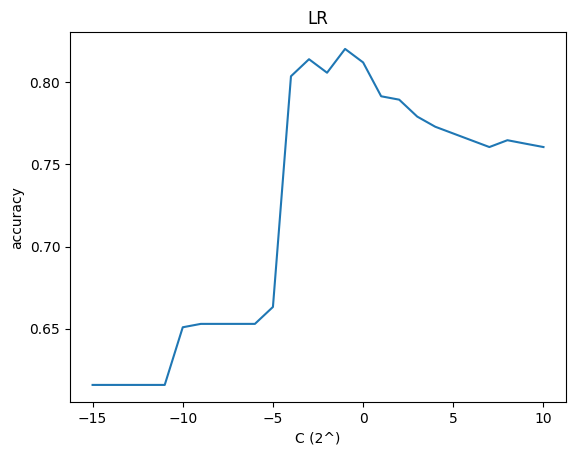

In [14]:
param_lo = {'C': [2**_ for _ in range(-15,11)],
            'penalty': ['l1'],
            'solver': ['liblinear']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
gs_lo.fit(X, y01)

plt.plot(range(-15,11), gs_lo.cv_results_['mean_test_score'])

plt.xlabel('C (2^)')
plt.ylabel('accuracy')
plt.title('LR')

plt.show()

In [ ]:
param_lo = {'C': [0.5],
            'penalty': ['l1', 'l2'],
            'solver': ['liblinear']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
gs_lo.fit(X, y01)
print(gs_lo.cv_results_['mean_test_score'])

print(gs_lo.cv_results_['params'])

[0.82036082 0.78125   ]
[{'C': 0.5, 'penalty': 'l1', 'solver': 'liblinear'}, {'C': 0.5, 'penalty': 'l2', 'solver': 'liblinear'}]


In [ ]:
param_lo = {'penalty': [None],
            'max_iter': [1000]}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
gs_lo.fit(X, y01)
print(gs_lo.cv_results_['mean_test_score'])

print(gs_lo.cv_results_['params'])

[0.76473368]
[{'max_iter': 1000, 'penalty': None}]


### SVM

In [30]:
param_sv_l = {'kernel': ['linear'],
            'C': [2**_ for _ in range(-15,11)]}
gs_sv_l = GridSearchCV(svc, param_sv_l, cv=5, scoring='accuracy')
%time gs_sv_l.fit(X, y01)
print(gs_sv_l.best_params_)
print(gs_sv_l.best_score_)

CPU times: user 4min 20s, sys: 229 ms, total: 4min 20s
Wall time: 4min 23s
{'C': 0.0625, 'kernel': 'linear'}
0.8285867697594502


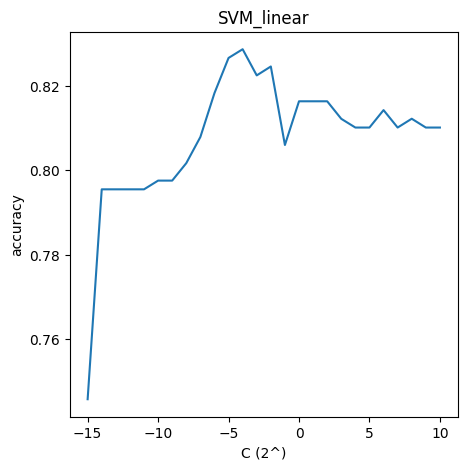

In [31]:
plt.plot(range(-15,11), gs_sv_l.cv_results_['mean_test_score'])

plt.xlabel('C (2^)')
plt.ylabel('accuracy')
plt.title('SVM_linear')

plt.show()

In [32]:
param_sv_r = {'kernel': ['rbf'],
            'C': [2**_ for _ in range(-15,11)],
            'gamma': [2**_ for _ in range(-15,11)]}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

CPU times: user 49.1 s, sys: 65.8 ms, total: 49.1 s
Wall time: 49.6 s
{'C': 1024, 'gamma': 0.015625, 'kernel': 'rbf'}
0.8926975945017182


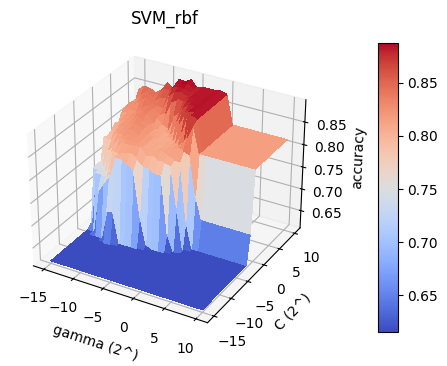

In [33]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
x_3d = range(-15,11)
y_3d = range(-15,11)
x_3d, y_3d = np.meshgrid(x_3d, y_3d)
z_3d = gs_sv_r.cv_results_['mean_test_score'].reshape(26,26)

# Plot the surface.
surf = ax.plot_surface(x_3d, y_3d, z_3d, cmap=cm.coolwarm, linewidth=0, antialiased=False)

ax.set_xlabel('gamma (2^)')
ax.set_ylabel('C (2^)')
ax.set_zlabel('accuracy')

plt.title('SVM_rbf')

# Add a color bar which maps values to colors.
fig.colorbar(surf, location='right', shrink=0.75, aspect=15, anchor=(1.0, 0.5))

plt.show()

### DT

In [46]:
param_dt = {'criterion': ['gini', 'entropy'],
         'splitter': ['random', 'best'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [2]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
%time gs_dt.fit(X, y01)
print(gs_dt.best_params_)
print(gs_dt.best_score_)


CPU times: user 15.1 s, sys: 40.2 ms, total: 15.1 s
Wall time: 15.3 s
{'criterion': 'gini', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'best'}
0.9029639175257731


CPU times: user 3.14 s, sys: 12 ms, total: 3.15 s
Wall time: 3.18 s
{'criterion': 'gini', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'best'}
0.9029639175257731


Text(0.5, 1.0, 'DT')

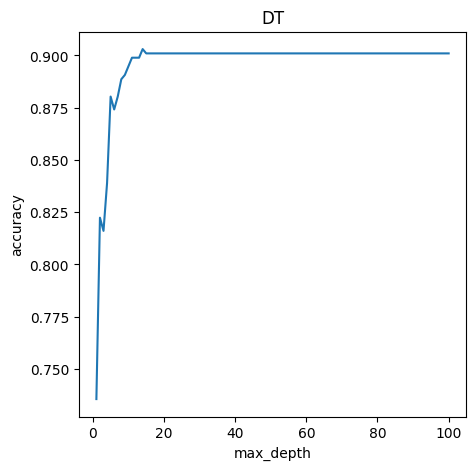

In [34]:
param_dt = {'criterion': ['gini'],
         'splitter': ['best'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [2]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
%time gs_dt.fit(X, y01)
print(gs_dt.best_params_)
print(gs_dt.best_score_)

plt.plot(range(1, 101), gs_dt.cv_results_['mean_test_score'])
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('DT')

In [47]:
param_dt = {'criterion': ['gini', 'entropy'],
         'splitter': ['random', 'best'],
         'max_depth': [14],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [2]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
%time gs_dt.fit(X, y01)

print(gs_dt.cv_results_['params'])
print(gs_dt.cv_results_['mean_test_score'])

CPU times: user 265 ms, sys: 850 µs, total: 266 ms
Wall time: 437 ms
[{'criterion': 'gini', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'random'}, {'criterion': 'gini', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'best'}, {'criterion': 'entropy', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'random'}, {'criterion': 'entropy', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'best'}]
[0.89059278 0.90296392 0.87199313 0.87199313]


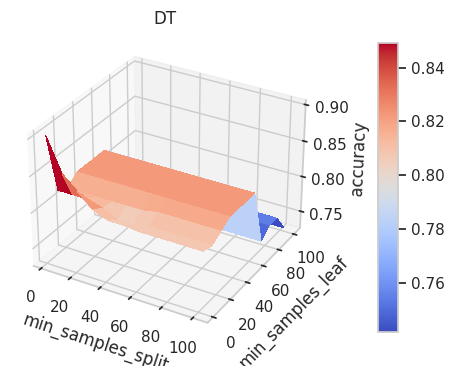

In [ ]:
param_dt = {'criterion': ['gini'],
         'splitter': ['best'],
         'max_depth': [14],
         'min_samples_split': range(2, 103, 10),
         'min_samples_leaf': range(1, 102, 10),
         'random_state': [2]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
gs_dt.fit(X, y01)

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
x_3d = range(2, 103, 10)
y_3d = range(1, 102, 10)
x_3d, y_3d = np.meshgrid(x_3d, y_3d)
z_3d = gs_dt.cv_results_['mean_test_score'].reshape(11,11)

# Plot the surface.
surf = ax.plot_surface(x_3d, y_3d, z_3d, cmap=cm.coolwarm, linewidth=0, antialiased=False)

ax.set_xlabel('min_samples_split')
ax.set_ylabel('min_samples_leaf')
ax.set_zlabel('accuracy')

plt.title('DT')

# Add a color bar which maps values to colors.
fig.colorbar(surf, location='right', shrink=0.75, aspect=15, anchor=(1.0, 0.5))

plt.show()

### RF

In [ ]:
param_rf = {'criterion': ['gini', 'entropy'],
         'max_depth': range(1, 21),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(5, 101, 5),
         'random_state': [2]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X, y01)
print(gs_rf.best_params_)
print(gs_rf.best_score_)


CPU times: user 6min 54s, sys: 2.29 s, total: 6min 57s
Wall time: 7min 3s
{'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 2}
0.8906142611683849


In [42]:
param_rf = {'criterion': ['gini', 'entropy'],
         'max_depth': [11],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': [5],
         'random_state': [2]}

rf_dt = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time rf_dt.fit(X, y01)

print(rf_dt.cv_results_['params'])
print(rf_dt.cv_results_['mean_test_score'])

CPU times: user 293 ms, sys: 1.97 ms, total: 295 ms
Wall time: 512 ms
[{'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 2}, {'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 2}]
[0.89061426 0.86585052]


CPU times: user 4.94 s, sys: 24.8 ms, total: 4.96 s
Wall time: 7.35 s


Text(0.5, 1.0, 'Random Forest')

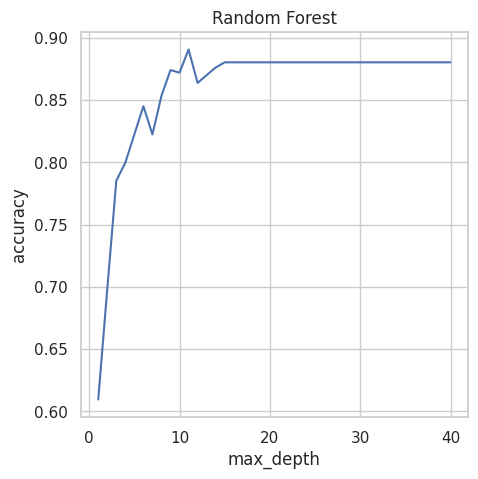

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': range(1, 41),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': [5],
         'random_state': [2]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X, y01)

plt.plot(range(1, 41), gs_rf.cv_results_['mean_test_score'])

plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('Random Forest')



CPU times: user 11 s, sys: 62.8 ms, total: 11.1 s
Wall time: 11.3 s


Text(0.5, 1.0, 'Random Forest')

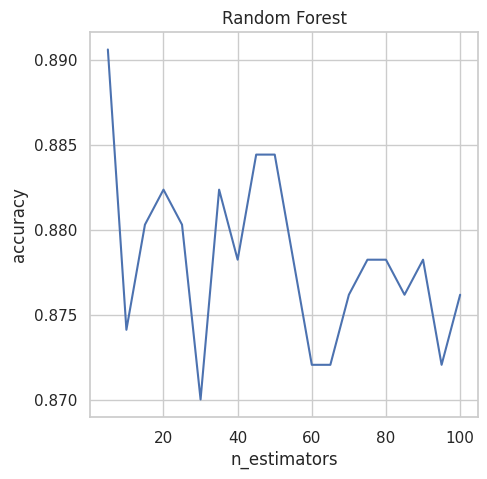

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': [11],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(5, 101, 5),
         'random_state': [2]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X, y01)

plt.plot(range(5, 101, 5), gs_rf.cv_results_['mean_test_score'])

plt.xlabel('n_estimators')
plt.ylabel('accuracy')
plt.title('Random Forest')



In [35]:
param_rf = {'criterion': ['gini'],
         'max_depth': range(1, 41),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(5, 101, 5),
         'random_state': [2]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X, y01)
print(gs_rf.best_params_)
print(gs_rf.best_score_)



CPU times: user 6min 16s, sys: 1.21 s, total: 6min 17s
Wall time: 6min 21s
{'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 2}
0.8906142611683849


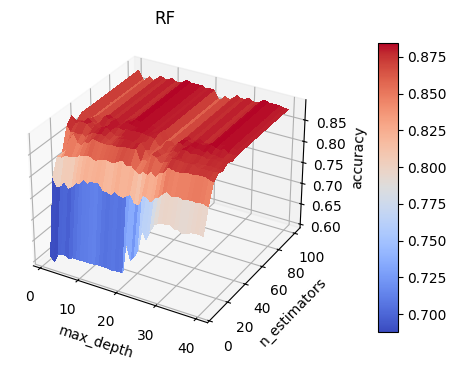

In [36]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
x_3d = range(1, 41)
y_3d = range(5, 101, 5)
x_3d, y_3d = np.meshgrid(x_3d, y_3d)
z_3d = gs_rf.cv_results_['mean_test_score'].reshape(20,40)

# Plot the surface.
surf = ax.plot_surface(x_3d, y_3d, z_3d, cmap=cm.coolwarm, linewidth=0, antialiased=False)

ax.set_xlabel('max_depth')
ax.set_ylabel('n_estimators')
ax.set_zlabel('accuracy')

plt.title('RF')

# Add a color bar which maps values to colors.
fig.colorbar(surf, location='right', shrink=0.75, aspect=15, anchor=(1.0, 0.5))

plt.show()

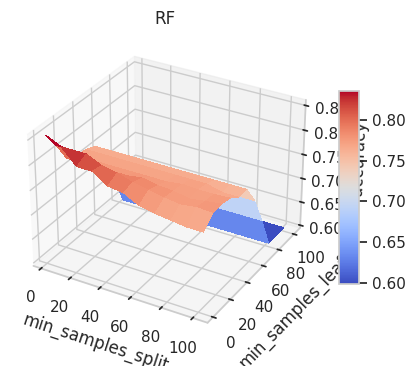

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': [12],
         'min_samples_split': range(2, 103, 10),
         'min_samples_leaf': range(1, 102, 10),
         'n_estimators': [30],
         'random_state': [20]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
gs_rf.fit(X, y01)

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
x_3d = range(2, 103, 10)
y_3d = range(1, 102, 10)
x_3d, y_3d = np.meshgrid(x_3d, y_3d)
z_3d = gs_rf.cv_results_['mean_test_score'].reshape(11,11)

# Plot the surface.
surf = ax.plot_surface(x_3d, y_3d, z_3d, cmap=cm.coolwarm, linewidth=0, antialiased=False)

# Customize the z axis.
#ax.set_zlim(0.7, 0.9)
#ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
#ax.zaxis.set_major_formatter('{x:.1f}')

ax.set_xlabel('min_samples_split')
ax.set_ylabel('min_samples_leaf')
ax.set_zlabel('accuracy')
#plt.xlabel('gamma')
#plt.ylabel('C')
#plt.zlabel('gamma')
plt.title('RF')

# Add a color bar which maps values to colors.
fig.colorbar(surf, location='right', shrink=0.5, aspect=10)

plt.show()

### Ada

In [37]:
param_ad = {'n_estimators': range(5, 105, 5),
            'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1, 10 ,100, 1000, 10000]}
gs_ad = GridSearchCV(ada, param_ad, cv=5, scoring='accuracy')
%time gs_ad.fit(X, y01)
print(gs_ad.best_params_)
print(gs_ad.best_score_)

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: UserWarning: Sample weights have reached infinite values, at iteration 1, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: UserWarning: Sample weights have reached infinite values, at iteration 1, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packa

CPU times: user 1min 20s, sys: 209 ms, total: 1min 20s
Wall time: 1min 39s
{'learning_rate': 1, 'n_estimators': 15}
0.863659793814433


CPU times: user 1min 2s, sys: 391 ms, total: 1min 2s
Wall time: 1min 3s

{'learning_rate': 1, 'n_estimators': 15}

0.863659793814433

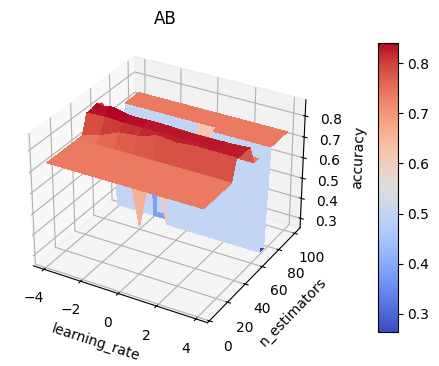

In [38]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
x_3d = range(-4,5)
y_3d = range(5, 101, 5)
x_3d, y_3d = np.meshgrid(x_3d, y_3d)
z_3d = gs_ad.cv_results_['mean_test_score'].reshape(20,9)

# Plot the surface.
surf = ax.plot_surface(x_3d, y_3d, z_3d, cmap=cm.coolwarm, linewidth=0, antialiased=False)

ax.set_xlabel('learning_rate')
ax.set_ylabel('n_estimators')
ax.set_zlabel('accuracy')

plt.title('AB')

fig.colorbar(surf, location='right', shrink=0.75, aspect=15, anchor=(1.0, 0.5))

plt.show()

### XGB

In [39]:
param_xg = {'n_estimators': range(5, 105, 5),
            'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1, 10 ,100, 1000, 10000]}
gs_xg = GridSearchCV(xgb, param_xg, cv=5, scoring='accuracy')
%time gs_xg.fit(X, y01)
print(gs_xg.best_params_)
print(gs_xg.best_score_)

CPU times: user 1min 10s, sys: 1.02 s, total: 1min 11s
Wall time: 52.6 s
{'learning_rate': 1, 'n_estimators': 10}
0.8967783505154638


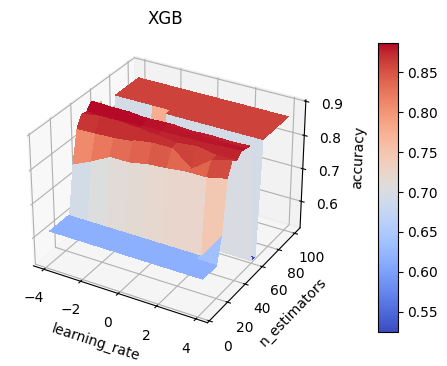

In [40]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
x_3d = range(-4,5)
y_3d = range(5, 101, 5)
x_3d, y_3d = np.meshgrid(x_3d, y_3d)
z_3d = gs_xg.cv_results_['mean_test_score'].reshape(20,9)

# Plot the surface.
surf = ax.plot_surface(x_3d, y_3d, z_3d, cmap=cm.coolwarm, linewidth=0, antialiased=False)

ax.set_xlabel('learning_rate')
ax.set_ylabel('n_estimators')
ax.set_zlabel('accuracy')

plt.title('XGB')

fig.colorbar(surf, location='right', shrink=0.75, aspect=15, anchor=(1.0, 0.5))

plt.show()

### MLP


In [ ]:
model = Sequential()
model.add(layers.Dense(512, activation='relu', input_shape=(20,)))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
optimizer = keras.optimizers.RMSprop(learning_rate=0.5)
model.compile(optimizer=optimizer, loss='BinaryCrossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_34 (Dense)                │ (None, 512)            │        10,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,649 (170.50 KB)

 Trainable params: 43,649 (170.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X, y01, epochs=100, validation_split=0.2) #, batch_size=32, verbose=0, shuffle=False
print(model.evaluate(X, y01))

Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.5345 - loss: 67298.6016 - val_accuracy: 0.4949 - val_loss: 17.6231
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6511 - loss: 2.0313 - val_accuracy: 0.5455 - val_loss: 3.1263
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5645 - loss: 1.2561 - val_accuracy: 0.4949 - val_loss: 0.7097
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.6116 - loss: 0.6520 - val_accuracy: 0.4949 - val_loss: 0.6442
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.5806 - loss: 0.7273 - val_accuracy: 0.6263 - val_loss: 0.6229
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6509 - loss: 0.6765 - val_accuracy: 0.5051 - val_loss: 0.6993
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4721 - loss: 0.7450 - val_accuracy: 0.4949 - val_loss: 0.9099
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6568 - loss: 0.6379 - val_accurac

## Final Model & Evaluation

In [17]:
#initialize

knc = KNeighborsClassifier(metric='euclidean', n_neighbors=51, weights='distance')
lor = LogisticRegression(C=0.5, penalty='l1', solver='liblinear')
svc = SVC(C=2**10, gamma=0.015625, kernel='rbf')
dtc = DecisionTreeClassifier(criterion='gini', max_depth=14, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
rfc = RandomForestClassifier(criterion='gini', max_depth=11, min_samples_leaf=1, min_samples_split=2, n_estimators=5, random_state=2)
ada = AdaBoostClassifier(learning_rate=1, n_estimators=15)
xgb = XGBClassifier(learning_rate=1, n_estimators=10)

kf = KFold(n_splits=5, shuffle=False)


In [ ]:
kf_knc = cross_val_score(knc, X, y01, cv=kf, scoring='accuracy')
print(kf_knc.mean(), kf_knc.std())

0.902942439862543 0.06534069960291367


In [ ]:
kf_lor = cross_val_score(lor, X, y01, cv=kf, scoring='accuracy')
print(kf_lor.mean(), kf_lor.std())

0.8532860824742269 0.05923477219332033


In [ ]:
kf_svc = cross_val_score(svc, X, y01, cv=kf, scoring='accuracy')
print(kf_svc.mean(), kf_svc.std())

0.8885524054982818 0.11756176004218202


In [ ]:
kf_dtc = cross_val_score(dtc, X, y01, cv=kf, scoring='accuracy')
print(kf_dtc.mean(), kf_dtc.std())

0.9091280068728522 0.06877791663621698


In [ ]:
kf_rfc = cross_val_score(rfc, X, y01, cv=kf, scoring='accuracy')
print(kf_rfc.mean(), kf_rfc.std())

0.8967568728522336 0.08085613127501134


In [ ]:
kf_ada = cross_val_score(ada, X, y01, cv=kf, scoring='accuracy')
print(kf_ada.mean(), kf_ada.std())

0.8636168384879724 0.05397384203307856


In [ ]:
kf_xgb = cross_val_score(xgb, X, y01, cv=kf, scoring='accuracy')
print(kf_xgb.mean(), kf_xgb.std())

0.8988187285223368 0.06493960341254196


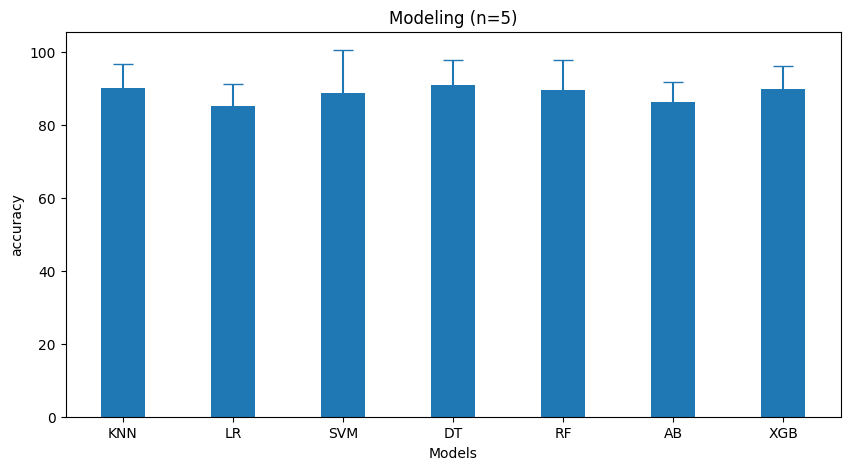

In [41]:
#Visualize

bar = {'KNN':90.29, 'LR':85.33, 'SVM':88.86, 'DT':90.91, 'RF':89.68, 'AB':86.36, 'XGB':89.88}
error = np.array([6.53, 5.92, 11.76, 6.88, 8.09, 5.40, 6.49])
courses = list(bar.keys())
values = list(bar.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, width = 0.4, color=plt.cm.tab10.colors[0])
plt.errorbar(courses, values, error, capsize=7, linestyle='None', ecolor=plt.cm.tab10.colors[0])

plt.xlabel("Models")
plt.ylabel("accuracy")
plt.title('Modeling (n=5)')

plt.show()


In [18]:
#df_encoded
X_aca = df_encoded[:][df_encoded['flavonoid_Acacetin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_aca = df_encoded[:][df_encoded['flavonoid_Acacetin']==1]['v01']

X_apg = df_encoded[:][df_encoded['flavonoid_Apigenin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_apg = df_encoded[:][df_encoded['flavonoid_Apigenin']==1]['v01']

X_chr = df_encoded[:][df_encoded['flavonoid_Chrysin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_chr = df_encoded[:][df_encoded['flavonoid_Chrysin']==1]['v01']

X_gal = df_encoded[:][df_encoded['flavonoid_Galangin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_gal = df_encoded[:][df_encoded['flavonoid_Galangin']==1]['v01']

X_kae = df_encoded[:][df_encoded['flavonoid_Kaempferol']==1].drop(['viability-mean', 'v01'], axis=1)
y01_kae = df_encoded[:][df_encoded['flavonoid_Kaempferol']==1]['v01']

X_lut = df_encoded[:][df_encoded['flavonoid_Luteolin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_lut = df_encoded[:][df_encoded['flavonoid_Luteolin']==1]['v01']

X_myr = df_encoded[:][df_encoded['flavonoid_Myricetin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_myr = df_encoded[:][df_encoded['flavonoid_Myricetin']==1]['v01']

X_que = df_encoded[:][df_encoded['flavonoid_Quercetin']==1].drop(['viability-mean', 'v01'], axis=1)
y01_que = df_encoded[:][df_encoded['flavonoid_Quercetin']==1]['v01']

In [19]:
#fit & validation

dtc.fit(X_aca, y01_aca)
dtc_aca = dtc.predict(X_aca)
dtc.fit(X_apg, y01_apg)
dtc_apg = dtc.predict(X_apg)
dtc.fit(X_chr, y01_chr)
dtc_chr = dtc.predict(X_chr)
dtc.fit(X_gal, y01_gal)
dtc_gal = dtc.predict(X_gal)
dtc.fit(X_kae, y01_kae)
dtc_kae = dtc.predict(X_kae)
dtc.fit(X_lut, y01_lut)
dtc_lut = dtc.predict(X_lut)
dtc.fit(X_myr, y01_myr)
dtc_myr = dtc.predict(X_myr)
dtc.fit(X_que, y01_que)
dtc_que = dtc.predict(X_que)


In [ ]:
print("aca (Train): ", accuracy_score(y01_aca, dtc_aca))
print("apg (Train): ", accuracy_score(y01_apg, dtc_apg))
print("chr (Train): ", accuracy_score(y01_chr, dtc_chr))
print("gal (Train): ", accuracy_score(y01_gal, dtc_gal))
print("kae (Train): ", accuracy_score(y01_kae, dtc_kae))
print("lut (Train): ", accuracy_score(y01_lut, dtc_lut))
print("myr (Train): ", accuracy_score(y01_myr, dtc_myr))
print("que (Train): ", accuracy_score(y01_que, dtc_que))


aca (Train):  1.0
apg (Train):  1.0
chr (Train):  0.9782608695652174
gal (Train):  1.0
kae (Train):  0.96
lut (Train):  1.0
myr (Train):  1.0
que (Train):  1.0


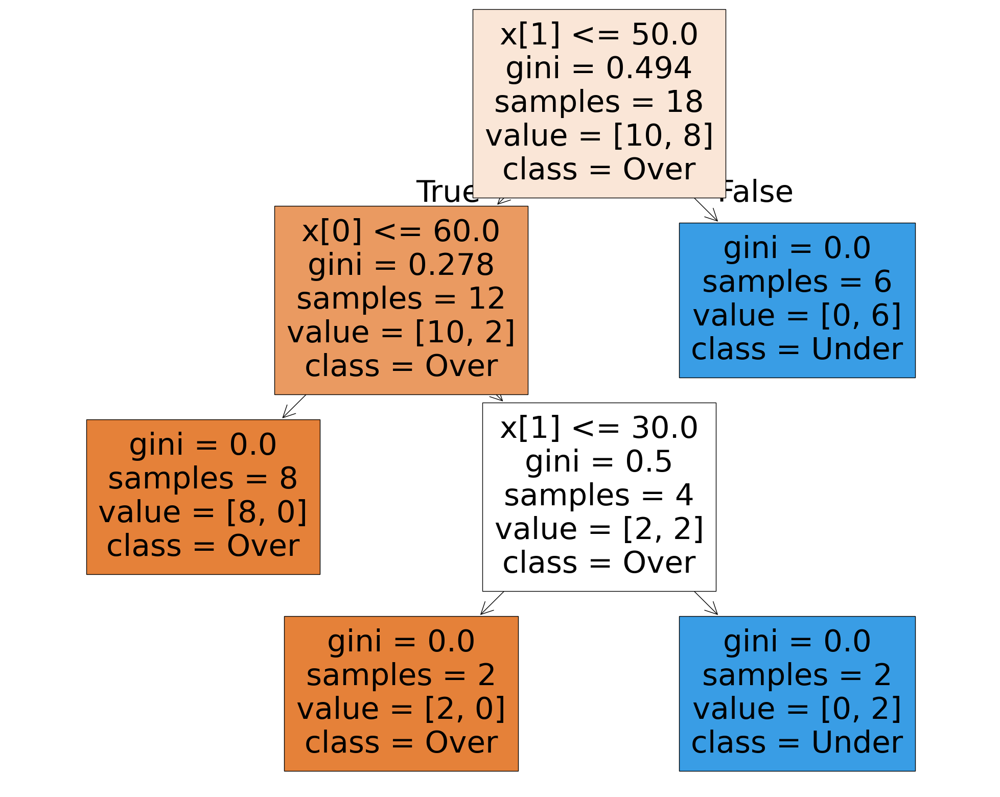

In [20]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_aca, y01_aca)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

[Text(0.6, 0.9166666666666666, 'x[1] <= 77.5\ngini = 0.386\nsamples = 69\nvalue = [51, 18]\nclass = Over'),
 Text(0.3333333333333333, 0.75, 'x[11] <= 0.5\ngini = 0.241\nsamples = 50\nvalue = [43.0, 7.0]\nclass = Over'),
 Text(0.4666666666666667, 0.8333333333333333, 'True  '),
 Text(0.2, 0.5833333333333334, 'x[1] <= 35.0\ngini = 0.19\nsamples = 47\nvalue = [42, 5]\nclass = Over'),
 Text(0.13333333333333333, 0.4166666666666667, 'gini = 0.0\nsamples = 27\nvalue = [27, 0]\nclass = Over'),
 Text(0.26666666666666666, 0.4166666666666667, 'x[14] <= 0.5\ngini = 0.375\nsamples = 20\nvalue = [15, 5]\nclass = Over'),
 Text(0.13333333333333333, 0.25, 'x[1] <= 67.5\ngini = 0.133\nsamples = 14\nvalue = [13, 1]\nclass = Over'),
 Text(0.06666666666666667, 0.08333333333333333, 'gini = 0.0\nsamples = 11\nvalue = [11, 0]\nclass = Over'),
 Text(0.2, 0.08333333333333333, 'gini = 0.444\nsamples = 3\nvalue = [2, 1]\nclass = Over'),
 Text(0.4, 0.25, 'x[0] <= 36.0\ngini = 0.444\nsamples = 6\nvalue = [2, 4]\ncla

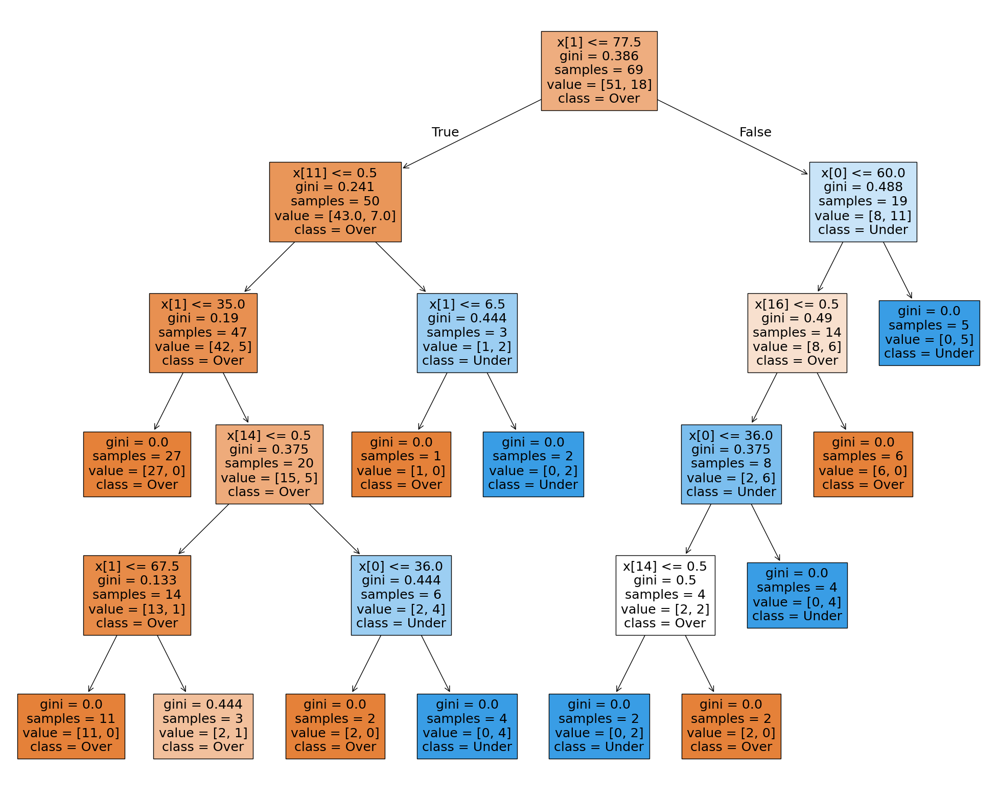

In [26]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_apg, y01_apg)

fig = plt.figure(figsize=(25,20))
plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

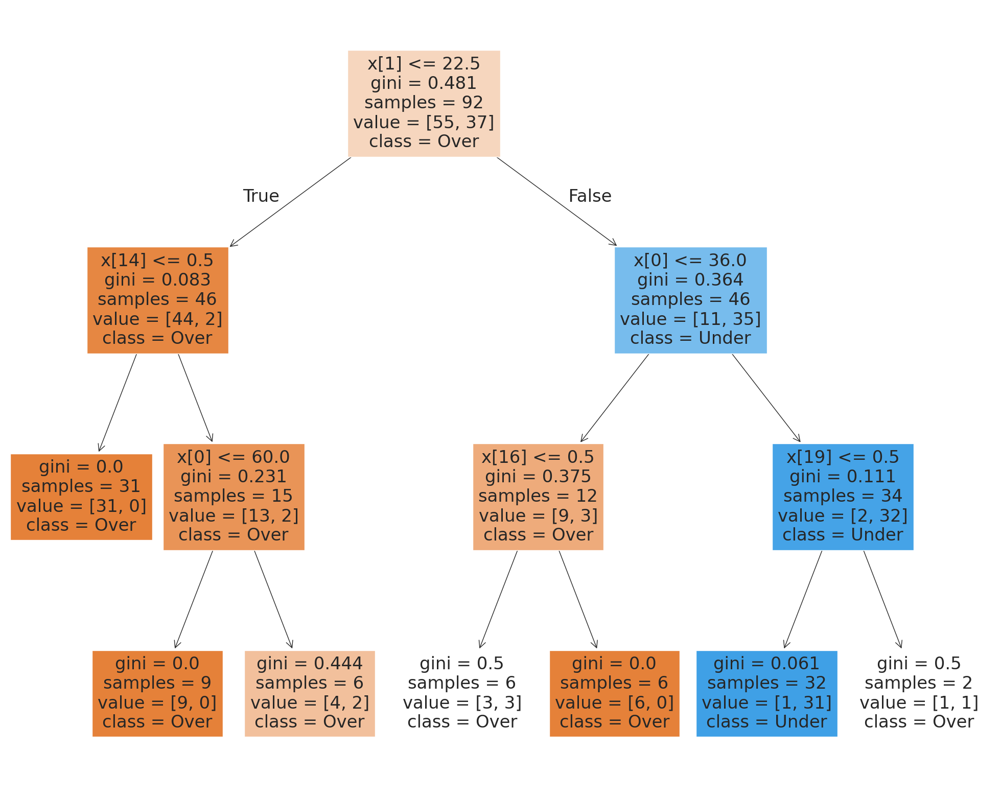

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_chr, y01_chr)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

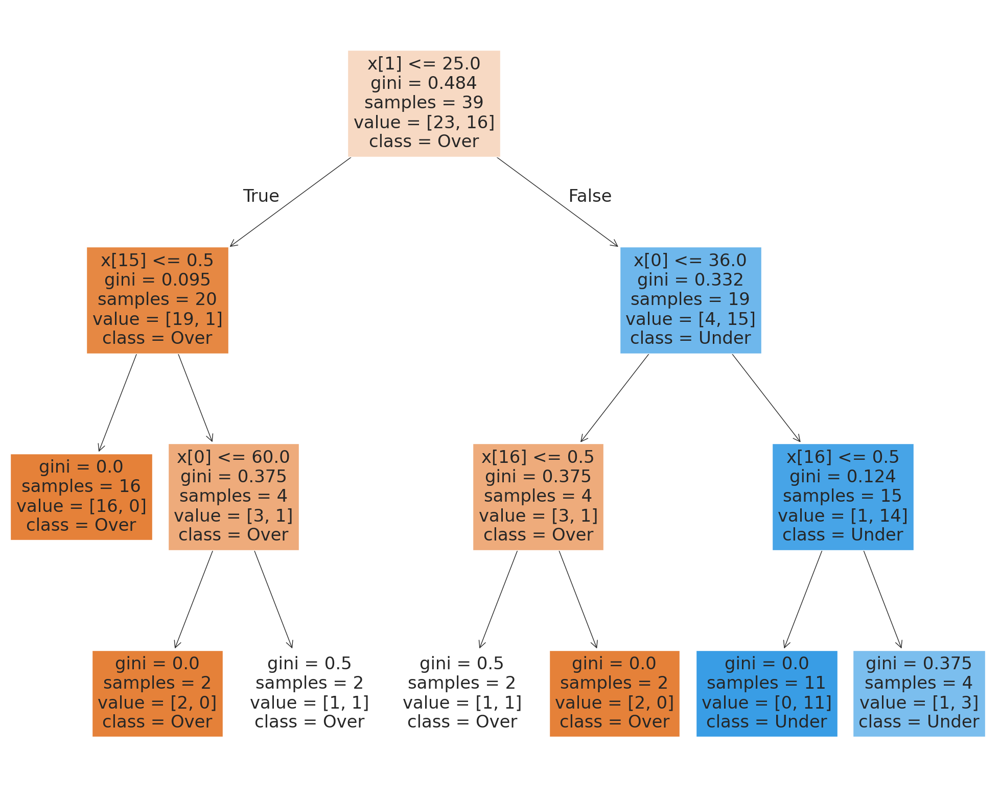

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_gal, y01_gal)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

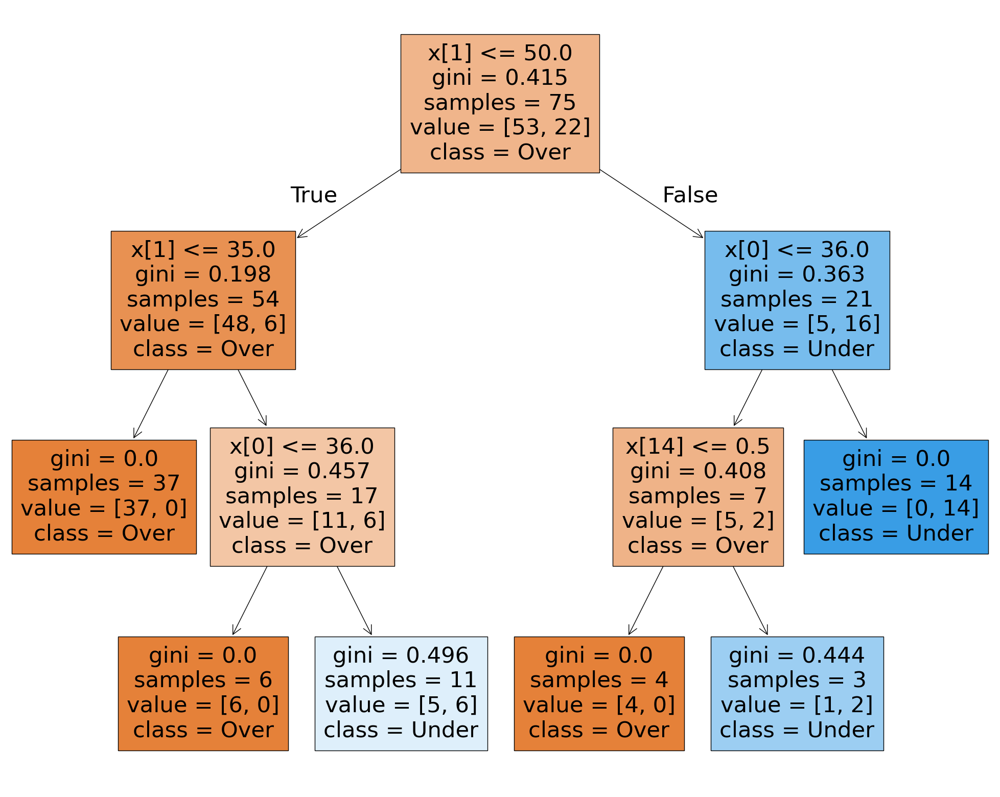

In [25]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_kae, y01_kae)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

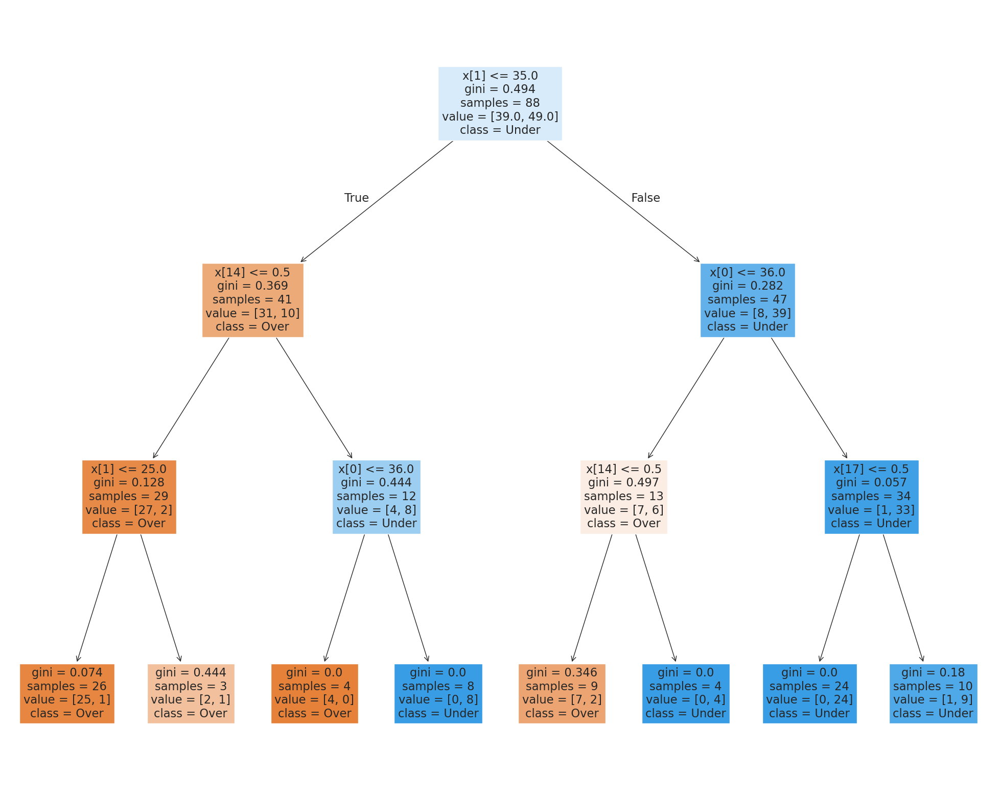

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_lut, y01_lut)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

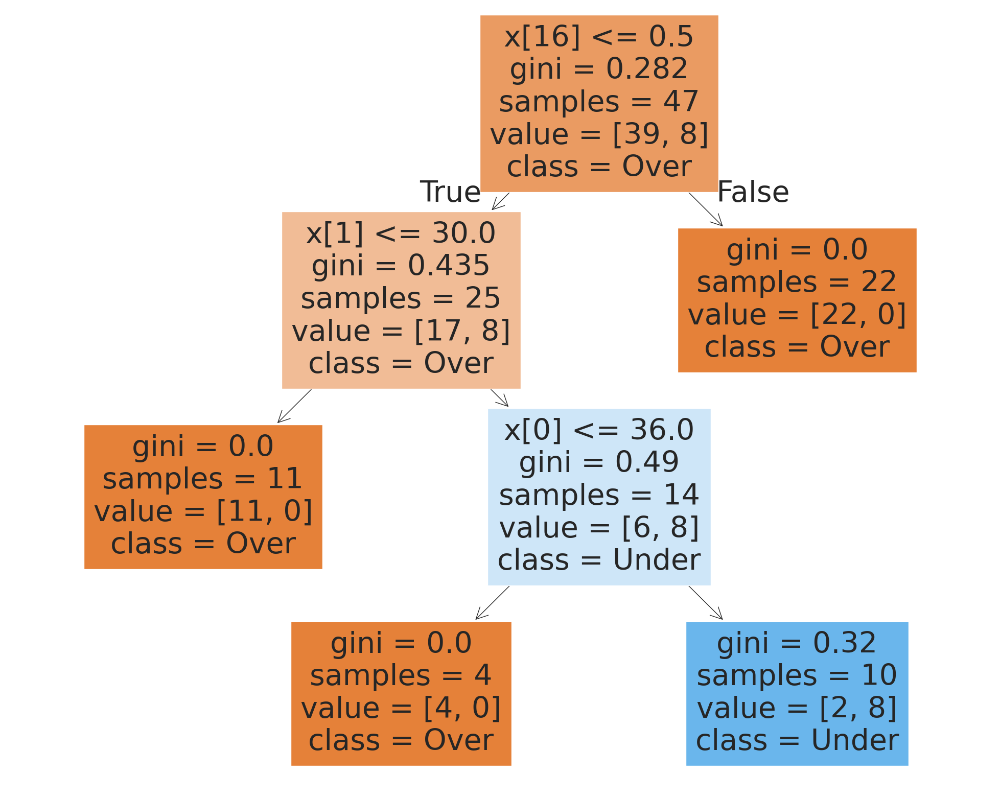

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_myr, y01_myr)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

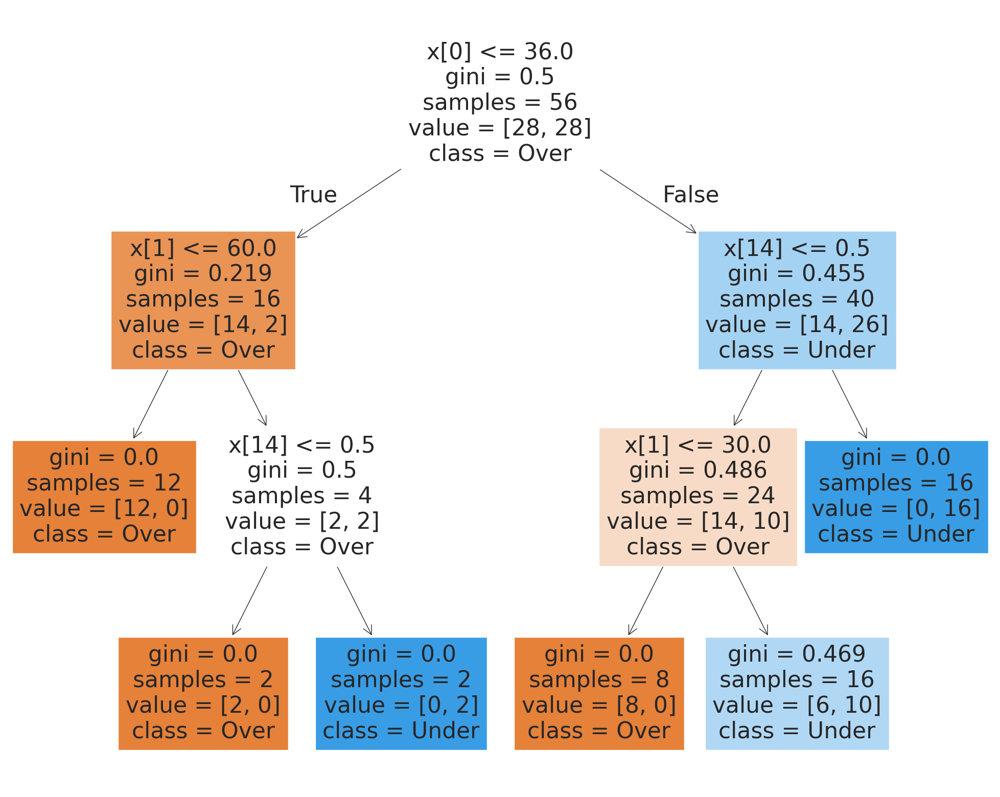

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
dtc.fit(X_que, y01_que)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, class_names=['Over', 'Under'], filled=True)

## Correlation & EFS

<Axes: >

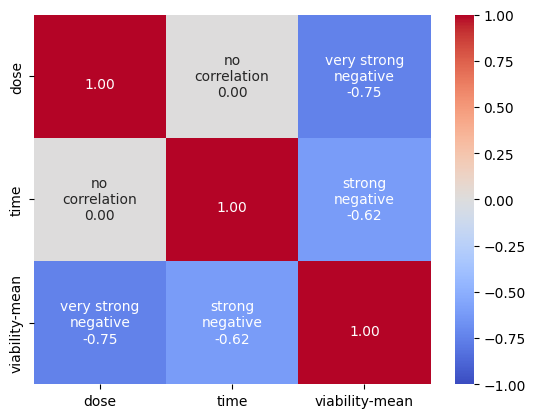

In [ ]:
matrix11 = df.loc[df['flavonoid']=='Acacetin', ['dose', 'time', 'viability-mean']].corr()

text11 = np.array([['', 'no\ncorrelation', 'very strong\nnegative'],
 ['no\ncorrelation', '', 'strong\nnegative'],
 ['very strong\nnegative', 'strong\nnegative', '']])

matrix11_arr = np.array(matrix11)

formatted_text11 = (np.asarray(["{0}\n{1:.2f}".format(text11, matrix11) for text11, matrix11
                                in zip(text11.flatten(), matrix11_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix11, annot=formatted_text11, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

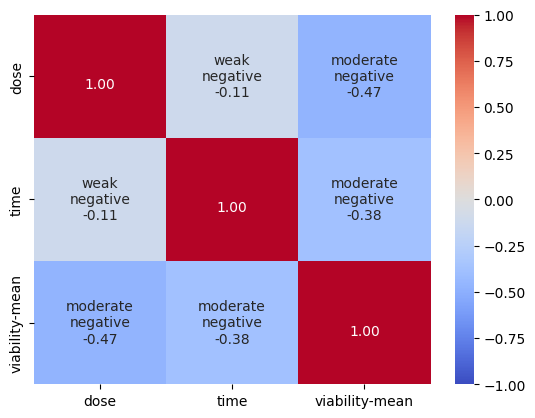

In [ ]:
matrix12 = df.loc[df['flavonoid']=='Apigenin', ['dose', 'time', 'viability-mean']].corr()

text12 = np.array([['', 'weak\nnegative', 'moderate\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['moderate\nnegative', 'moderate\nnegative', '']])

matrix12_arr = np.array(matrix12)

formatted_text12 = (np.asarray(["{0}\n{1:.2f}".format(text12, matrix12) for text12, matrix12
                                in zip(text12.flatten(), matrix12_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix12, annot=formatted_text12, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

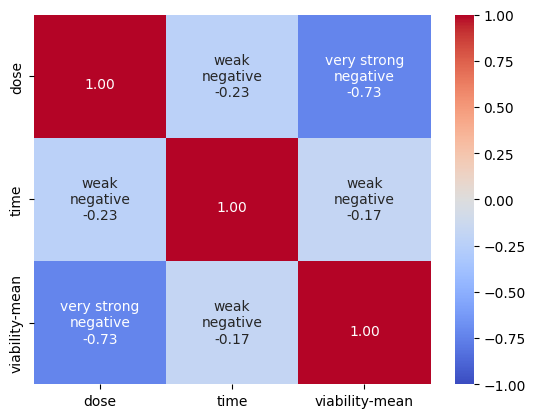

In [ ]:
matrix13 = df.loc[df['flavonoid']=='Chrysin', ['dose', 'time', 'viability-mean']].corr()

text13 = np.array([['', 'weak\nnegative', 'very strong\nnegative'],
 ['weak\nnegative', '', 'weak\nnegative'],
 ['very strong\nnegative', 'weak\nnegative', '']])

matrix13_arr = np.array(matrix13)

formatted_text13 = (np.asarray(["{0}\n{1:.2f}".format(text13, matrix13) for text13, matrix13
                                in zip(text13.flatten(), matrix13_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix13, annot=formatted_text13, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

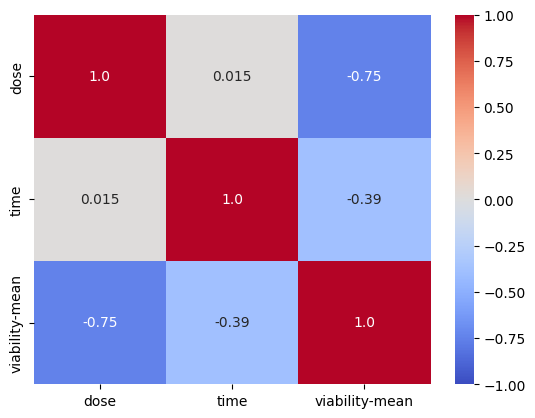

In [ ]:
matrix21 = df.loc[df['flavonoid']=='Galangin', ['dose', 'time', 'viability-mean']].corr()

text21 = np.array([['', 'weak\npositive', 'very strong\nnegative'],
 ['weak\npositive', '', 'moderate\nnegative'],
 ['very strong\nnegative', 'moderate\nnegative', '']])

sns.heatmap(matrix21, annot=True, fmt=".2", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

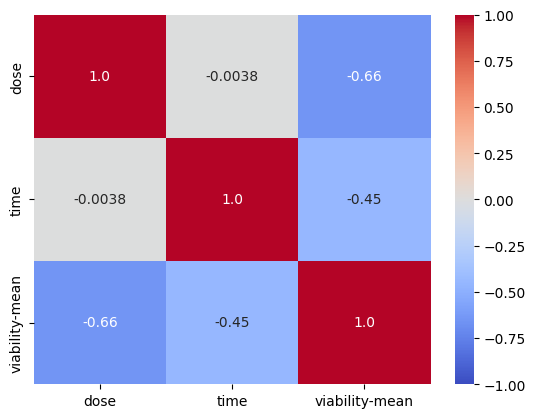

In [ ]:
matrix22 = df.loc[df['flavonoid']=='Kaempferol', ['dose', 'time', 'viability-mean']].corr()

text22 = np.array([['', 'no\ncorrelation', 'strong\nnegative'],
 ['no\ncorrelation', '', 'moderate\nnegative'],
 ['strong\nnegative', 'moderate\nnegative', '']])

sns.heatmap(matrix22, annot=True, fmt=".2", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

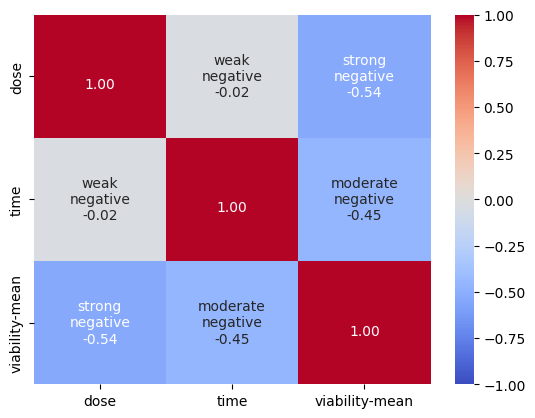

In [ ]:
matrix23 = df.loc[df['flavonoid']=='Luteolin', ['dose', 'time', 'viability-mean']].corr()

text23 = np.array([['', 'weak\nnegative', 'strong\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['strong\nnegative', 'moderate\nnegative', '']])

matrix23_arr = np.array(matrix23)

formatted_text23 = (np.asarray(["{0}\n{1:.2f}".format(text23, matrix23) for text23, matrix23
                                in zip(text23.flatten(), matrix23_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix23, annot=formatted_text23, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

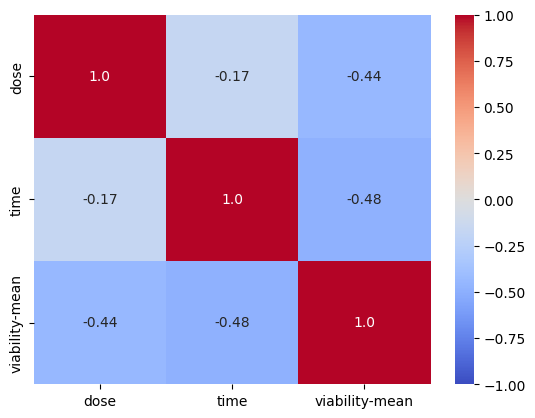

In [ ]:
matrix31 = df.loc[df['flavonoid']=='Myricetin', ['dose', 'time', 'viability-mean']].corr()

text31 = np.array([['', 'weak\nnegative', 'moderate\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['moderate\nnegative', 'moderate\nnegative', '']])

sns.heatmap(matrix31, annot=True, fmt=".2", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

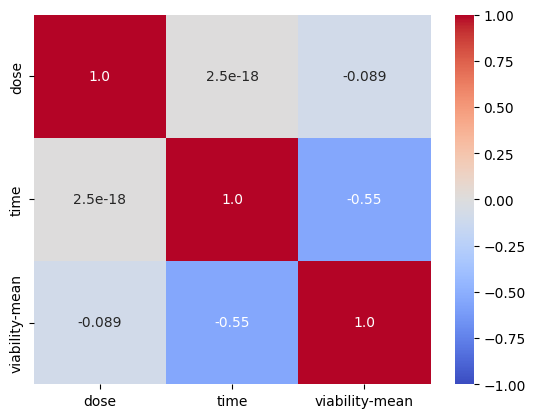

In [ ]:
matrix32 = df.loc[df['flavonoid']=='Quercetin', ['dose', 'time', 'viability-mean']].corr()

text32 = np.array([['', 'no\ncorrelation', 'weak\nnegative'],
 ['no\ncorrelation', '', 'strong\nnegative'],
 ['weak\nnegative', 'strong\nnegative', '']])

sns.heatmap(matrix32, annot=True, fmt=".2", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

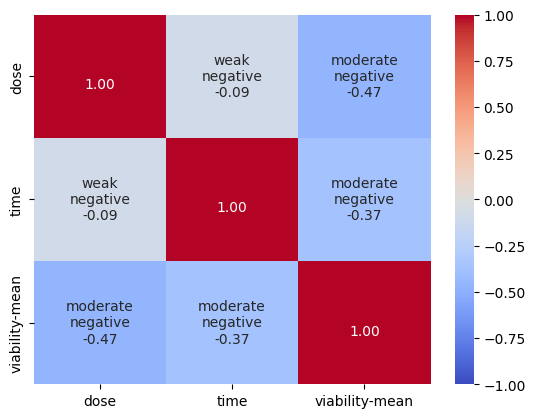

In [ ]:
matrix = df.loc[:, ['dose', 'time', 'viability-mean']].corr()

text = np.array([['', 'weak\nnegative', 'moderate\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['moderate\nnegative', 'moderate\nnegative', '']])

matrix_arr = np.array(matrix)

formatted_text = (np.asarray(["{0}\n{1:.2f}".format(text, matrix) for text, matrix
                                in zip(text.flatten(), matrix_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix, annot=formatted_text, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

Text(0.5, 1.0, 'All Flavonoids')

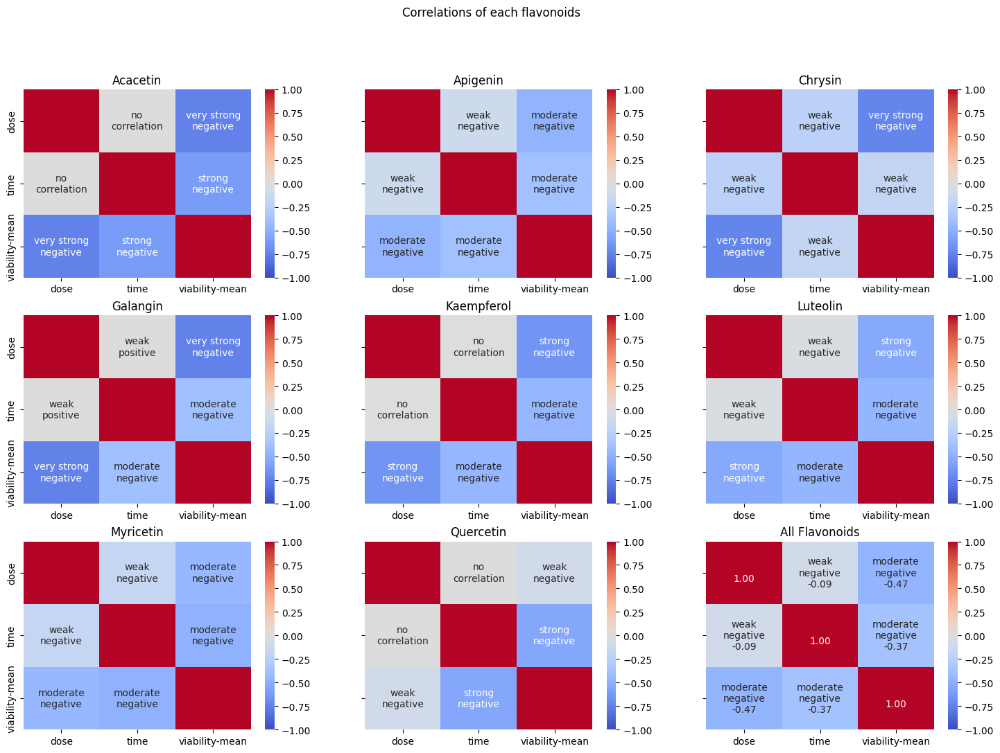

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(18, 12), sharey=True)
fig.suptitle('Correlations of each flavonoids')

sns.heatmap(matrix11, annot=text11, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 0])
axes[0, 0].set_title('Acacetin')

sns.heatmap(matrix12, annot=text12, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 1])
axes[0, 1].set_title('Apigenin')

sns.heatmap(matrix13, annot=text13, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 2])
axes[0, 2].set_title('Chrysin')

sns.heatmap(matrix21, annot=text21, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 0])
axes[1, 0].set_title('Galangin')

sns.heatmap(matrix22, annot=text22, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 1])
axes[1, 1].set_title('Kaempferol')

sns.heatmap(matrix23, annot=text23, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 2])
axes[1, 2].set_title('Luteolin')

sns.heatmap(matrix31, annot=text31, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 0])
axes[2, 0].set_title('Myricetin')

sns.heatmap(matrix32, annot=text32, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 1])
axes[2, 1].set_title('Quercetin')

sns.heatmap(matrix, annot=formatted_text, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 2])
axes[2, 2].set_title('All Flavonoids')


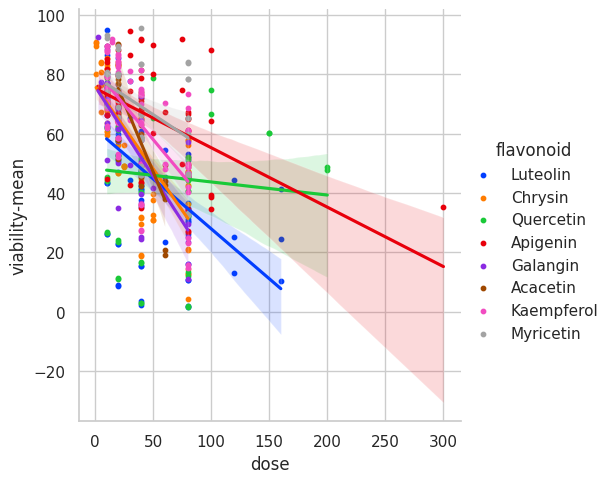

In [ ]:
sns.set(style="whitegrid") #darkgrid, whitegrid, dark, white, and ticks.
sns.lmplot(x="dose", y="viability-mean", hue="flavonoid", data=df, palette="bright", scatter_kws={"s": 10, "alpha": 1})


In [ ]:
dtr = DecisionTreeRegressor()

efs = EFS(dtr, min_features=1, max_features=2, scoring='r2', print_progress=True, cv=5)
efs = efs.fit(X, y)

print('Best accuracy score: ', efs.best_score_)
print('Best subset (indices):', efs.best_idx_)
print('Best subset (corresponding names):', efs.best_feature_names_)
print(efs.subsets_[0],'\n',efs.subsets_[1])
#efs.subsets_

Features: 210/210

Best accuracy score:  0.3397373711944995
Best subset (indices): (0, 1)
Best subset (corresponding names): ('time', 'dose')
{'feature_idx': (0,), 'cv_scores': array([ 0.02466742,  0.08275531,  0.18132886, -0.12630324,  0.0672995 ]), 'avg_score': np.float64(0.04594956975442628), 'feature_names': ('time',)} 
 {'feature_idx': (1,), 'cv_scores': array([ 0.12787343,  0.24138486,  0.27332253, -0.02973756,  0.08175522]), 'avg_score': np.float64(0.1389196974171606), 'feature_names': ('dose',)}


In [ ]:
#flavonoid
s = 0.0
for i in range (2,10):
  print(efs.subsets_[i]['feature_names'])
  s = s + efs.subsets_[i]['avg_score']
print(s/8)

('flavonoid_Acacetin',)
('flavonoid_Apigenin',)
('flavonoid_Chrysin',)
('flavonoid_Galangin',)
('flavonoid_Kaempferol',)
('flavonoid_Luteolin',)
('flavonoid_Myricetin',)
('flavonoid_Quercetin',)
-0.0999766649612458


In [ ]:
#cell_line
s = 0.0
for i in range (10,20):
  print(efs.subsets_[i]['feature_names'])
  s = s + efs.subsets_[i]['avg_score']
print(s/10)

('cell line_KYSE150',)
('cell line_KYSE30',)
('cell line_KYSE410',)
('cell line_KYSE450',)
('cell line_KYSE510',)
('cell line_OE19',)
('cell line_OE33',)
('cell line_TE-1',)
('cell line_TE-10',)
('cell line_YES2',)
-0.09282086880527793


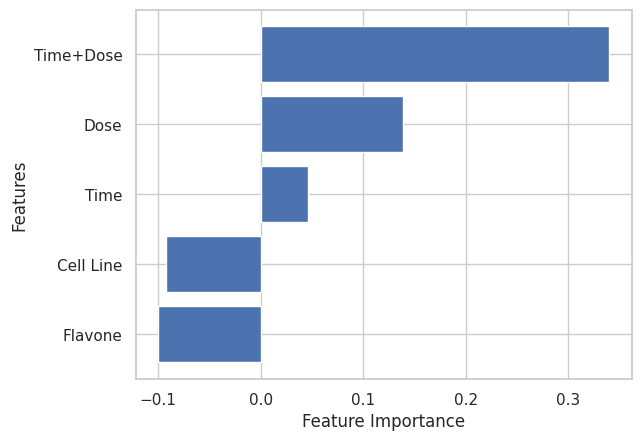

In [ ]:
y_for_bar=['Flavone', 'Cell Line', 'Time', 'Dose', 'Time+Dose']

# getting values against each value of y
x_for_bar=[-0.0999766649612458, -0.09282086880527793, 0.04594956975442628, 0.1389196974171606, 0.3397373711944995]
plt.barh(y_for_bar, x_for_bar)

# setting label of y-axis
plt.ylabel("Features")

# setting label of x-axis
plt.xlabel("Feature Importance")
#plt.title("Horizontal bar graph")
#plt.grid(axis='x')
plt.show()

## Simple Model


In [13]:
X_simple = X[['time', 'dose']]
X_simple

,time,dose
0,48,10.0
1,48,20.0
2,48,40.0
3,48,80.0
4,72,10.0
...,...,...
479,24,20.0
480,24,40.0
481,24,60.0
482,24,80.0


In [ ]:
param_kn = {'n_neighbors': range(3, 100, 2),
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
%time gs_kn.fit(X_simple, y01)
print(gs_kn.best_params_)
print(gs_kn.best_score_)

CPU times: user 15.2 s, sys: 81.1 ms, total: 15.3 s
Wall time: 23.2 s
{'metric': 'euclidean', 'n_neighbors': 21, 'weights': 'uniform'}
0.8305412371134022


In [ ]:
param_lo = {'penalty': ['l1', 'l2'],
            'C': [2**_ for _ in range(-15,11)],
            'solver': ['liblinear']}

gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
%time gs_lo.fit(X_simple, y01)
print(gs_lo.best_params_)
print(gs_lo.best_score_)

CPU times: user 2.08 s, sys: 11.8 ms, total: 2.09 s
Wall time: 2.89 s
{'C': 0.5, 'penalty': 'l1', 'solver': 'liblinear'}
0.814024914089347


In [ ]:
param_sv_r = {'kernel': ['rbf'],
            'C': [2**_ for _ in range(-15,11)],
            'gamma': [2**_ for _ in range(-15,11)]}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X_simple, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

CPU times: user 49 s, sys: 153 ms, total: 49.1 s
Wall time: 1min
{'C': 2, 'gamma': 0.0009765625, 'kernel': 'rbf'}
0.8346649484536084


In [ ]:
param_dt = {'criterion': ['gini', 'entropy'],
         'splitter': ['best'],
         'max_depth': range(1, 21),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [2]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
%time gs_dt.fit(X_simple, y01)
print(gs_dt.best_params_)
print(gs_dt.best_score_)


CPU times: user 1.68 s, sys: 12 ms, total: 1.7 s
Wall time: 2.95 s
{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 2, 'splitter': 'best'}
0.824355670103093


In [ ]:
param_rf = {'criterion': ['gini', 'entropy'],
         'max_depth': range(1, 21),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(5, 101, 5),
         'random_state': [2]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_simple, y01)
print(gs_rf.best_params_)
print(gs_rf.best_score_)


CPU times: user 6min 47s, sys: 2.76 s, total: 6min 50s
Wall time: 7min 9s
{'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 15, 'random_state': 2}
0.826417525773196


In [ ]:
param_ad = {'n_estimators': range(5, 105, 5),
            'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1, 10 ,100, 1000, 10000]}
gs_ad = GridSearchCV(ada, param_ad, cv=5, scoring='accuracy')
%time gs_ad.fit(X_simple, y01)
print(gs_ad.best_params_)
print(gs_ad.best_score_)

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: UserWarning: Sample weights have reached infinite values, at iteration 1, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: UserWarning: Sample weights have reached infinite values, at iteration 1, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packa

CPU times: user 1min 23s, sys: 542 ms, total: 1min 23s
Wall time: 1min 32s
{'learning_rate': 1, 'n_estimators': 10}
0.826417525773196


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: UserWarning: Sample weights have reached infinite values, at iteration 0, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: UserWarning: Sample weights have reached infinite values, at iteration 0, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_weight_boosting.py:609: RuntimeWarning: overflow encountered in exp
  sample_weight = np.exp(
/usr/local/lib/python3.11/dist-packa

In [ ]:
param_xg = {'n_estimators': range(5, 105, 5),
            'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1, 10 ,100, 1000, 10000]}
gs_xg = GridSearchCV(xgb, param_xg, cv=5, scoring='accuracy')
%time gs_xg.fit(X_simple, y01)
print(gs_xg.best_params_)
print(gs_xg.best_score_)

CPU times: user 37.8 s, sys: 809 ms, total: 38.6 s
Wall time: 22.9 s
{'learning_rate': 0.1, 'n_estimators': 85}
0.8284793814432991


In [57]:
#initialize

knc = KNeighborsClassifier(metric='euclidean', n_neighbors=21, weights='uniform')
lor = LogisticRegression(C=0.5, penalty='l1', solver='liblinear')
svc = SVC(C=2, gamma=0.0009765625, kernel='rbf')
dtc = DecisionTreeClassifier(criterion='gini', max_depth=6, min_samples_leaf=1, min_samples_split=2, random_state=2, splitter='best')
rfc = RandomForestClassifier(criterion='gini', max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=15, random_state=2)
ada = AdaBoostClassifier(learning_rate=1, n_estimators=10)
xgb = XGBClassifier(learning_rate=0.1, n_estimators=85)


In [58]:
kf_knc = cross_val_score(knc, X_simple, y01, cv=kf, scoring='accuracy')
print(kf_knc.mean(), kf_knc.std())

0.8304553264604811 0.049615094212526044


In [60]:
dt_knc = cross_val_score(dtc, X_simple, y01, cv=kf, scoring='accuracy')
print(dt_knc.mean(), dt_knc.std())

0.8201460481099657 0.0654213429578286


In [14]:
#fit

knc.fit(X_simple, y01)
svc.fit(X_simple, y01)
lor.fit(X_simple, y01)
dtc.fit(X_simple, y01)
rfc.fit(X_simple, y01)
ada.fit(X_simple, y01)
xgb.fit(X_simple, y01)

# validation

knc_val = knc.predict(X_simple)
lor_val = lor.predict(X_simple)
svc_val = svc.predict(X_simple)
dtc_val = dtc.predict(X_simple)
rfc_val = rfc.predict(X_simple)
ada_val = ada.predict(X_simple)
xgb_val = xgb.predict(X_simple)


In [15]:
# Evaluation

print("KNN : ", accuracy_score(y01, knc_val))
print("LoR : ", accuracy_score(y01, lor_val))#, "\t(Test): ", accuracy_score(y_test, lor_pred))
print("SVM : ", accuracy_score(y01, svc_val))#, "\t(Test): ", accuracy_score(y_test, svc_pred))
print("DT  : ", accuracy_score(y01, dtc_val))#, "\t(Test): ", accuracy_score(y_test, dtc_pred))
print("RF  : ", accuracy_score(y01, rfc_val))#, "\t(Test): ", accuracy_score(y_test, rfc_pred))
print("Ada : ", accuracy_score(y01, ada_val))
print("XGB : ", accuracy_score(y01, xgb_val))

KNN :  0.8553719008264463
LoR :  0.8161157024793388
SVM :  0.8553719008264463
DT  :  0.8553719008264463
RF  :  0.8491735537190083
Ada :  0.8347107438016529
XGB :  0.8491735537190083


In [16]:
#fit

#knc.fit(X_test, y_test)
#svc.fit(X_test, y_test)
#lor.fit(X_test, y_test)
#dtc.fit(X_test, y_test)
#rfc.fit(X_test, y_test)
#ada.fit(X_test, y_test)
#xgb.fit(X_test, y_test)

# validation

knc_pred = knc.predict(X_test)
lor_pred = lor.predict(X_test)
svc_pred = svc.predict(X_test)
dtc_pred = dtc.predict(X_test)
rfc_pred = rfc.predict(X_test)
ada_pred = ada.predict(X_test)
xgb_pred = xgb.predict(X_test)


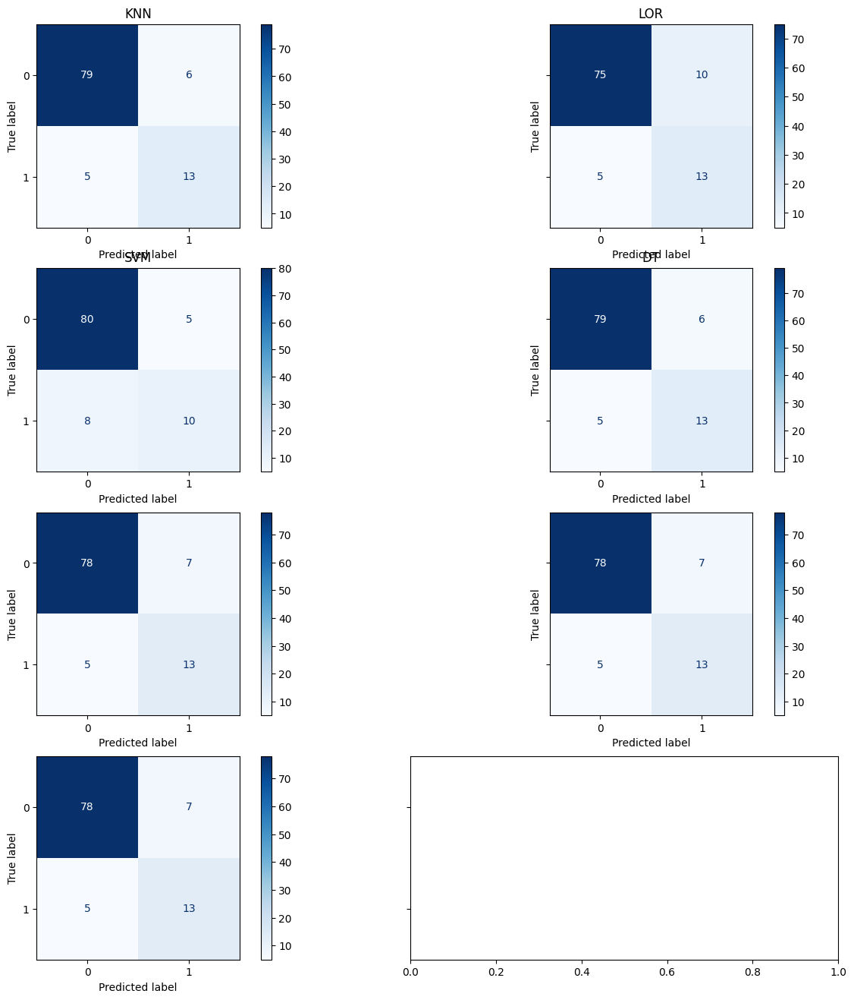

In [20]:
fig, axes = plt.subplots(4, 2, figsize=(16, 16), sharey=True)
#fig.suptitle('Confusion Matrix')

cm_knc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, knc_pred))
cm_lor = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, lor_pred))
cm_svc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, svc_pred))
cm_dtc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, dtc_pred))
cm_rfc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, rfc_pred))
cm_ada = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, ada_pred))
cm_xgb = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, xgb_pred))


axes[0, 0].set_title('KNN')
cm_knc.plot(cmap='Blues', ax=axes[0, 0])

axes[0, 1].set_title('LOR')
cm_lor.plot(cmap='Blues', ax=axes[1, 0])

axes[1, 0].set_title('SVM')
cm_svc.plot(cmap='Blues', ax=axes[0, 1])

axes[1, 1].set_title('DT')
cm_dtc.plot(cmap='Blues', ax=axes[1, 1])

#axes[2, 0].set_title('RF')
cm_rfc.plot(cmap='Blues', ax=axes[2, 0])

#axes[2, 1].set_title('Ada')
cm_ada.plot(cmap='Blues', ax=axes[2, 1])

#axes[3, 0].set_title('XGB')
cm_xgb.plot(cmap='Blues', ax=axes[3, 0])

plt.show()

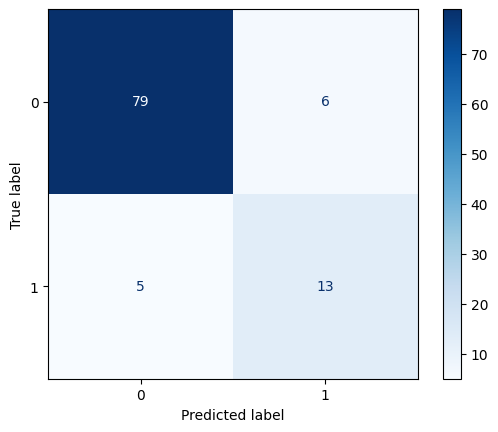

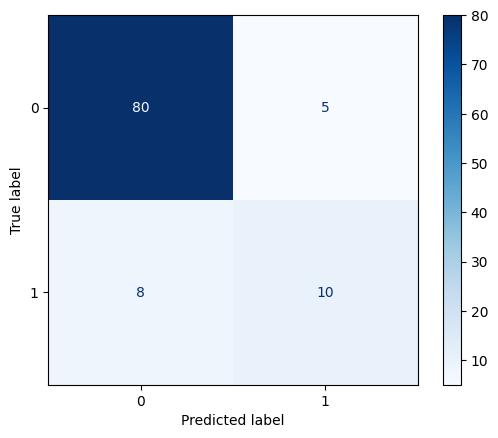

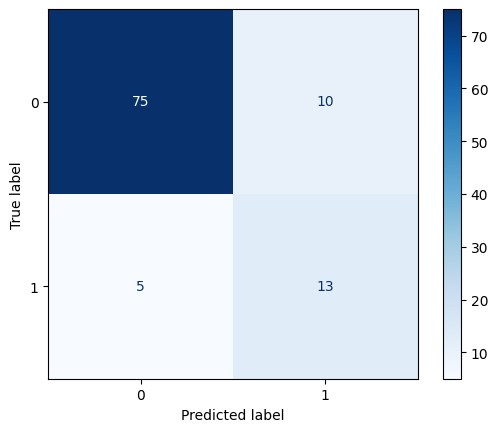

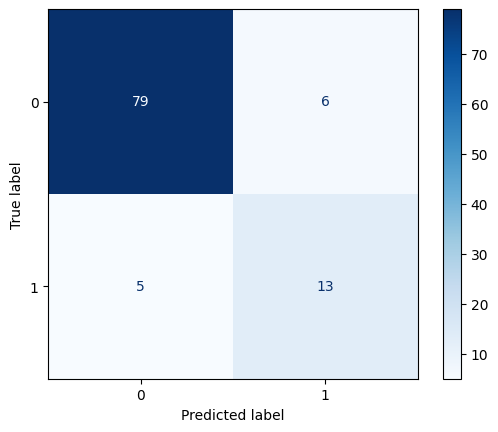

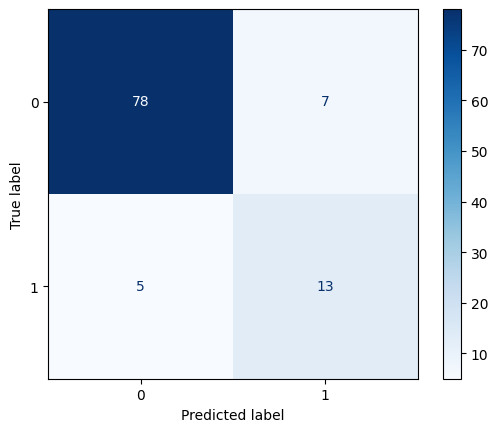

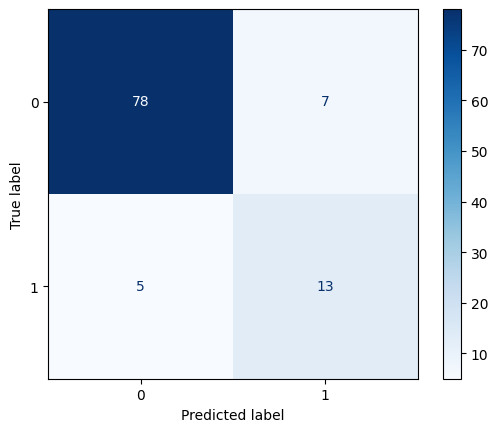

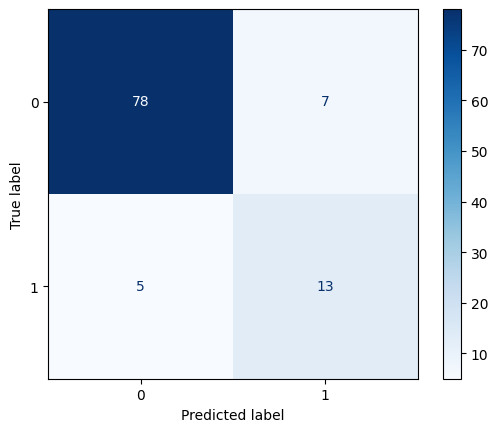

In [33]:

cm_knc.plot(cmap='Blues')
cm_lor.plot(cmap='Blues')
cm_svc.plot(cmap='Blues')
cm_dtc.plot(cmap='Blues')
cm_rfc.plot(cmap='Blues')
cm_ada.plot(cmap='Blues')
cm_xgb.plot(cmap='Blues')

In [ ]:
print('KNN', classification_report(y_test, knc_pred))
print('LOR', classification_report(y_test, lor_pred))
print('SVM', classification_report(y_test, svc_pred))
print('DT', classification_report(y_test, dtc_pred))
print('RF', classification_report(y_test, rfc_pred))
print('Ada', classification_report(y_test, ada_pred))
print('XGB', classification_report(y_test, xgb_pred))


KNN               precision    recall  f1-score   support

           0       0.94      0.93      0.93        85
           1       0.68      0.72      0.70        18

    accuracy                           0.89       103
   macro avg       0.81      0.83      0.82       103
weighted avg       0.90      0.89      0.89       103

LOR               precision    recall  f1-score   support

           0       0.91      0.94      0.92        85
           1       0.67      0.56      0.61        18

    accuracy                           0.87       103
   macro avg       0.79      0.75      0.77       103
weighted avg       0.87      0.87      0.87       103

SVM               precision    recall  f1-score   support

           0       0.94      0.88      0.91        85
           1       0.57      0.72      0.63        18

    accuracy                           0.85       103
   macro avg       0.75      0.80      0.77       103
weighted avg       0.87      0.85      0.86       103

DT     

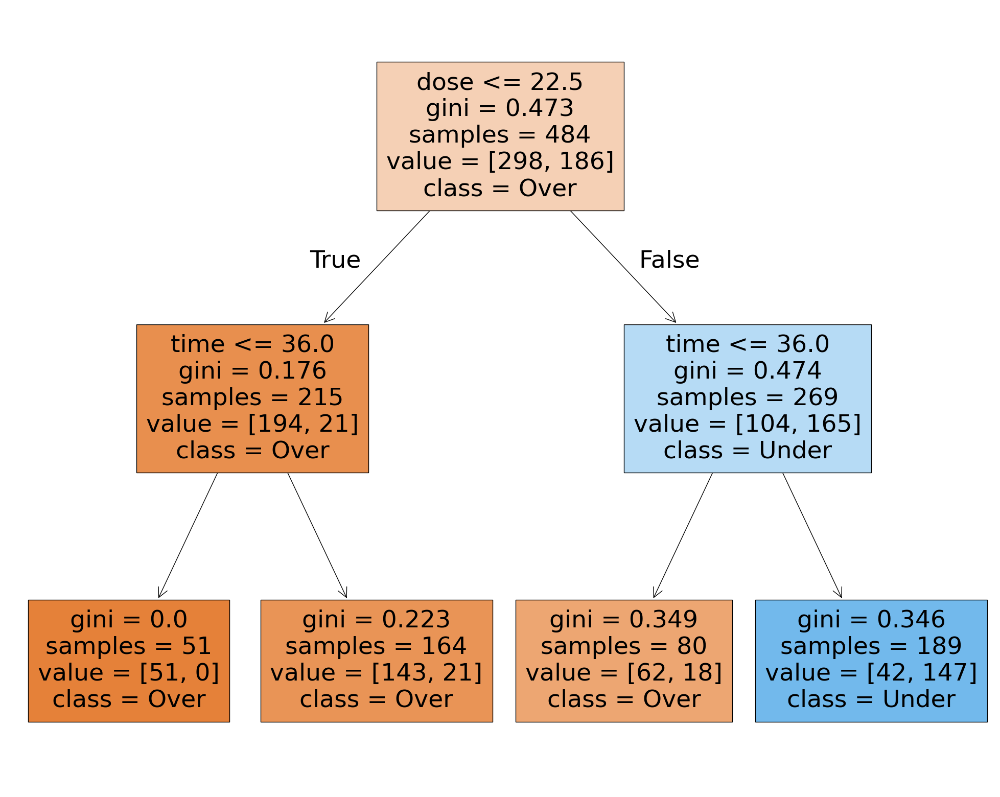

In [52]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=2, min_samples_leaf=1, min_samples_split=2, random_state=20, splitter='best')
dtc.fit(X_simple, y01)
#dtc_pred = dtc.predict(X)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, feature_names=['time', 'dose'], class_names=['Over', 'Under'], filled=True)

In [53]:
dtc_pred = dtc.predict(X_test)
accuracy_score(y_test, dtc_pred)

0.8737864077669902

In [56]:
print(classification_report(y_test, dtc_pred))

              precision    recall  f1-score   support

           0       0.94      0.91      0.92        85
           1       0.62      0.72      0.67        18

    accuracy                           0.87       103
   macro avg       0.78      0.81      0.79       103
weighted avg       0.88      0.87      0.88       103



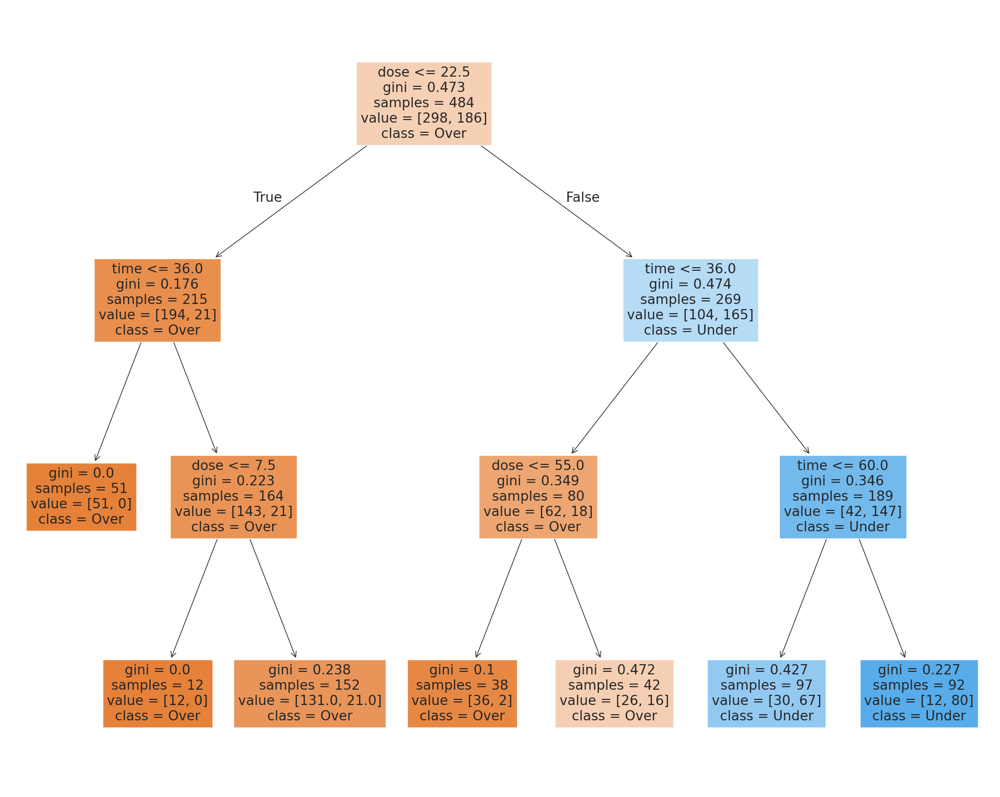

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, min_samples_leaf=1, min_samples_split=2, random_state=20, splitter='best')
dtc.fit(X_simple, y01)
#dtc_pred = dtc.predict(X)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, feature_names=['time', 'dose'], class_names=['Over', 'Under'], filled=True)

# Flavone

## DataFrames


In [ ]:
df = pd.read_excel("/content/FlavoneData.xlsx")
df

,authors,flavone,cell line,time,dose,viability-mean,viability-error,viability-SD,viability-SE
0,Wang and Renquan 2023,Acacetin,TE 1,24,20.0,90.247253,97.664835,7.417582,NaN
1,Wang and Renquan 2023,Acacetin,TE 1,24,40.0,81.593407,88.186813,6.593407,NaN
2,Wang and Renquan 2023,Acacetin,TE 1,24,60.0,42.857143,46.565934,3.708791,NaN
3,Wang and Renquan 2023,Acacetin,TE 1,48,20.0,76.648352,84.065934,7.417582,NaN
4,Wang and Renquan 2023,Acacetin,TE 1,48,40.0,63.049451,68.818681,5.769231,NaN
...,...,...,...,...,...,...,...,...,...
466,Liu et al. 2017,Luteolin,EC 109,24,100.0,55.459459,59.351351,3.891892,NaN
467,Liu et al. 2017,Luteolin,KYSE 150,24,10.0,96.000000,99.567568,3.567568,NaN
468,Liu et al. 2017,Luteolin,KYSE 150,24,20.0,86.270270,90.162162,3.891892,NaN
469,Liu et al. 2017,Luteolin,KYSE 150,24,50.0,77.837838,81.729730,3.891892,NaN


In [ ]:
df['dose-out'] = df['dose']
df['dose-out'][df['dose-out']==160] = 130
df['dose-out'][df['dose-out']==200] = 140
df['dose-out'][df['dose-out']==240] = 150
df['dose-out'][df['dose-out']==300] = 160

/tmp/ipython-input-11-2484162581.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['dose-out'][df['dose-out']==160] = 130
/tmp/ipython-input-11-2484162581.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

In [ ]:
df['v01'] = 1
df['v01'][df['viability-mean']>50] = 0

/tmp/ipython-input-12-2524503693.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['v01'][df['viability-mean']>50] = 0
/tmp/ipython-input-12-2524503693.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

In [ ]:
#df[['authors', 'viability-mean', 'viability-SD', 'v01']].groupby(['authors']).sum()

In [ ]:
df = df.drop(['authors', 'viability-error', 'viability-SD', 'viability-SE'], axis=1)
df

,flavone,cell line,time,dose,viability-mean,dose-out,v01
0,Acacetin,TE 1,24,20.0,90.247253,20.0,0
1,Acacetin,TE 1,24,40.0,81.593407,40.0,0
2,Acacetin,TE 1,24,60.0,42.857143,60.0,1
3,Acacetin,TE 1,48,20.0,76.648352,20.0,0
4,Acacetin,TE 1,48,40.0,63.049451,40.0,0
...,...,...,...,...,...,...,...
466,Luteolin,EC 109,24,100.0,55.459459,100.0,0
467,Luteolin,KYSE 150,24,10.0,96.000000,10.0,0
468,Luteolin,KYSE 150,24,20.0,86.270270,20.0,0
469,Luteolin,KYSE 150,24,50.0,77.837838,50.0,0


In [ ]:
df['viability-mean'][df['viability-mean']>100]

,viability-mean
78,106.176471
124,107.482014
125,100.575540
445,100.404040
459,101.408451


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time,471.0,48.713376,19.913873,24.000000,24.000000,48.000000,72.000000,96.000000
dose,471.0,44.152335,45.081349,0.300000,10.000000,30.000000,60.000000,300.000000
viability-mean,471.0,59.653128,25.345455,0.930233,42.302158,63.823529,79.131038,107.482014
dose-out,471.0,41.519639,35.914421,0.300000,10.000000,30.000000,60.000000,160.000000
v01,471.0,0.337580,0.473387,0.000000,0.000000,0.000000,1.000000,1.000000


In [ ]:
df_2 = df.copy()

In [ ]:
le_f = LabelEncoder() #1
le_c = LabelEncoder() #1

df_2['flavone'] = le_f.fit_transform(df_2['flavone']) #2,3
df_2['cell line'] = le_c.fit_transform(df_2['cell line']) #2,3


In [ ]:
#df['flavone'] = le_f.inverse_transform(df['flavone'])
#df['cell line'] = le_c.inverse_transform(df['cell line'])

In [ ]:
df_2

,flavone,cell line,time,dose,viability-mean,dose-out,v01
0,0,10,24,20.0,90.247253,20.0,0
1,0,10,24,40.0,81.593407,40.0,0
2,0,10,24,60.0,42.857143,60.0,1
3,0,10,48,20.0,76.648352,20.0,0
4,0,10,48,40.0,63.049451,40.0,0
...,...,...,...,...,...,...,...
466,6,1,24,100.0,55.459459,100.0,0
467,6,4,24,10.0,96.000000,10.0,0
468,6,4,24,20.0,86.270270,20.0,0
469,6,4,24,50.0,77.837838,50.0,0


In [ ]:
sc=MinMaxScaler()

df_2_scaled = pd.DataFrame(sc.fit_transform(df_2), columns=df_2.columns)
df_2_scaled

,flavone,cell line,time,dose,viability-mean,dose-out,v01
0,0.000000,0.769231,0.000000,0.065732,0.838250,0.123356,0.0
1,0.000000,0.769231,0.000000,0.132466,0.757033,0.248591,0.0
2,0.000000,0.769231,0.000000,0.199199,0.393489,0.373826,1.0
3,0.000000,0.769231,0.333333,0.065732,0.710623,0.123356,0.0
4,0.000000,0.769231,0.333333,0.132466,0.582996,0.248591,0.0
...,...,...,...,...,...,...,...
466,0.857143,0.076923,0.000000,0.332666,0.511763,0.624296,0.0
467,0.857143,0.307692,0.000000,0.032366,0.892240,0.060739,0.0
468,0.857143,0.307692,0.000000,0.065732,0.800925,0.123356,0.0
469,0.857143,0.307692,0.000000,0.165832,0.721786,0.311209,0.0


In [ ]:
df_encoded = pd.get_dummies(df, dtype=int)

In [ ]:
df_encoded

,time,dose,viability-mean,dose-out,v01,flavone_Acacetin,flavone_Apigenin,flavone_Baicalein,flavone_Chrysin,flavone_Cirsiliol,...,cell line_KYSE 150,cell line_KYSE 30,cell line_KYSE 410,cell line_KYSE 450,cell line_KYSE 510,cell line_OE 33,cell line_TE 1,cell line_TE 10,cell line_TE 13,cell line_YES 2
0,24,20.0,90.247253,20.0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,24,40.0,81.593407,40.0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,24,60.0,42.857143,60.0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,48,20.0,76.648352,20.0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,48,40.0,63.049451,40.0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,24,100.0,55.459459,100.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
467,24,10.0,96.000000,10.0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
468,24,20.0,86.270270,20.0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
469,24,50.0,77.837838,50.0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
df_encoded_scaled = pd.DataFrame(sc.fit_transform(df_encoded), columns=df_encoded.columns)
df_encoded_scaled

,time,dose,viability-mean,dose-out,v01,flavone_Acacetin,flavone_Apigenin,flavone_Baicalein,flavone_Chrysin,flavone_Cirsiliol,...,cell line_KYSE 150,cell line_KYSE 30,cell line_KYSE 410,cell line_KYSE 450,cell line_KYSE 510,cell line_OE 33,cell line_TE 1,cell line_TE 10,cell line_TE 13,cell line_YES 2
0,0.000000,0.065732,0.838250,0.123356,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.000000,0.132466,0.757033,0.248591,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.000000,0.199199,0.393489,0.373826,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.333333,0.065732,0.710623,0.123356,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.333333,0.132466,0.582996,0.248591,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,0.000000,0.332666,0.511763,0.624296,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
467,0.000000,0.032366,0.892240,0.060739,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
468,0.000000,0.065732,0.800925,0.123356,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
469,0.000000,0.165832,0.721786,0.311209,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Correlation


In [ ]:
df['flavone'].unique()

array(['Acacetin', 'Luteolin', 'Chrysin', 'Apigenin', 'Baicalein',
       'Cirsiliol', 'Eupatilin', 'Oroxylin A'], dtype=object)

correlation for any flavone!

<Axes: >

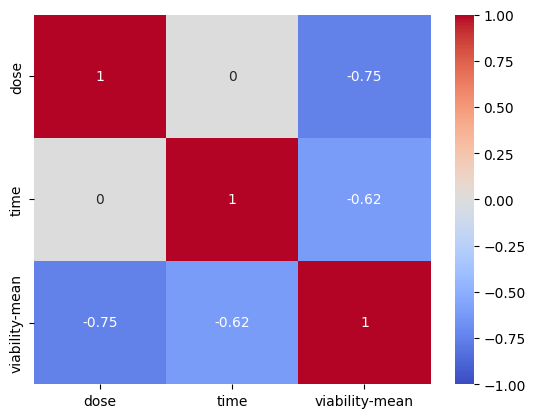

In [ ]:
matrix11 = df.loc[df['flavone']=='Acacetin', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix11, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

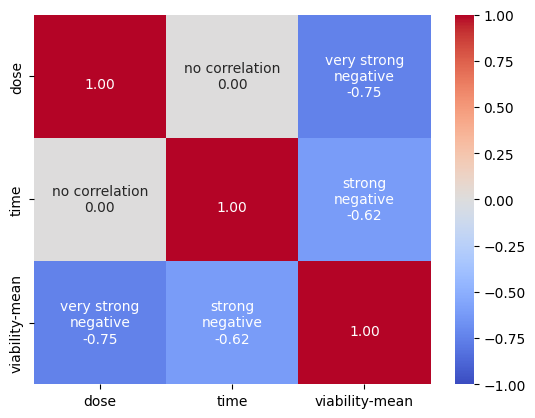

In [ ]:
matrix11 = df.loc[df['flavone']=='Acacetin', ['dose', 'time', 'viability-mean']].corr()

text11 = np.array([['', 'no correlation', 'very strong\nnegative'],
 ['no correlation', '', 'strong\nnegative'],
 ['very strong\nnegative', 'strong\nnegative', '']])

matrix11_arr = np.array(matrix11)

formatted_text11 = (np.asarray(["{0}\n{1:.2f}".format(text11, matrix11) for text11, matrix11
                                in zip(text11.flatten(), matrix11_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix11, annot=formatted_text11, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

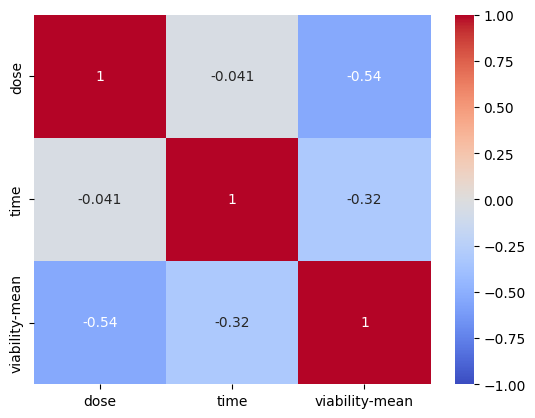

In [ ]:
# dose-out is better

matrix12 = df.loc[df['flavone']=='Apigenin', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix12, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

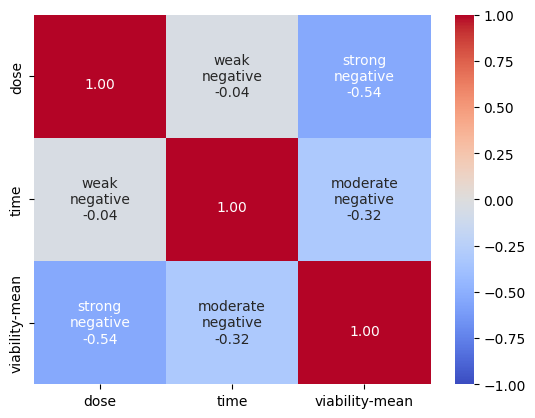

In [ ]:
matrix12 = df.loc[df['flavone']=='Apigenin', ['dose', 'time', 'viability-mean']].corr()

text12 = np.array([['', 'weak\nnegative', 'strong\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['strong\nnegative', 'moderate\nnegative', '']])

matrix12_arr = np.array(matrix12)

formatted_text12 = (np.asarray(["{0}\n{1:.2f}".format(text12, matrix12) for text12, matrix12
                                in zip(text12.flatten(), matrix12_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix12, annot=formatted_text12, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

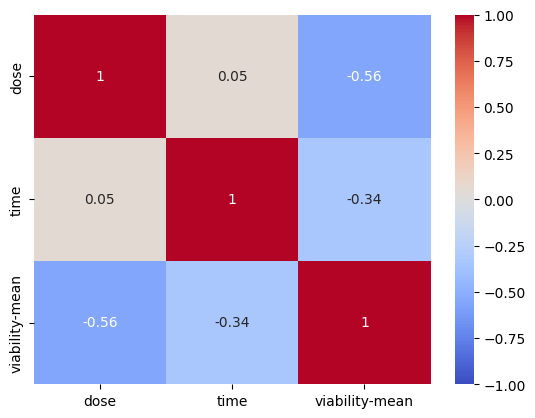

In [ ]:
matrix13 = df.loc[df['flavone']=='Baicalein', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix13, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

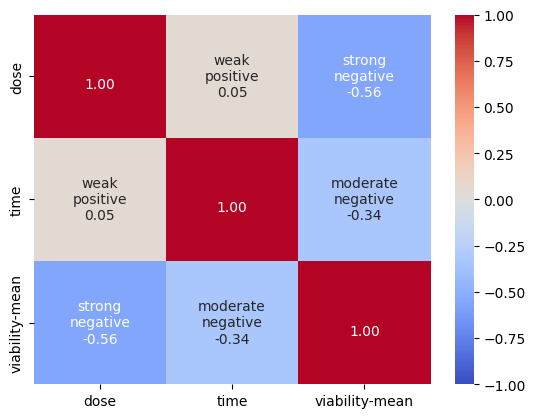

In [ ]:
matrix13 = df.loc[df['flavone']=='Baicalein', ['dose', 'time', 'viability-mean']].corr()

text13 = np.array([['', 'weak\npositive', 'strong\nnegative'],
 ['weak\npositive', '', 'moderate\nnegative'],
 ['strong\nnegative', 'moderate\nnegative', '']])

matrix13_arr = np.array(matrix13)

formatted_text13 = (np.asarray(["{0}\n{1:.2f}".format(text13, matrix13) for text13, matrix13
                                in zip(text13.flatten(), matrix13_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix13, annot=formatted_text13, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

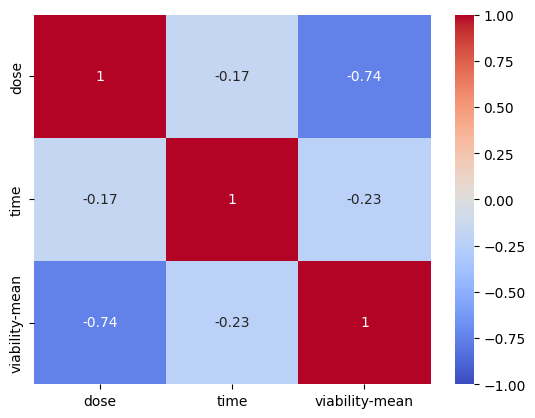

In [ ]:
matrix21 = df.loc[df['flavone']=='Chrysin', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix21, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

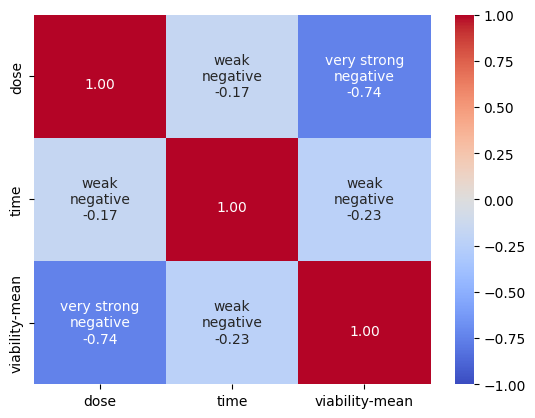

In [ ]:
matrix21 = df.loc[df['flavone']=='Chrysin', ['dose', 'time', 'viability-mean']].corr()

text21 = np.array([['', 'weak\nnegative', 'very strong\nnegative'],
 ['weak\nnegative', '', 'weak\nnegative'],
 ['very strong\nnegative', 'weak\nnegative', '']])

matrix21_arr = np.array(matrix21)

formatted_text21 = (np.asarray(["{0}\n{1:.2f}".format(text21, matrix21) for text21, matrix21
                                in zip(text21.flatten(), matrix21_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix21, annot=formatted_text21, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

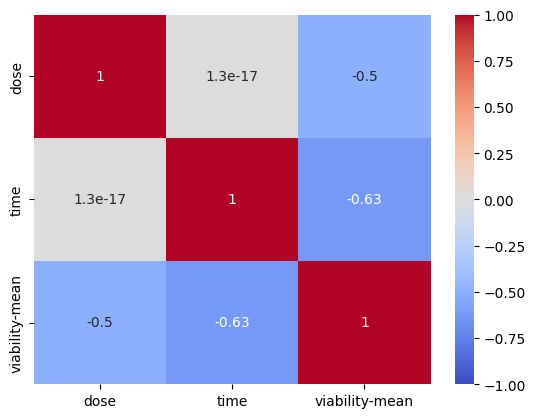

In [ ]:
matrix22 = df.loc[df['flavone']=='Cirsiliol', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix22, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

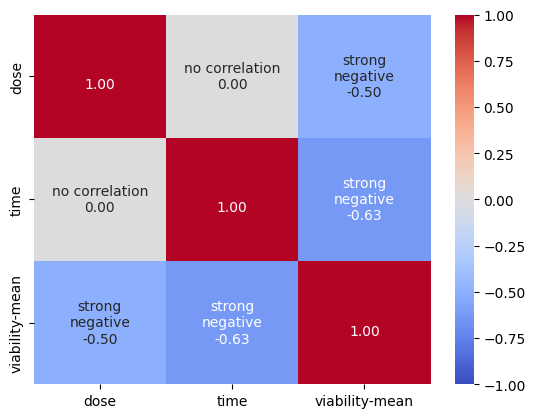

In [ ]:
matrix22 = df.loc[df['flavone']=='Cirsiliol', ['dose', 'time', 'viability-mean']].corr()

text22 = np.array([['', 'no correlation', 'strong\nnegative'],
 ['no correlation', '', 'strong\nnegative'],
 ['strong\nnegative', 'strong\nnegative', '']])

matrix22_arr = np.array(matrix22)

formatted_text22 = (np.asarray(["{0}\n{1:.2f}".format(text22, matrix22) for text22, matrix22
                                in zip(text22.flatten(), matrix22_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix22, annot=formatted_text22, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

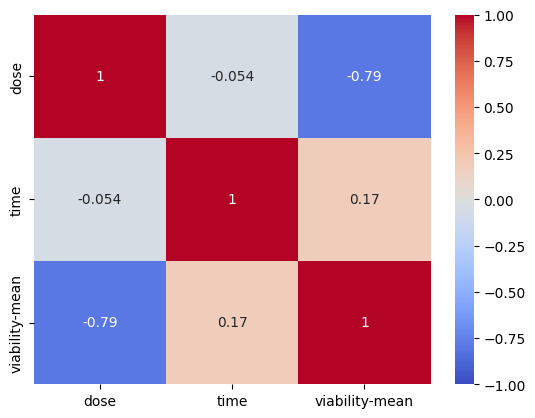

In [ ]:
matrix23 = df.loc[df['flavone']=='Eupatilin', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix23, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

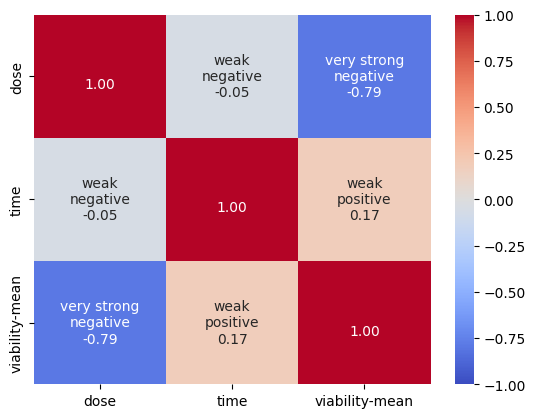

In [ ]:
matrix23 = df.loc[df['flavone']=='Eupatilin', ['dose', 'time', 'viability-mean']].corr()

text23 = np.array([['', 'weak\nnegative', 'very strong\nnegative'],
 ['weak\nnegative', '', 'weak\npositive'],
 ['very strong\nnegative', 'weak\npositive', '']])

matrix23_arr = np.array(matrix23)

formatted_text23 = (np.asarray(["{0}\n{1:.2f}".format(text23, matrix23) for text23, matrix23
                                in zip(text23.flatten(), matrix23_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix23, annot=formatted_text23, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

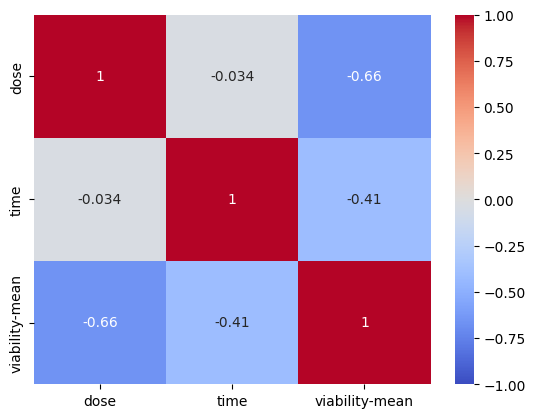

In [ ]:
# dose-out is better

matrix31 = df.loc[df['flavone']=='Luteolin', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix31, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

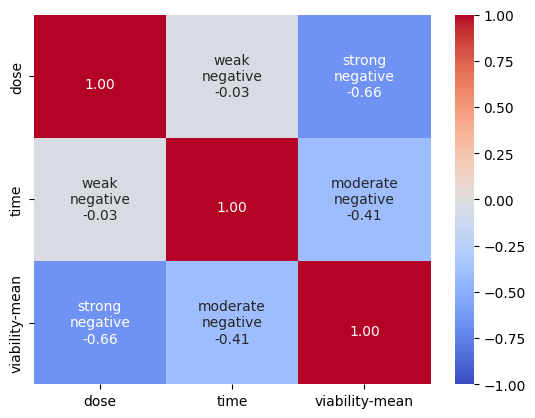

In [ ]:
matrix31 = df.loc[df['flavone']=='Luteolin', ['dose', 'time', 'viability-mean']].corr()

text31 = np.array([['', 'weak\nnegative', 'strong\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['strong\nnegative', 'moderate\nnegative', '']])

matrix31_arr = np.array(matrix31)

formatted_text31 = (np.asarray(["{0}\n{1:.2f}".format(text31, matrix31) for text31, matrix31
                                in zip(text31.flatten(), matrix31_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix31, annot=formatted_text31, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

<Axes: >

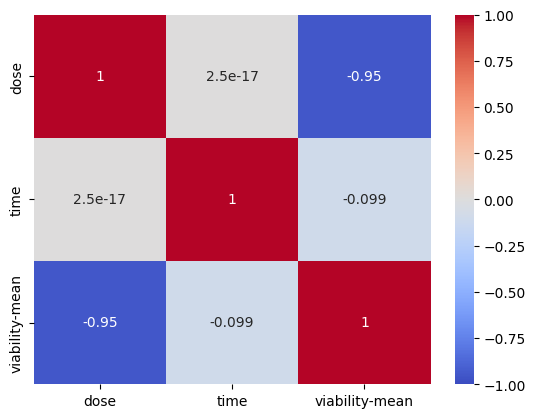

In [ ]:
matrix32 = df.loc[df['flavone']=='Oroxylin A', ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix32, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

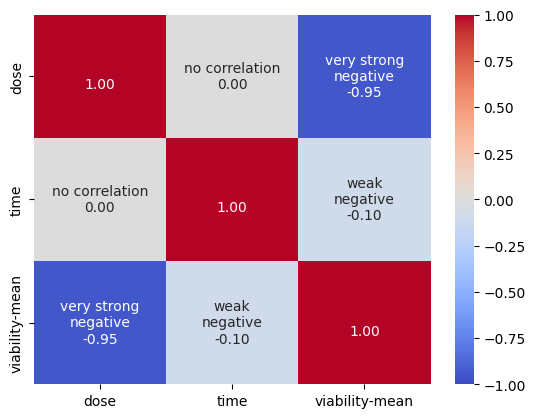

In [ ]:
matrix32 = df.loc[df['flavone']=='Oroxylin A', ['dose', 'time', 'viability-mean']].corr()

text32 = np.array([['', 'no correlation', 'very strong\nnegative'],
 ['no correlation', '', 'weak\nnegative'],
 ['very strong\nnegative', 'weak\nnegative', '']])

matrix32_arr = np.array(matrix32)

formatted_text32 = (np.asarray(["{0}\n{1:.2f}".format(text32, matrix32) for text32, matrix32
                                in zip(text32.flatten(), matrix32_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix32, annot=formatted_text32, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

In [ ]:
#Correlation

df.loc[:, ['dose', 'time', 'viability-mean']].corr()

,dose,time,viability-mean
dose,1.000000,-0.080298,-0.576411
time,-0.080298,1.000000,-0.314265
viability-mean,-0.576411,-0.314265,1.000000


In [ ]:
#Correlation

df.loc[:, ['dose-out', 'time', 'viability-mean']].corr()

,dose-out,time,viability-mean
dose-out,1.000000,-0.089594,-0.622750
time,-0.089594,1.000000,-0.314265
viability-mean,-0.622750,-0.314265,1.000000


<Axes: >

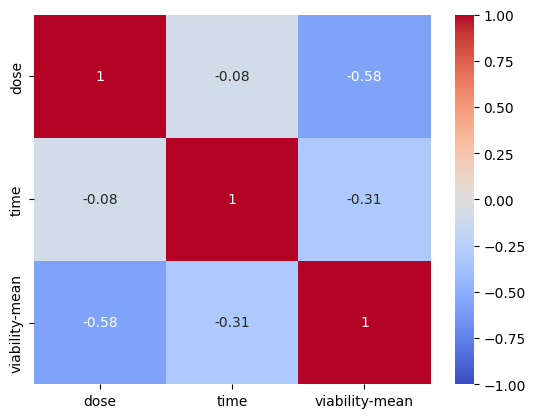

In [ ]:
matrix = df.loc[:, ['dose', 'time', 'viability-mean']].corr()
sns.heatmap(matrix, vmin=-1, vmax=1, cmap='coolwarm', annot=True)

<Axes: >

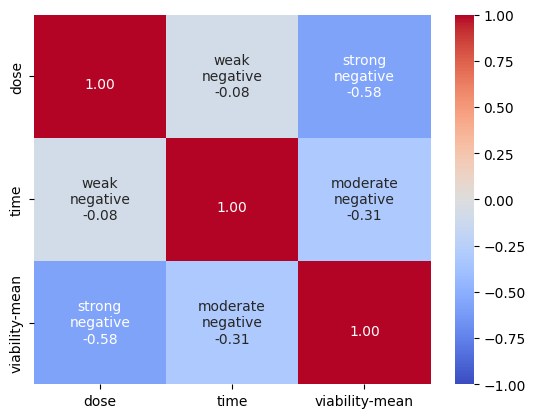

In [ ]:
matrix = df.loc[:, ['dose', 'time', 'viability-mean']].corr()

text = np.array([['', 'weak\nnegative', 'strong\nnegative'],
 ['weak\nnegative', '', 'moderate\nnegative'],
 ['strong\nnegative', 'moderate\nnegative', '']])

matrix_arr = np.array(matrix)

formatted_text = (np.asarray(["{0}\n{1:.2f}".format(text, matrix) for text, matrix
                                in zip(text.flatten(), matrix_arr.flatten())])).reshape(3, 3)

sns.heatmap(matrix, annot=formatted_text, fmt="", vmin=-1, vmax=1, cmap="coolwarm")

Text(0.5, 1.0, 'All Flavones')

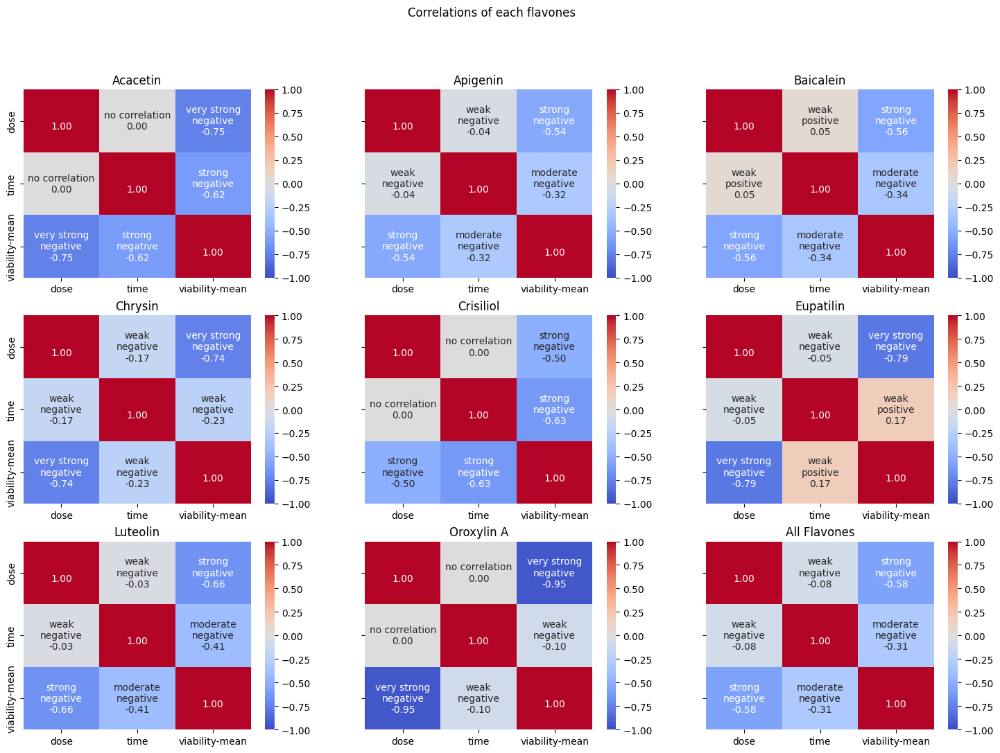

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(18, 12), sharey=True)
fig.suptitle('Correlations of each flavones')

sns.heatmap(matrix11, annot=formatted_text11, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 0])
axes[0, 0].set_title('Acacetin')

sns.heatmap(matrix12, annot=formatted_text12, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 1])
axes[0, 1].set_title('Apigenin')

sns.heatmap(matrix13, annot=formatted_text13, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 2])
axes[0, 2].set_title('Baicalein')

sns.heatmap(matrix21, annot=formatted_text21, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 0])
axes[1, 0].set_title('Chrysin')

sns.heatmap(matrix22, annot=formatted_text22, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 1])
axes[1, 1].set_title('Crisiliol')

sns.heatmap(matrix23, annot=formatted_text23, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 2])
axes[1, 2].set_title('Eupatilin')

sns.heatmap(matrix31, annot=formatted_text31, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 0])
axes[2, 0].set_title('Luteolin')

sns.heatmap(matrix32, annot=formatted_text32, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 1])
axes[2, 1].set_title('Oroxylin A')

sns.heatmap(matrix, annot=formatted_text, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 2])
axes[2, 2].set_title('All Flavones')


Text(0.5, 1.0, 'All Flavones')

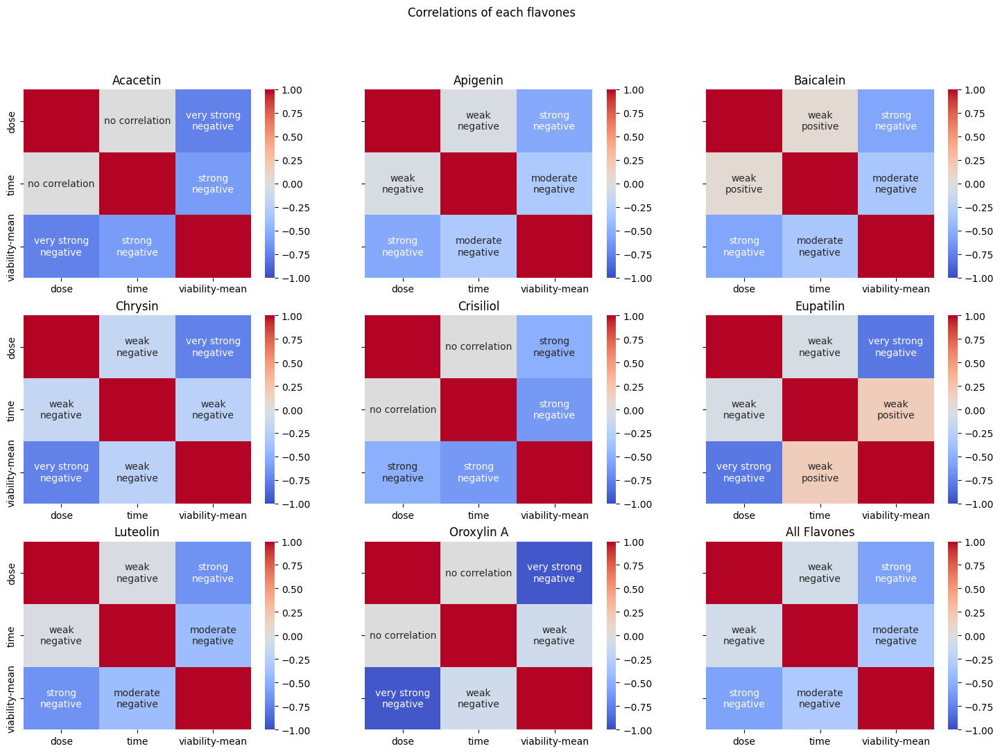

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(18, 12), sharey=True)
fig.suptitle('Correlations of each flavones')

sns.heatmap(matrix11, annot=text11, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 0])
axes[0, 0].set_title('Acacetin')

sns.heatmap(matrix12, annot=text12, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 1])
axes[0, 1].set_title('Apigenin')

sns.heatmap(matrix13, annot=text13, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[0, 2])
axes[0, 2].set_title('Baicalein')

sns.heatmap(matrix21, annot=text21, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 0])
axes[1, 0].set_title('Chrysin')

sns.heatmap(matrix22, annot=text22, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 1])
axes[1, 1].set_title('Crisiliol')

sns.heatmap(matrix23, annot=text23, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[1, 2])
axes[1, 2].set_title('Eupatilin')

sns.heatmap(matrix31, annot=text31, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 0])
axes[2, 0].set_title('Luteolin')

sns.heatmap(matrix32, annot=text32, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 1])
axes[2, 1].set_title('Oroxylin A')

sns.heatmap(matrix, annot=text, fmt="", vmin=-1, vmax=1, cmap="coolwarm", ax=axes[2, 2])
axes[2, 2].set_title('All Flavones')


In [ ]:
df_2.corr()

,flavone,cell line,time,dose,viability-mean
flavone,1.000000,-0.233911,-0.003697,0.166642,-0.156169
cell line,-0.233911,1.000000,0.037429,-0.199613,0.199859
time,-0.003697,0.037429,1.000000,-0.080298,-0.314265
dose,0.166642,-0.199613,-0.080298,1.000000,-0.576411
viability-mean,-0.156169,0.199859,-0.314265,-0.576411,1.000000


In [ ]:
df_encoded.corr()

,time,dose,viability-mean,flavone_Acacetin,flavone_Apigenin,flavone_Baicalein,flavone_Chrysin,flavone_Cirsiliol,flavone_Eupatilin,flavone_Luteolin,...,cell line_KYSE 150,cell line_KYSE 30,cell line_KYSE 410,cell line_KYSE 450,cell line_KYSE 510,cell line_OE 33,cell line_TE 1,cell line_TE 10,cell line_TE 13,cell line_YES 2
time,1.000000,-0.080298,-0.314265,-0.007148,-0.082582,-0.029512,0.140093,-0.007148,0.043092,0.018113,...,-0.087313,0.106777,0.121256,0.101313,-0.020968,-0.017429,0.023534,-0.005005,-0.103336,0.121256
dose,-0.080298,1.000000,-0.576411,-0.018380,0.020373,-0.082402,-0.131482,-0.143795,-0.158465,0.212833,...,-0.041889,-0.011164,-0.059694,-0.106205,-0.086373,-0.050210,-0.049563,-0.012869,0.116741,-0.059694
viability-mean,-0.314265,-0.576411,1.000000,-0.024013,0.149897,0.035193,-0.003815,0.019215,0.277494,-0.364520,...,0.093786,-0.027863,0.023320,-0.040539,-0.125088,0.135957,0.139848,-0.014236,0.112209,0.029963
flavone_Acacetin,-0.007148,-0.018380,-0.024013,1.000000,-0.096883,-0.058203,-0.101517,-0.039735,-0.051991,-0.140952,...,-0.039735,-0.041977,-0.020648,-0.044124,-0.116553,-0.096883,0.214475,0.700186,-0.032231,-0.020648
flavone_Apigenin,-0.082582,0.020373,0.149897,-0.096883,1.000000,-0.141911,-0.247519,-0.096883,-0.126765,-0.343672,...,0.043956,0.085121,-0.050344,-0.107584,0.013262,0.340682,-0.190985,-0.067836,-0.078586,-0.050344
flavone_Baicalein,-0.029512,-0.082402,0.035193,-0.058203,-0.141911,1.000000,-0.148698,-0.058203,-0.076155,-0.206462,...,0.106443,-0.061487,-0.030245,-0.064631,0.263929,-0.141911,-0.114735,-0.040753,-0.047211,-0.030245
flavone_Chrysin,0.140093,-0.131482,-0.003815,-0.101517,-0.247519,-0.148698,1.000000,-0.101517,-0.132829,-0.360110,...,0.035409,0.022942,0.203396,0.011674,0.280583,0.072980,-0.200120,-0.071080,-0.082344,0.203396
flavone_Cirsiliol,-0.007148,-0.143795,0.019215,-0.039735,-0.096883,-0.058203,-0.101517,1.000000,-0.051991,-0.140952,...,-0.039735,-0.041977,-0.020648,0.428204,-0.116553,-0.096883,-0.078330,-0.027822,-0.032231,-0.020648
flavone_Eupatilin,0.043092,-0.158465,0.277494,-0.051991,-0.126765,-0.076155,-0.132829,-0.051991,1.000000,-0.184428,...,-0.051991,-0.054925,-0.027017,-0.057734,-0.152503,-0.126765,0.663745,-0.036403,-0.042172,-0.027017
flavone_Luteolin,0.018113,0.212833,-0.364520,-0.140952,-0.343672,-0.206462,-0.360110,-0.140952,-0.184428,1.000000,...,-0.046984,0.029781,-0.073245,0.014229,-0.165380,-0.068734,0.039694,-0.098693,-0.114332,-0.073245


## EFS

In [ ]:
#df_2
X = df_2[['flavone', 'cell line', 'time', 'dose', 'dose-out']]
y = df_2['viability-mean']

#df_2_scaled
X_scaled = df_2_scaled[['flavone', 'cell line', 'time', 'dose', 'dose-out']]
y_scaled = df_2_scaled['viability-mean']

#df_encoded
X_encoded = df_encoded.drop(['viability-mean', 'v01'], axis=1)
y_encoded = df_encoded['viability-mean']

#df_encoded_scaled
X_encoded_scaled = df_encoded_scaled.drop(['viability-mean', 'v01'], axis=1)
y_encoded_scaled = df_encoded_scaled['viability-mean']


In [ ]:
knr = KNeighborsRegressor()
svr = SVR()
lir = LinearRegression()
rig = Ridge()
las = Lasso()
dtr = DecisionTreeRegressor()
rfr = RandomForestRegressor()

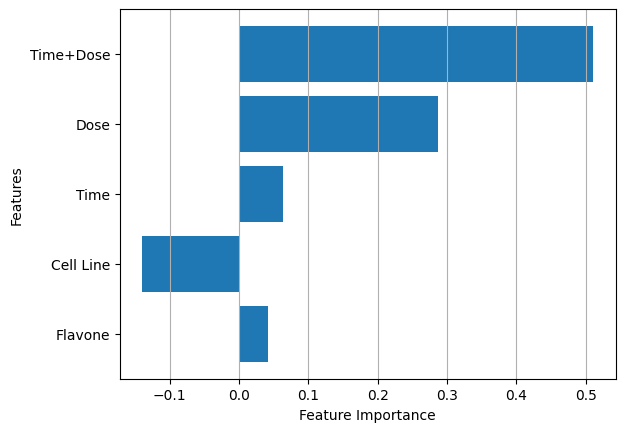

In [ ]:
y_for_bar=['Flavone', 'Cell Line', 'Time', 'Dose', 'Time+Dose']

# getting values against each value of y
x_for_bar=[0.04154853978748563, -0.1394451203933756, 0.06383556586222765, 0.2873895464922075, 0.5109092885255413]
plt.barh(y_for_bar, x_for_bar)

# setting label of y-axis
plt.ylabel("Features")

# setting label of x-axis
plt.xlabel("Feature Importance")
#plt.title("Horizontal bar graph")
plt.grid(axis='x')
plt.show()

In [ ]:
efs = EFS(dtr, min_features=1, max_features=2, scoring='r2', print_progress=True, cv=5)
efs = efs.fit(X, y)

print('Best accuracy score: ', efs.best_score_)
print('Best subset (indices):', efs.best_idx_)
print('Best subset (corresponding names):', efs.best_feature_names_)
efs.subsets_

Features: 15/15

Best accuracy score:  0.5109092885255413
Best subset (indices): (2, 3)
Best subset (corresponding names): ('time', 'dose')


{0: {'feature_idx': (0,),
  'cv_scores': array([ 0.04237827,  0.15334279, -0.08804498,  0.31200937, -0.21194276]),
  'avg_score': 0.04154853978748563,
  'feature_names': ('flavone',)},
 1: {'feature_idx': (1,),
  'cv_scores': array([-0.06688188,  0.07590639, -0.40684499, -0.01487666, -0.28452847]),
  'avg_score': -0.1394451203933756,
  'feature_names': ('cell line',)},
 2: {'feature_idx': (2,),
  'cv_scores': array([ 0.13859511,  0.18399908, -0.16079431, -0.03162827,  0.18900622]),
  'avg_score': 0.06383556586222765,
  'feature_names': ('time',)},
 3: {'feature_idx': (3,),
  'cv_scores': array([0.27877466, 0.23780708, 0.11988833, 0.50279356, 0.29768411]),
  'avg_score': 0.2873895464922075,
  'feature_names': ('dose',)},
 4: {'feature_idx': (4,),
  'cv_scores': array([0.27877466, 0.23780708, 0.11988833, 0.50279356, 0.29768411]),
  'avg_score': 0.2873895464922075,
  'feature_names': ('dose-out',)},
 5: {'feature_idx': (0, 1),
  'cv_scores': array([ 0.11450673,  0.33485119, -0.31803454,  

In [ ]:
efs = EFS(dtr, min_features=1, max_features=2, scoring='r2', print_progress=True, cv=5)
efs = efs.fit(X_scaled, y_scaled)

print('Best accuracy score: ', efs.best_score_)
print('Best subset (indices):', efs.best_idx_)
print('Best subset (corresponding names):', efs.best_feature_names_)
efs.subsets_

Features: 15/15

Best accuracy score:  0.5110620886452648
Best subset (indices): (2, 3)
Best subset (corresponding names): ('time', 'dose')


{0: {'feature_idx': (0,),
  'cv_scores': array([ 0.04237827,  0.15334279, -0.31036208,  0.31200937, -0.21194276]),
  'avg_score': -0.0029148813625034407,
  'feature_names': ('flavone',)},
 1: {'feature_idx': (1,),
  'cv_scores': array([-0.06688188,  0.07590639, -0.40684499, -0.01487666, -0.28452847]),
  'avg_score': -0.1394451203933757,
  'feature_names': ('cell line',)},
 2: {'feature_idx': (2,),
  'cv_scores': array([ 0.13859511,  0.18399908, -0.16079431, -0.03162827,  0.18900622]),
  'avg_score': 0.06383556586222769,
  'feature_names': ('time',)},
 3: {'feature_idx': (3,),
  'cv_scores': array([0.27877466, 0.23780708, 0.11988833, 0.50279356, 0.29768411]),
  'avg_score': 0.28738954649220744,
  'feature_names': ('dose',)},
 4: {'feature_idx': (4,),
  'cv_scores': array([0.27877466, 0.23780708, 0.11988833, 0.50279356, 0.29768411]),
  'avg_score': 0.28738954649220744,
  'feature_names': ('dose-out',)},
 5: {'feature_idx': (0, 1),
  'cv_scores': array([ 0.09403917,  0.33485119, -0.326304

## Data Visualization

<Axes: >

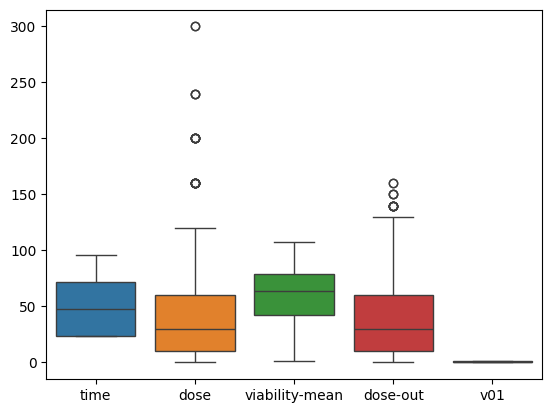

In [ ]:
sns.boxplot(df)

In [ ]:
flavo_count = df['flavone'].value_counts()
cell_line_count = df['cell line'].value_counts()


In [ ]:
flavone_labels = ["Luteolin", "Chrysin", "Apigenin", "Baicalein", "Eupatilin", "Oroxylin A", "Acacetin", "Cirsiliol"]
cell_line_labels = ["KYSE 510", "OE 33", "EC 109", "TE 1", "KYSE 450", "KYSE 30", "KYSE 150", "EC 9706", 'TE 13', 'TE 10', "KYSE 140", "EC 1", "KYSE 410", "YES 2"]


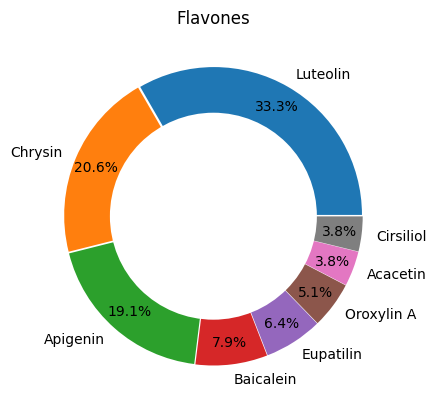

In [ ]:
# explosion
explode = (0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01)

# Pie Chart
plt.pie(flavo_count, labels=flavone_labels, autopct='%1.1f%%', pctdistance=0.85, explode=explode)

# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()

# Adding Circle in Pie chart (donut churt)
fig.gca().add_artist(centre_circle)

# Adding Title of chart
plt.title('Flavones')

# Displaying Chart
plt.show()


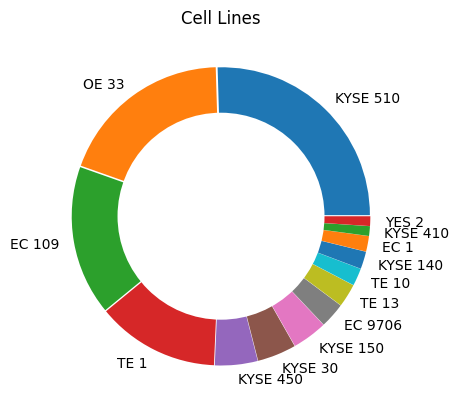

In [ ]:
# explosion
explode = ((0.01, 0.01)*7)

# Pie Chart
plt.pie(cell_line_count, labels=cell_line_labels, pctdistance=0.85, explode=explode) #autopct='%1.1f%%'

# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()

# Adding Circle in Pie chart (donut churt)
fig.gca().add_artist(centre_circle)

# Adding Title of chart
plt.title('Cell Lines')

# Displaying Chart
plt.show()


In [ ]:
aca = df['flavone']=='Acacetin'
api = df['flavone']=='Apigenin'
bai = df['flavone']=='Baicalein'
chr = df['flavone']=='Chrysin'
cir = df['flavone']=='Cirsiliol'
eup = df['flavone']=='Eupatilin'
lut = df['flavone']=='Luteolin'
oro = df['flavone']=='Oroxylin A'

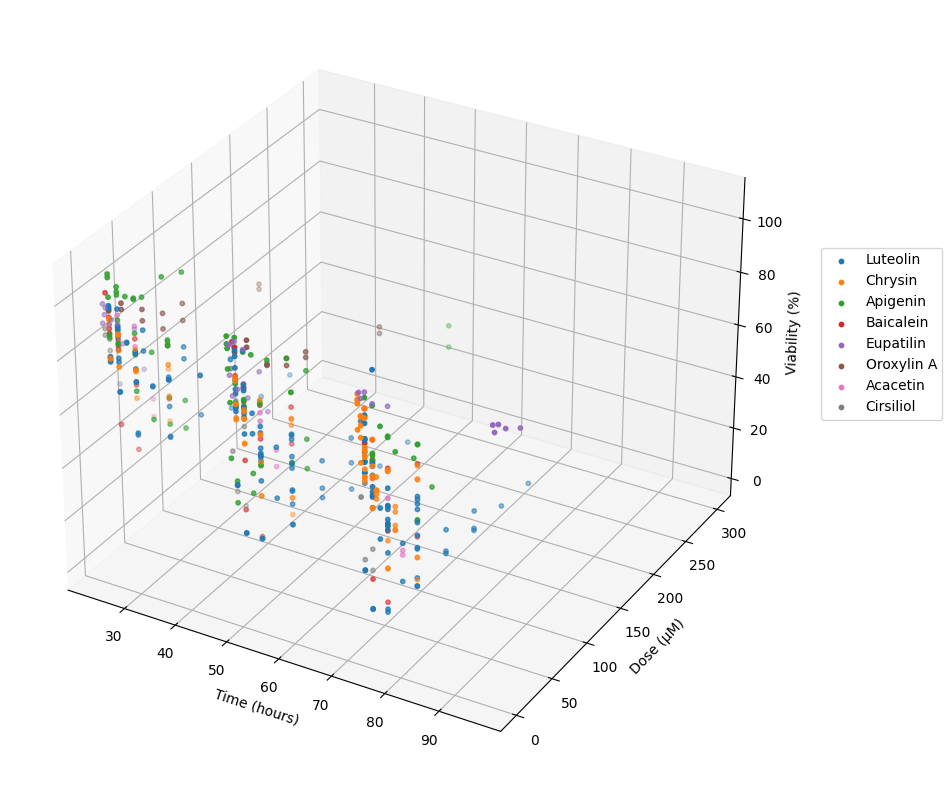

In [ ]:
# 3D Plot
fig = plt.figure(figsize=(10,10))
ax3D = fig.add_subplot(111, projection='3d')

p3d = ax3D.scatter(df['time'][lut], df['dose'][lut], df['viability-mean'][lut], s=10)#, c=df_2['flavone'])
p3d = ax3D.scatter(df['time'][chr], df['dose'][chr], df['viability-mean'][chr], s=10)
p3d = ax3D.scatter(df['time'][api], df['dose'][api], df['viability-mean'][api], s=10)
p3d = ax3D.scatter(df['time'][bai], df['dose'][bai], df['viability-mean'][bai], s=10)
p3d = ax3D.scatter(df['time'][eup], df['dose'][eup], df['viability-mean'][eup], s=10)
p3d = ax3D.scatter(df['time'][oro], df['dose'][oro], df['viability-mean'][oro], s=10)
p3d = ax3D.scatter(df['time'][aca], df['dose'][aca], df['viability-mean'][aca], s=10)
p3d = ax3D.scatter(df['time'][cir], df['dose'][cir], df['viability-mean'][cir], s=10)

ax3D.set_xlabel('Time (hours)')
ax3D.set_ylabel('Dose (μM)')
ax3D.set_zlabel('Viability (%)')

ax3D.legend(flavone_labels, bbox_to_anchor=(1.22, 0.7))

plt.show()

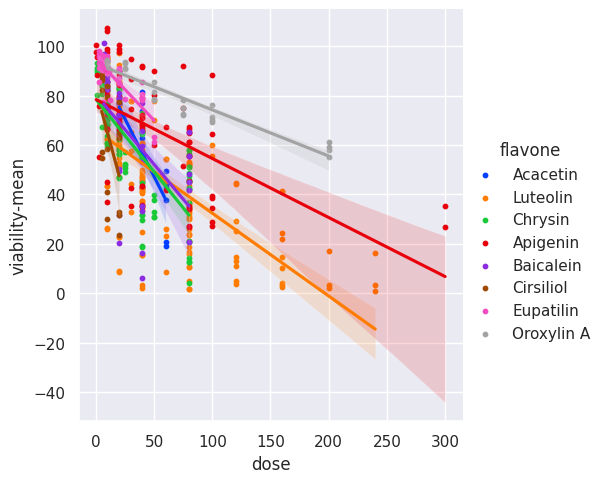

In [ ]:
sns.set(style="darkgrid") #darkgrid, whitegrid, dark, white, and ticks.
sns.lmplot(x="dose", y="viability-mean", hue="flavone", data=df, palette="bright", scatter_kws={"s": 10, "alpha": 1})


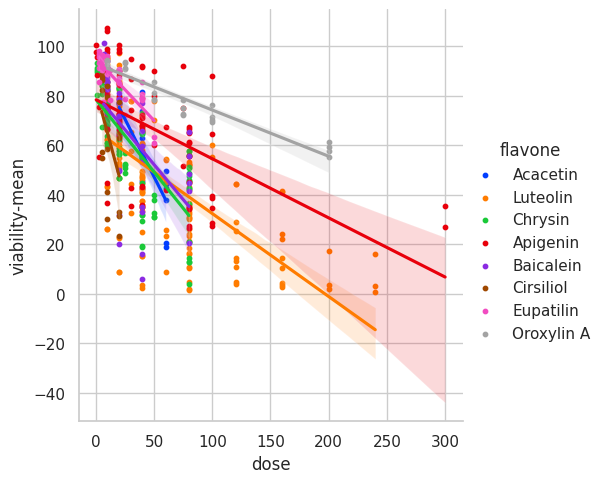

In [ ]:
sns.set(style="whitegrid") #darkgrid, whitegrid, dark, white, and ticks.
sns.lmplot(x="dose", y="viability-mean", hue="flavone", data=df, palette="bright", scatter_kws={"s": 10, "alpha": 1})


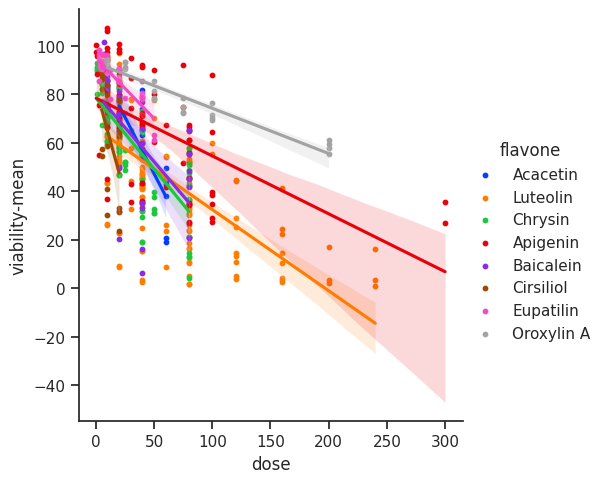

In [ ]:
sns.set(style="ticks") #darkgrid, whitegrid, dark, white, and ticks.
sns.lmplot(x="dose", y="viability-mean", hue="flavone", data=df, palette="bright", scatter_kws={"s": 10, "alpha": 1})


## K Fold


In [ ]:
#df_2
X = df_2[['time', 'dose']]
Xo = df_2[['time', 'dose-out']]

#df_2_scaled
X_scaled = df_2_scaled[['time', 'dose']]
Xo_scaled = df_2_scaled[['time', 'dose-out']]

#df_encoded
X_encoded = df_encoded.drop(['dose-out', 'viability-mean', 'v01'], axis=1)
Xo_encoded = df_encoded.drop(['dose', 'viability-mean', 'v01'], axis=1)

#df_encoded_scaled
X_encoded_scaled = df_encoded_scaled.drop(['dose-out', 'viability-mean', 'v01'], axis=1)
Xo_encoded_scaled = df_encoded_scaled.drop(['dose', 'viability-mean', 'v01'], axis=1)

list_X = [X, Xo, X_scaled, Xo_scaled, X_encoded, Xo_encoded, X_encoded_scaled, Xo_encoded_scaled]

y01 = df['v01']

In [ ]:
#initialize

knc = KNeighborsClassifier()
svc = SVC()
lor = LogisticRegression()
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()


In [ ]:
result = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
for x in list_X:
  for i in range(10):
    kf = KFold(n_splits=10, shuffle=True, random_state=i)
    result[i] = cross_val_score(knc, x, y01, cv=kf, scoring='accuracy').mean()
  print(result.mean())

0.7991312056737588
0.8020833333333334
0.8014140070921986
0.8020966312056738
0.8114406028368795
0.813125
0.7746941489361703
0.7965824468085106


In [ ]:
result = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
for x in list_X:
  for i in range(10):
    kf = KFold(n_splits=10, shuffle=True, random_state=i)
    result[i] = cross_val_score(svc, x, y01, cv=kf, scoring='accuracy').mean()
  print(result.mean())

0.8097650709219859
0.8144326241134753
0.8061347517730496
0.8101418439716312
0.8023005319148936
0.8033599290780142
0.7672872340425532
0.8356959219858157


In [ ]:
result = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
for x in list_X:
  for i in range(10):
    kf = KFold(n_splits=10, shuffle=True, random_state=i)
    result[i] = cross_val_score(lor, x, y01, cv=kf, scoring='accuracy').mean()
  print(result.mean(),'\n\n\n\n\n\n\n\n\n\n\n\n\n')

0.7914804964539008 













0.798488475177305 













0.7458111702127659 













0.7757668439716312 















/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

0.8418173758865247 















/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

0.8541533687943262 













0.8254831560283689 













0.8395035460992908 















In [ ]:
result = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
for x in list_X:
  for i in range(10):
    kf = KFold(n_splits=10, shuffle=True, random_state=i)
    result[i] = cross_val_score(dtc, x, y01, cv=kf, scoring='accuracy').mean()
  print(result.mean())

0.8188829787234043
0.8188829787234043
0.8188829787234043
0.8188829787234043
0.9040691489361702
0.902145390070922
0.9030053191489362
0.9027925531914894


In [ ]:
result = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
for x in list_X:
  for i in range(10):
    kf = KFold(n_splits=10, shuffle=True, random_state=i)
    result[i] = cross_val_score(rfc, x, y01, cv=kf, scoring='accuracy').mean()
  print(result.mean())

0.8110328014184397
0.8097562056737588
0.8097517730496454
0.8071941489361703
0.9151063829787235
0.9167863475177305
0.9157358156028369
0.9212455673758866


## Hyperparameter Tuning


In [ ]:
#df['v01'] = 1
#df['v01'][df['viability-mean']>50] = 0

In [ ]:
#df_2
X = df_2[['time', 'dose']]
Xo = df_2[['time', 'dose-out']]

#df_2_scaled
X_scaled = df_2_scaled[['time', 'dose']]
Xo_scaled = df_2_scaled[['time', 'dose-out']]

#df_encoded
X_encoded = df_encoded.drop(['dose-out', 'viability-mean', 'v01'], axis=1)
Xo_encoded = df_encoded.drop(['dose', 'viability-mean', 'v01'], axis=1)

#df_encoded_scaled
X_encoded_scaled = df_encoded_scaled.drop(['dose-out', 'viability-mean', 'v01'], axis=1)
Xo_encoded_scaled = df_encoded_scaled.drop(['dose', 'viability-mean', 'v01'], axis=1)

list_X = [X, Xo, X_scaled, Xo_scaled, X_encoded, Xo_encoded, X_encoded_scaled, Xo_encoded_scaled]

y01 = df['v01']

In [ ]:
#initialize

knc = KNeighborsClassifier()
svc = SVC()
lor = LogisticRegression()
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()


K-Nearest Neighbors (KNN)

In [ ]:
#help(knc)

In [ ]:
param_kn = {'n_neighbors': range(3, 100, 2),
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
%time gs_kn.fit(X_encoded, y01)
print(gs_kn.best_params_)
print(gs_kn.best_score_)

CPU times: user 33.4 s, sys: 202 ms, total: 33.6 s
Wall time: 18.5 s
{'metric': 'euclidean', 'n_neighbors': 77, 'weights': 'distance'}
0.874535274356103


[0.78947368 0.84477044 0.84477044 0.85966405 0.85964166 0.86817469
 0.86604703 0.86179171 0.86394177 0.86181411 0.87243001 0.87030235
 0.87030235 0.87030235 0.87243001 0.87030235 0.87030235 0.87030235
 0.87240761 0.87240761 0.87240761 0.87240761 0.87240761 0.87027996
 0.8681523  0.87027996 0.87027996 0.87027996 0.87027996 0.87027996
 0.87027996 0.87027996 0.87027996 0.87027996 0.87027996 0.87027996
 0.87027996 0.87027996 0.87027996 0.87027996 0.87027996 0.87027996
 0.87027996 0.87027996 0.8681523  0.86602464 0.8681523  0.87027996
 0.86602464]


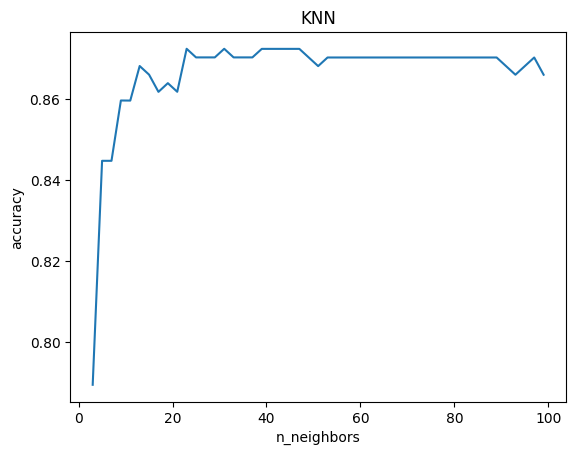

In [ ]:
param_kn = {'n_neighbors': range(3, 100, 2),
            'weights': ['distance'],
            'metric': ['manhattan']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
gs_kn.fit(X_encoded, y01)
print(gs_kn.cv_results_['mean_test_score'])

plt.plot(range(3, 100, 2), gs_kn.cv_results_['mean_test_score'])

plt.xlabel('n_neighbors')
plt.ylabel('accuracy')
plt.title('KNN')

plt.show()

CPU times: user 1.19 s, sys: 4.79 ms, total: 1.2 s
Wall time: 630 ms
{'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'distance'}
0.8724300111982084


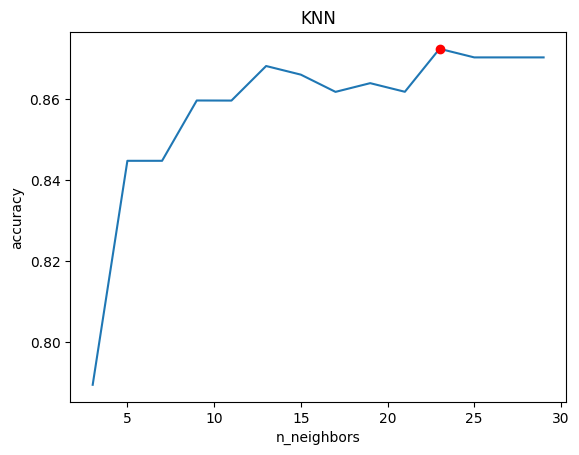

In [ ]:
param_kn = {'n_neighbors': range(3, 30, 2),
            'weights': ['distance'],
            'metric': ['manhattan']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
%time gs_kn.fit(X_encoded, y01)
print(gs_kn.best_params_)
print(gs_kn.best_score_)

plt.plot(range(3, 30, 2), gs_kn.cv_results_['mean_test_score'])

plt.plot(23, 0.8724300111982084, 'ro')

plt.xlabel('n_neighbors')
plt.ylabel('accuracy')
plt.title('KNN')

plt.show()

In [ ]:
param_kn = {'n_neighbors': [23],
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']}
gs_kn = GridSearchCV(knc, param_kn, cv=5, scoring='accuracy')
gs_kn.fit(X_encoded, y01)
print(gs_kn.cv_results_['mean_test_score'][4:6].mean())

print(gs_kn.cv_results_['params'])

0.8353863381858901
[{'metric': 'euclidean', 'n_neighbors': 23, 'weights': 'uniform'}, {'metric': 'euclidean', 'n_neighbors': 23, 'weights': 'distance'}, {'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'uniform'}, {'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'distance'}, {'metric': 'minkowski', 'n_neighbors': 23, 'weights': 'uniform'}, {'metric': 'minkowski', 'n_neighbors': 23, 'weights': 'distance'}]


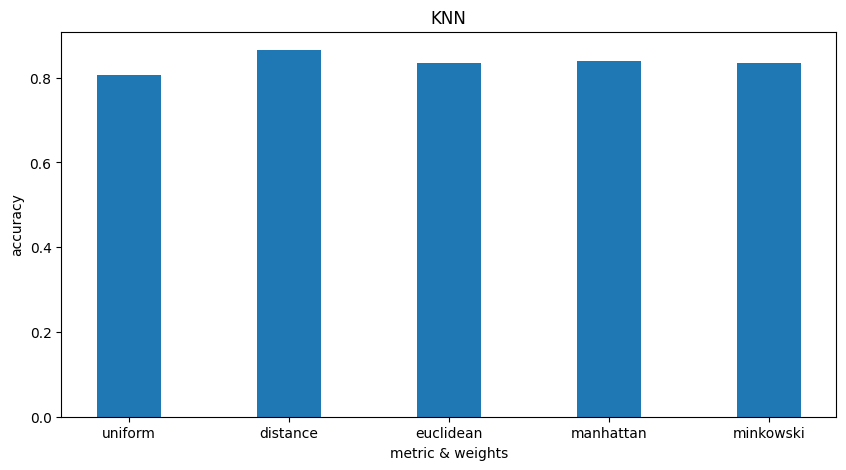

In [ ]:
knn_bar = {'uniform':0.8075401269130271 , 'distance':0.8653527435610302, 'euclidean':0.8353863381858901, 'manhattan':0.8385666293393057, 'minkowski':0.8353863381858901}
courses = list(knn_bar.keys())
values = list(knn_bar.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, width = 0.4)

plt.xlabel("metric & weights")
plt.ylabel("accuracy")
plt.title('KNN')
plt.show()

Support Vector Machine (SVM)

In [ ]:
#help(svc)

In [ ]:
param_sv_l = {'kernel': ['linear'],
            'C': [2**_ for _ in range(-15,10)]}
gs_sv_l = GridSearchCV(svc, param_sv_l, cv=5, scoring='accuracy')
%time gs_sv_l.fit(X_encoded, y01)
print(gs_sv_l.best_params_)
print(gs_sv_l.best_score_)

CPU times: user 1min 44s, sys: 113 ms, total: 1min 44s
Wall time: 1min 45s
{'C': 0.03125, 'kernel': 'linear'}
0.8047256438969764


[0.76651736 0.76868981 0.77290034 0.77290034 0.77290034 0.77290034
 0.77290034 0.775028   0.78989922 0.7962598  0.80472564 0.80049272
 0.80465845 0.80038074 0.76853303 0.76642777 0.75578947 0.75791713
 0.75153415 0.75153415 0.74940649 0.75578947 0.75368421 0.75368421
 0.75578947]


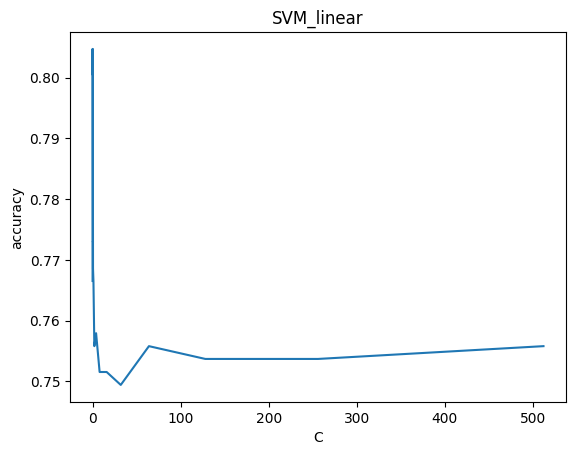

In [ ]:
print(gs_sv_l.cv_results_['mean_test_score'])

plt.plot([2**_ for _ in range(-15,10)], gs_sv_l.cv_results_['mean_test_score'])

plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_linear')
plt.xlim(2**(-15), 2**9)

plt.show()

CPU times: user 1.24 s, sys: 979 µs, total: 1.24 s
Wall time: 1.24 s
{'C': 0.03125, 'kernel': 'linear'}
0.8047256438969764


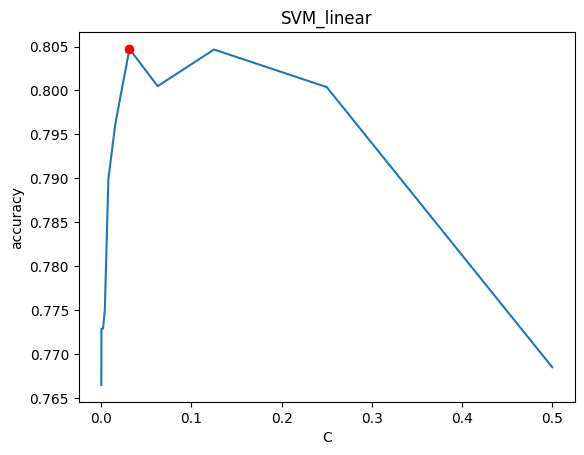

In [ ]:
param_sv_l = {'kernel': ['linear'],
            'C': [2**_ for _ in range(-15,0)]}
gs_sv_l = GridSearchCV(svc, param_sv_l, cv=5, scoring='accuracy')
%time gs_sv_l.fit(X_encoded, y01)
print(gs_sv_l.best_params_)
print(gs_sv_l.best_score_)

plt.plot([2**_ for _ in range(-15,0)], gs_sv_l.cv_results_['mean_test_score'])
plt.plot(0.03125, 0.8047256438969764, 'ro')

plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_linear')
plt.xlim(2**(-15), 2**(-1))


plt.show()

CPU times: user 749 ms, sys: 4.81 ms, total: 753 ms
Wall time: 762 ms
{'C': 0.03, 'kernel': 'linear'}
0.8047256438969764


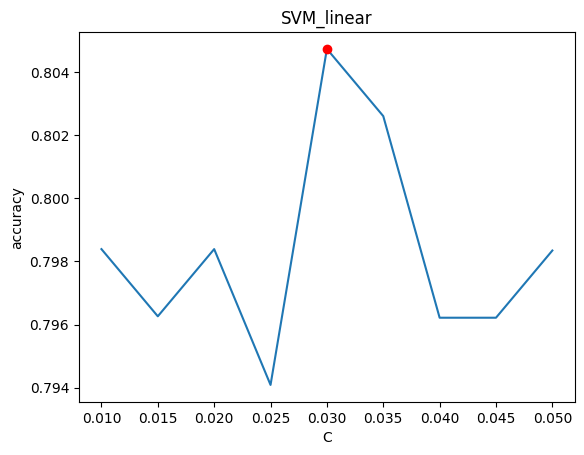

In [ ]:
param_sv_l = {'kernel': ['linear'],
            'C': (0.010, 0.015, 0.020, 0.025, 0.030, 0.035, 0.040, 0.045, 0.050)}
gs_sv_l = GridSearchCV(svc, param_sv_l, cv=5, scoring='accuracy')
%time gs_sv_l.fit(X_encoded, y01)
print(gs_sv_l.best_params_)
print(gs_sv_l.best_score_)

plt.plot((0.010, 0.015, 0.020, 0.025, 0.030, 0.035, 0.040, 0.045, 0.050), gs_sv_l.cv_results_['mean_test_score'])
plt.plot(0.03, 0.8047256438969764, 'ro')


plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_linear')
plt.xlim(0.01, 0.05)

plt.show()

In [ ]:
gamma_rbf = [2**_ for _ in range(-15,10)]
gamma_rbf.insert(0,0)

param_sv_r = {'kernel': ['rbf'],
            'C': [2**_ for _ in range(-15,10)],
            'gamma': gamma_rbf}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X_encoded, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

CPU times: user 50.1 s, sys: 101 ms, total: 50.2 s
Wall time: 52 s
{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}
0.8321612541993281


CPU times: user 2.66 s, sys: 11.8 ms, total: 2.67 s
Wall time: 2.71 s
{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}
0.8321612541993281
[0.79838746 0.7962598  0.79838746 0.79408735 0.80472564 0.80259798
 0.79621501 0.79621501 0.79834267]


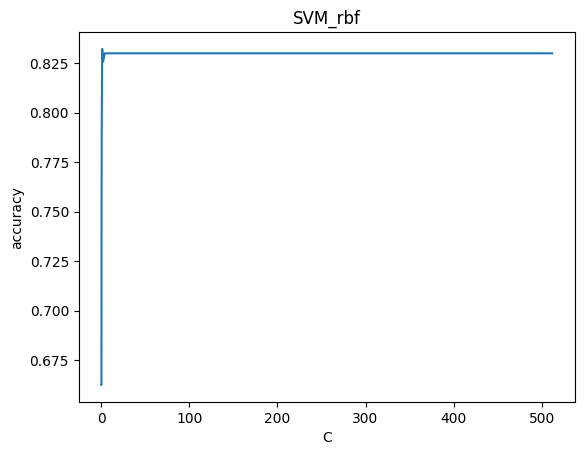

In [ ]:
param_sv_r = {'kernel': ['rbf'],
            'C': [2**_ for _ in range(-15,10)],
            'gamma': [0.5]}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X_encoded, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

print(gs_sv_l.cv_results_['mean_test_score'])

plt.plot([2**_ for _ in range(-15,10)], gs_sv_r.cv_results_['mean_test_score'])

plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_rbf')
plt.xlim(2**(-15), 2**9)


plt.show()

CPU times: user 1.47 s, sys: 2.96 ms, total: 1.47 s
Wall time: 1.47 s
{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}
0.8321612541993281
[0.79838746 0.7962598  0.79838746 0.79408735 0.80472564 0.80259798
 0.79621501 0.79621501 0.79834267]


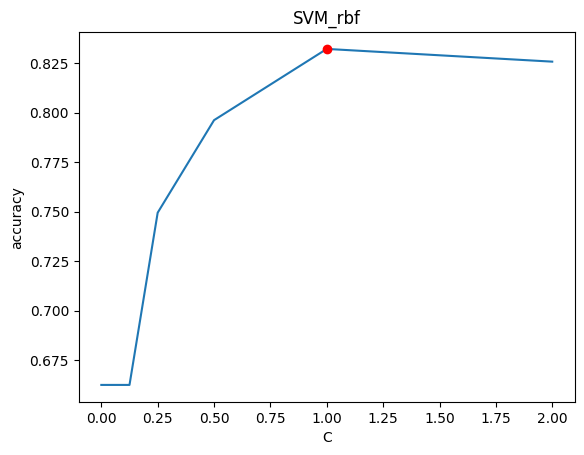

In [ ]:
param_sv_r = {'kernel': ['rbf'],
            'C': [2**_ for _ in range(-15,2)],
            'gamma': [0.5]}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X_encoded, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

print(gs_sv_l.cv_results_['mean_test_score'])

plt.plot([2**_ for _ in range(-15,2)], gs_sv_r.cv_results_['mean_test_score'])
plt.plot(1, 0.8321612541993281, 'ro')


plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_rbf')
plt.xlim(2**(-15), 2**1)

plt.show()

CPU times: user 1.97 s, sys: 1.96 ms, total: 1.98 s
Wall time: 1.99 s
{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}
0.8321612541993281
[0.79838746 0.7962598  0.79838746 0.79408735 0.80472564 0.80259798
 0.79621501 0.79621501 0.79834267]


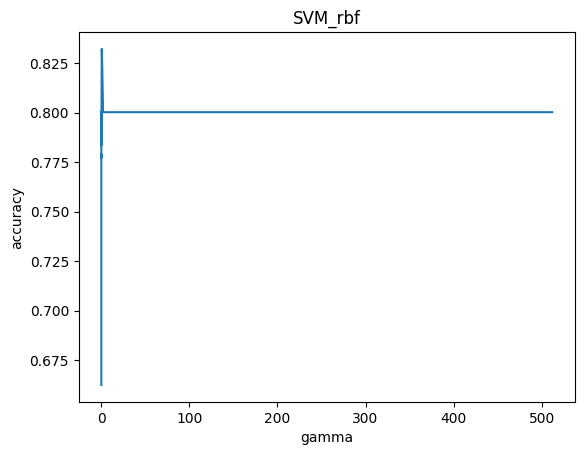

In [ ]:
param_sv_r = {'kernel': ['rbf'],
            'C': [1],
            'gamma': gamma_rbf}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X_encoded, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

print(gs_sv_l.cv_results_['mean_test_score'])

plt.plot(gamma_rbf, gs_sv_r.cv_results_['mean_test_score'])
#plt.plot(1, 0.8321612541993281, 'ro')


plt.xlabel('gamma')
plt.ylabel('accuracy')
plt.title('SVM_rbf')
plt.xlim(0, gamma_rbf[-1])


plt.show()

CPU times: user 1.85 s, sys: 4.82 ms, total: 1.85 s
Wall time: 1.91 s
{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}
0.8321612541993281
[0.79838746 0.7962598  0.79838746 0.79408735 0.80472564 0.80259798
 0.79621501 0.79621501 0.79834267]


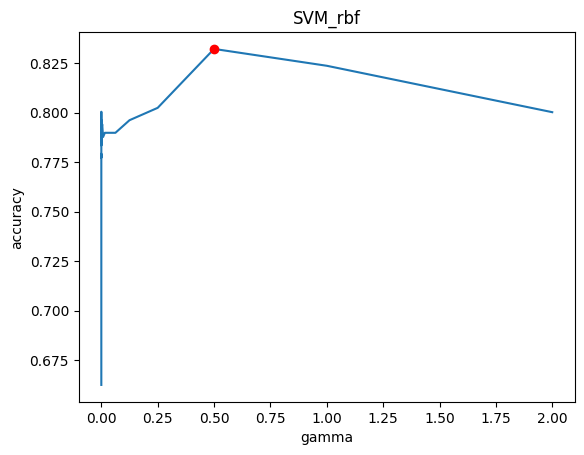

In [ ]:
param_sv_r = {'kernel': ['rbf'],
            'C': [1],
            'gamma': gamma_rbf[0:18]}
gs_sv_r = GridSearchCV(svc, param_sv_r, cv=5, scoring='accuracy')
%time gs_sv_r.fit(X_encoded, y01)
print(gs_sv_r.best_params_)
print(gs_sv_r.best_score_)

print(gs_sv_l.cv_results_['mean_test_score'])

plt.plot(gamma_rbf[0:18], gs_sv_r.cv_results_['mean_test_score'])
plt.plot(0.5, 0.8321612541993281, 'ro')


plt.xlabel('gamma')
plt.ylabel('accuracy')
plt.title('SVM_rbf')
plt.xlim(0, gamma_rbf[17])

plt.show()

In [ ]:
gamma_poly = [2**_ for _ in range(-15,10)]
gamma_poly.insert(0,0)


param_sv_p = {'kernel': ['poly'],
            'C': [2**_ for _ in range(-15,10)],
            'gamma': gamma_poly,
            'degree': [2],
            'max_iter': [10000]}
gs_sv_p = GridSearchCV(svc, param_sv_p, cv=5, scoring='accuracy')
%time gs_sv_p.fit(X_encoded, y01)
print(gs_sv_p.best_params_)
print(gs_sv_p.best_score_)


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Con

CPU times: user 1min 8s, sys: 513 ms, total: 1min 9s
Wall time: 1min 10s
{'C': 3.0517578125e-05, 'degree': 2, 'gamma': 1, 'kernel': 'poly', 'max_iter': 10000}
0.8216573348264278


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Con

In [ ]:
{'C': 0.5, 'degree': 2, 'gamma': 2, 'kernel': 'poly', 'max_iter': 500000}
0.8238297872340427

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=10000).  Con

CPU times: user 2.94 s, sys: 26.9 ms, total: 2.97 s
Wall time: 2.94 s
{'C': 3.0517578125e-05, 'degree': 2, 'gamma': 1, 'kernel': 'poly', 'max_iter': 10000}
0.8216573348264278


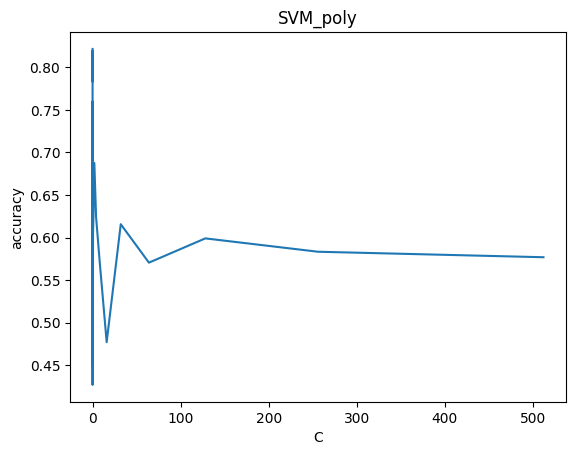

In [ ]:
param_sv_p = {'kernel': ['poly'],
            'C': [2**_ for _ in range(-15,10)],
            'gamma': [1],
            'degree': [2],
            'max_iter': [10000]}
gs_sv_p = GridSearchCV(svc, param_sv_p, cv=5, scoring='accuracy')
%time gs_sv_p.fit(X_encoded, y01)
print(gs_sv_p.best_params_)
print(gs_sv_p.best_score_)

plt.plot([2**_ for _ in range(-15,10)], gs_sv_p.cv_results_['mean_test_score'])
#plt.plot(1, 0.8321612541993281, 'ro')


plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_poly')
plt.xlim(2**(-15), 2**9)

plt.show()

In [ ]:
gs_sv_p.cv_results_['mean_test_score']

array([0.82165733, 0.78322508, 0.81950728, 0.67717805, 0.70470325,
       0.70096305, 0.42698768, 0.69614782, 0.75991041, 0.66519597,
       0.51323628, 0.49892497, 0.50568869, 0.44945129, 0.60468085,
       0.6262262 , 0.68765957, 0.62400896, 0.57272116, 0.47722284,
       0.61576708, 0.5706159 , 0.59910414, 0.58342665, 0.57697648])

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=400000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=400000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=400000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=400000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=400000).

CPU times: user 53.5 s, sys: 111 ms, total: 53.6 s
Wall time: 58.4 s
{'C': 8, 'degree': 2, 'gamma': 2, 'kernel': 'poly', 'max_iter': 400000}
0.8195744680851066


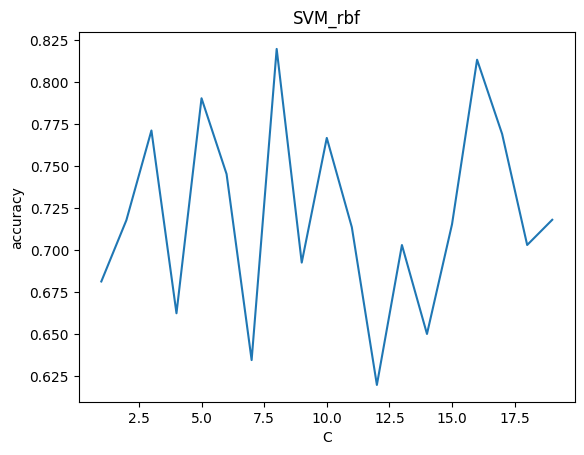

In [ ]:
param_sv_p = {'kernel': ['poly'],
            'C': range(1,20),
            'gamma': [2],
            'degree': [2],
            'max_iter': [400000]}
gs_sv_p = GridSearchCV(svc, param_sv_p, cv=5, scoring='accuracy')
%time gs_sv_p.fit(X_encoded, y01)
print(gs_sv_p.best_params_)
print(gs_sv_p.best_score_)

plt.plot(range(1,20), gs_sv_p.cv_results_['mean_test_score'])
#plt.plot(1, 0.8321612541993281, 'ro')


plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('SVM_rbf')
plt.xlim(1, 19)

plt.show()

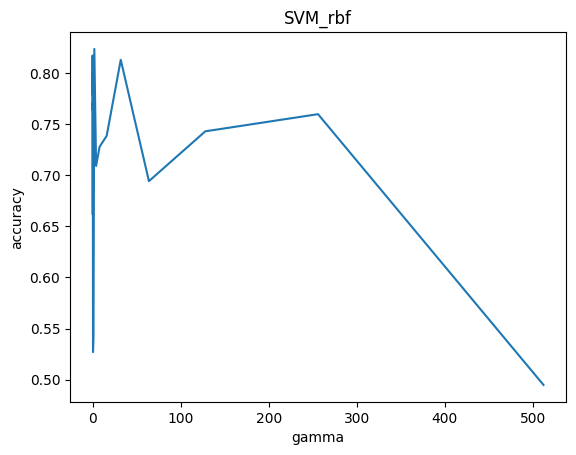

In [ ]:
plt.plot(gamma_poly, gs_sv_p.cv_results_['mean_test_score'])
#plt.plot(1, 0.8321612541993281, 'ro')


plt.xlabel('gamma')
plt.ylabel('accuracy')
plt.title('SVM_poly')
plt.xlim(0, gamma_poly[-1])

plt.show()

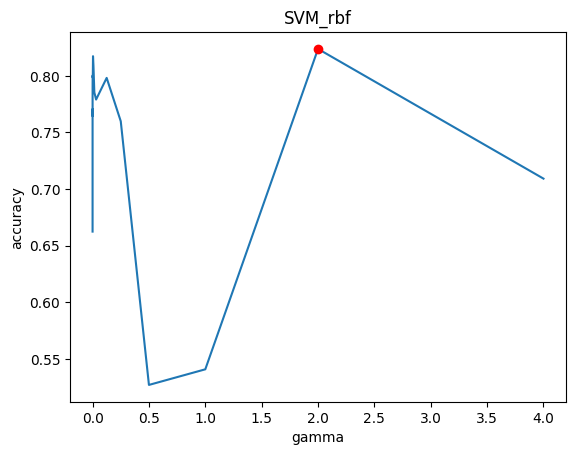

In [ ]:
plt.plot(gamma_poly[:19], gs_sv_p.cv_results_['mean_test_score'][:19])
plt.plot(2, 0.8238297872340427, 'ro')


plt.xlabel('gamma')
plt.ylabel('accuracy')
plt.title('SVM_poly')
plt.xlim(0, gamma_poly[18])

plt.show()

Logistic Regression (LOR)

In [ ]:
# solver:
# |         - 'lbfgs'           -   ['l2', None]
# |         - 'liblinear'       -   ['l1', 'l2']
# |         - 'newton-cg'       -   ['l2', None]
# |         - 'newton-cholesky' -   ['l2', None]
# |         - 'sag'             -   ['l2', None]
# |         - 'saga'            -   ['elasticnet', 'l1', 'l2', None]
# |
#help(lor)

In [ ]:
param_lo = {'penalty': ['l1', 'l2'],#, 'elasticnet', None],
            'C': [2**_ for _ in range(-15,10)],
            'solver': ['liblinear']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
%time gs_lo.fit(X_encoded, y01)
print(gs_lo.best_params_)
print(gs_lo.best_score_)

CPU times: user 1.96 s, sys: 5.03 ms, total: 1.97 s
Wall time: 1.96 s
{'C': 0.25, 'penalty': 'l1', 'solver': 'liblinear'}
0.7877043673012317


[0.66241881 0.66241881 0.66241881 0.66241881 0.66241881 0.64967525
 0.65406495 0.64980963 0.64980963 0.66044793 0.66895857 0.75384099
 0.77921613 0.78770437 0.77702128 0.76638298 0.75787234 0.74931691
 0.75352744 0.75139978 0.75139978 0.74714446 0.75139978 0.71531915
 0.70257559]


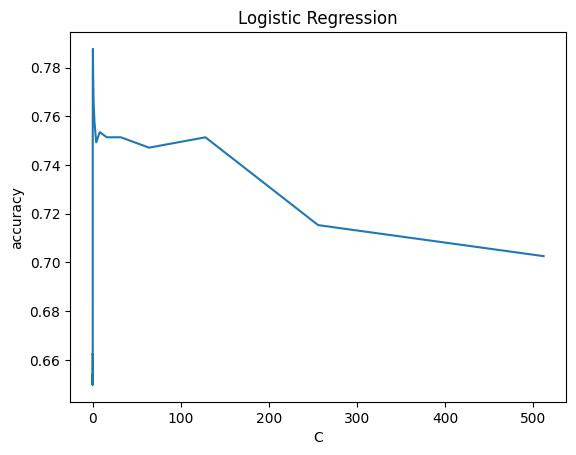

In [ ]:
param_lo = {'C': [2**_ for _ in range(-15,10)],
            'penalty': ['l1'],
            'solver': ['liblinear']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
gs_lo.fit(X_encoded, y01)
print(gs_lo.cv_results_['mean_test_score'])

plt.plot([2**_ for _ in range(-15,10)], gs_lo.cv_results_['mean_test_score'])

plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('Logistic Regression')
plt.xlim(2**(-15), 2**9)

plt.show()

[0.66241881 0.66241881 0.66241881 0.66241881 0.66241881 0.64967525
 0.65406495 0.64980963 0.64980963 0.66044793 0.66895857 0.75384099
 0.77921613 0.78770437 0.77702128]


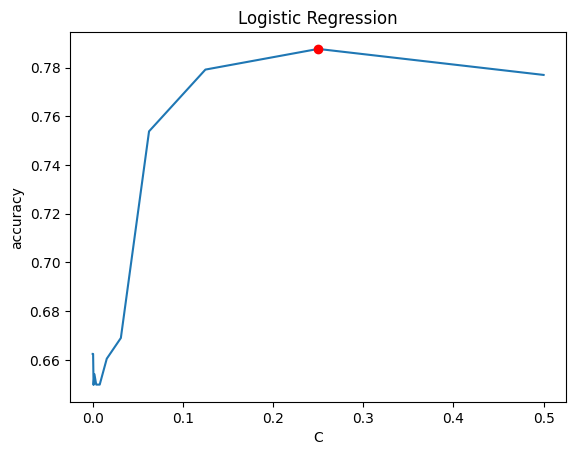

In [ ]:
param_lo = {'C': [2**_ for _ in range(-15,0)],
            'penalty': ['l1'],
            'solver': ['liblinear']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
gs_lo.fit(X_encoded, y01)
print(gs_lo.cv_results_['mean_test_score'])

plt.plot([2**_ for _ in range(-15,0)], gs_lo.cv_results_['mean_test_score'])
plt.plot(0.25, 0.7877043673012317, 'ro')

plt.xlabel('C')
plt.ylabel('accuracy')
plt.title('Logistic Regression')
plt.xlim(2**(-15), 2**(-1))

plt.show()

In [ ]:
param_lo = {'C': [0.25],
            'penalty': ['l1', 'l2'],
            'solver': ['liblinear']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
gs_lo.fit(X_encoded, y01)
print(gs_lo.cv_results_['mean_test_score'])

print(gs_lo.cv_results_['params'])

[0.78770437 0.74940649]
[{'C': 0.25, 'penalty': 'l1', 'solver': 'liblinear'}, {'C': 0.25, 'penalty': 'l2', 'solver': 'liblinear'}]


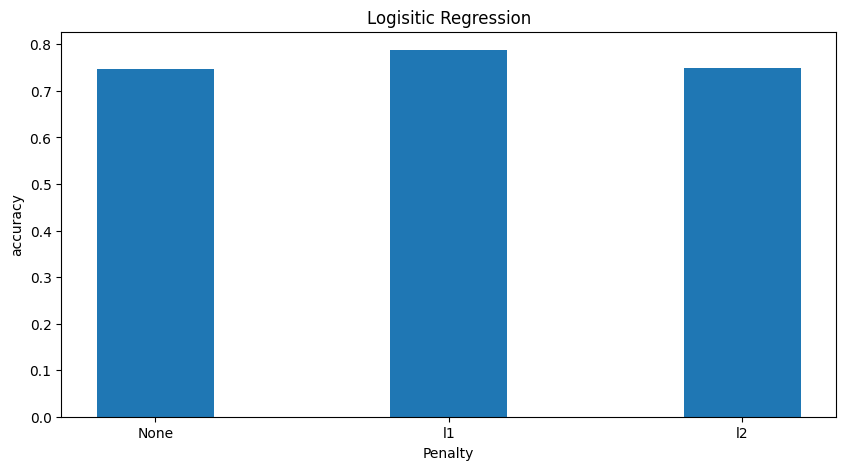

In [ ]:
lor_bar = {'None':0.7472564, 'l1':0.78770437  , 'l2':0.74940649}
courses = list(lor_bar.keys())
values = list(lor_bar.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, width = 0.4)

plt.xlabel("Penalty")
plt.ylabel("accuracy")
plt.title('Logisitic Regression')
plt.show()

In [ ]:
param_lo = {'C':[0.25],
            'penalty': [None],
            'solver': ['lbfgs']}
gs_lo = GridSearchCV(lor, param_lo, cv=5, scoring='accuracy')
%time gs_lo.fit(X_encoded, y01)
print(gs_lo.best_params_)
print(gs_lo.best_score_)

CPU times: user 158 ms, sys: 23.9 ms, total: 182 ms
Wall time: 181 ms
{'C': 0.25, 'penalty': None, 'solver': 'lbfgs'}
0.7472564389697649


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: T

Decision Tree (DT)

In [ ]:
#help(dtc)

In [ ]:
'criterion', 'splitter', 'max_depth', 'min_samples_split', 'min_samples_leaf'

In [ ]:
param_dt = {'criterion': ['gini', 'entropy'],
         'splitter': ['random', 'best'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
%time gs_dt.fit(X_encoded, y01)
print(gs_dt.best_params_)
print(gs_dt.best_score_)


CPU times: user 12 s, sys: 53 ms, total: 12 s
Wall time: 12.1 s
{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}
0.8575139977603584


In [ ]:
param_dt = {'criterion': ['gini', 'entropy'],
         'splitter': ['random', 'best'],
         'max_depth': [15],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
%time gs_dt.fit(X_encoded, y01)
print(gs_dt.best_params_)
print(gs_dt.best_score_)
print(gs_dt.cv_results_['params'])
print('gini: ', gs_dt.cv_results_['mean_test_score'][0:2].mean())
print('entropy: ', gs_dt.cv_results_['mean_test_score'][2:4].mean())
print('random: ', np.array([0.83428891, 0.83213886]).mean())
print('best: ', np.array([0.83204927, 0.857514]).mean())

CPU times: user 123 ms, sys: 0 ns, total: 123 ms
Wall time: 124 ms
{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}
0.8575139977603584
[{'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'random'}, {'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}, {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'random'}, {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}]
gini:  0.8331690929451288
entropy:  0.8448264277715565
random:  0.833213885
best:  0.8447816349999999


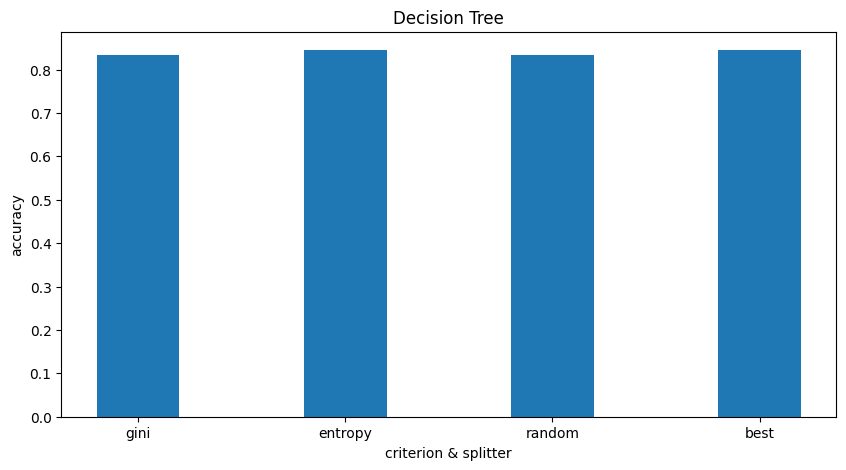

In [ ]:
dt_bar = {'gini':0.8331690929451288 , 'entropy':0.8448264277715565, 'random':0.833213885, 'best':0.8447816349999999}
courses = list(dt_bar.keys())
values = list(dt_bar.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, width = 0.4)

plt.xlabel("criterion & splitter")
plt.ylabel("accuracy")
plt.title('Decision Tree')
plt.show()

CPU times: user 2.76 s, sys: 6.31 ms, total: 2.76 s
Wall time: 2.77 s
{'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'random'}
0.8406270996640538


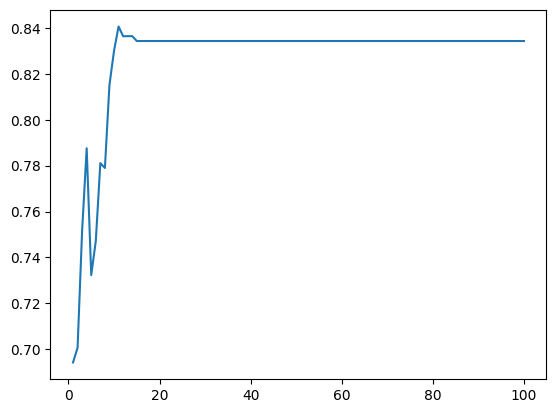

In [ ]:
param_dt_r = {'criterion': ['gini'],
         'splitter': ['random'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt_r = GridSearchCV(dtc, param_dt_r, cv = 5, scoring = "accuracy")
%time gs_dt_r.fit(X_encoded, y01)
print(gs_dt_r.best_params_)
print(gs_dt_r.best_score_)

plt.plot(range(1, 101), gs_dt_r.cv_results_['mean_test_score'])
plt.xlim(1, 100)

CPU times: user 3.34 s, sys: 8.59 ms, total: 3.35 s
Wall time: 3.4 s
{'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'random'}
0.8363941769316909


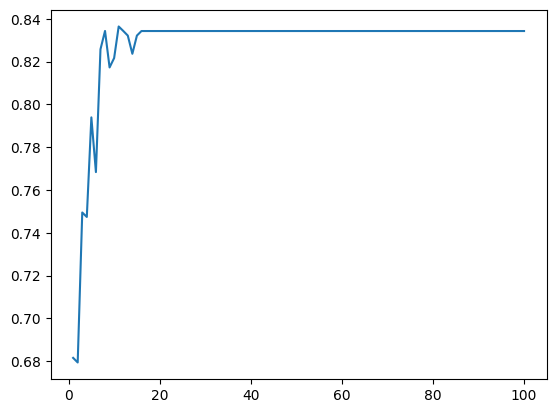

In [ ]:
param_dt_r = {'criterion': ['entropy'],
         'splitter': ['random'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt_r = GridSearchCV(dtc, param_dt_r, cv = 5, scoring = "accuracy")
%time gs_dt_r.fit(X_encoded, y01)
print(gs_dt_r.best_params_)
print(gs_dt_r.best_score_)

plt.plot(range(1, 101), gs_dt_r.cv_results_['mean_test_score'])
plt.xlim(1, 100)

CPU times: user 3.09 s, sys: 10.6 ms, total: 3.1 s
Wall time: 3.13 s
{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}
0.8363493840985443


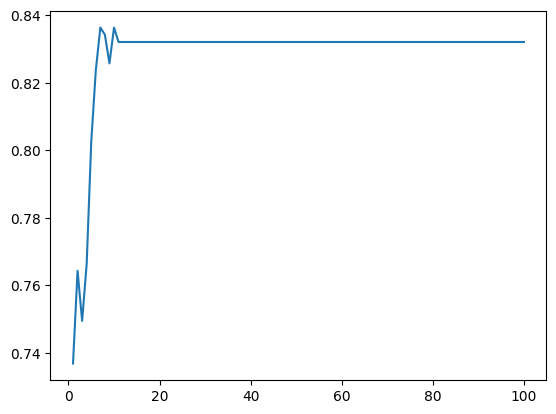

In [ ]:
param_dt_b = {'criterion': ['gini'],
         'splitter': ['best'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt_b = GridSearchCV(dtc, param_dt_b, cv = 5, scoring = "accuracy")
%time gs_dt_b.fit(X_encoded, y01)
print(gs_dt_b.best_params_)
print(gs_dt_b.best_score_)

plt.plot(range(1, 101), gs_dt_b.cv_results_['mean_test_score'])
plt.xlim(1, 100)

CPU times: user 3.13 s, sys: 6.69 ms, total: 3.14 s
Wall time: 3.17 s
{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}
0.8575139977603584


Text(0.5, 1.0, 'Decision Tree')

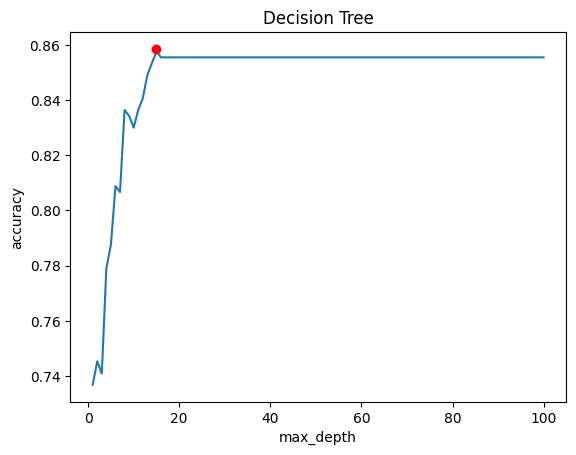

In [ ]:
param_dt_b = {'criterion': ['entropy'],
         'splitter': ['best'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt_b = GridSearchCV(dtc, param_dt_b, cv = 5, scoring = "accuracy")
%time gs_dt_b.fit(X_encoded, y01)
print(gs_dt_b.best_params_)
print(gs_dt_b.best_score_)

plt.plot(range(1, 101), gs_dt_b.cv_results_['mean_test_score'])
plt.plot(15, 0.8585139977603584, 'ro')

plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('Decision Tree')
plt.xlim(1, 100)

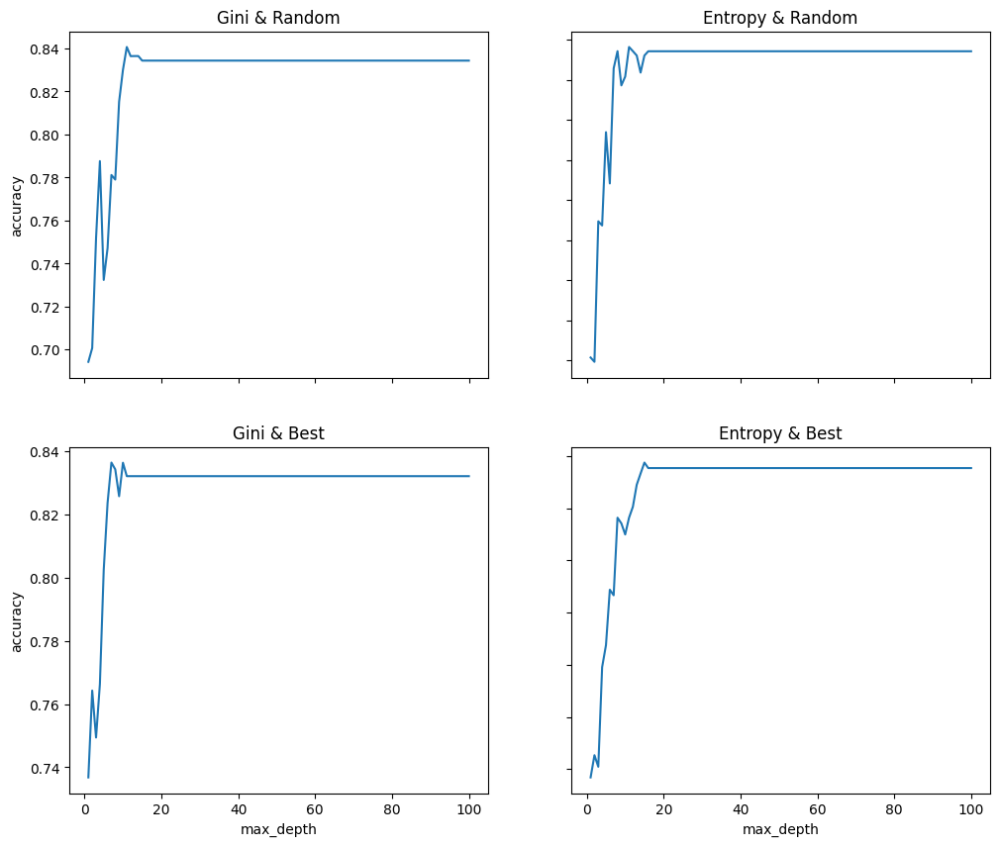

In [ ]:

fig, axs = plt.subplots(2, 2, figsize=(12,10))
axs[0, 0].plot(range(1, 101), gs_dt_r.cv_results_['mean_test_score'][0:100])
axs[0, 0].set_title('Gini & Random')
axs[0, 1].plot(range(1, 101), gs_dt_r.cv_results_['mean_test_score'][100:200])
axs[0, 1].set_title('Entropy & Random')
axs[1, 0].plot(range(1, 101), gs_dt_b.cv_results_['mean_test_score'][0:100])
axs[1, 0].set_title('Gini & Best')
axs[1, 1].plot(range(1, 101), gs_dt_b.cv_results_['mean_test_score'][100:200])
axs[1, 1].set_title('Entropy & Best')

for ax in axs.flat:
    ax.set(xlabel='max_depth', ylabel='accuracy')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

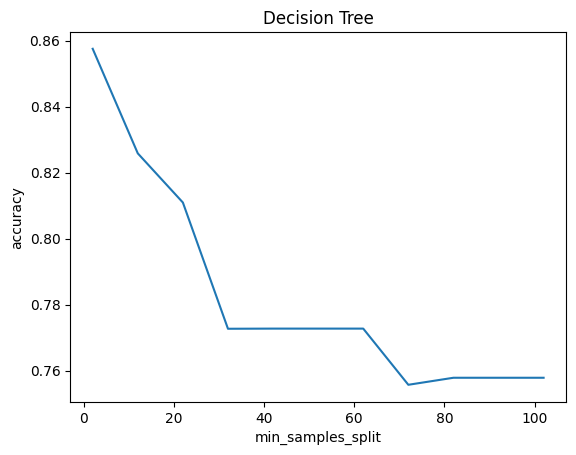

In [ ]:
param_dt = {'criterion': ['entropy'],
         'splitter': ['best'],
         'max_depth': [15],
         'min_samples_split': range(2, 103, 10),
         'min_samples_leaf': [1],
         'random_state': [80]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
gs_dt.fit(X_encoded, y01)
gs_dt.cv_results_

plt.plot(range(2, 103, 10), gs_dt.cv_results_['mean_test_score'])

plt.xlabel('min_samples_split')
plt.ylabel('accuracy')
plt.title('Decision Tree')
plt.xlim(2, 102)

plt.show()

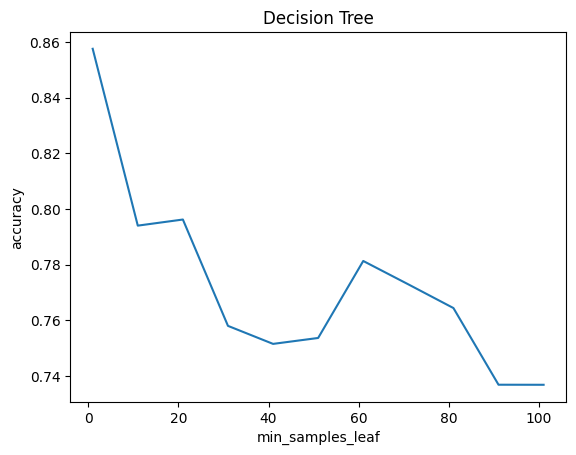

In [ ]:
param_dt = {'criterion': ['entropy'],
         'splitter': ['best'],
         'max_depth': [15],
         'min_samples_split': [2],
         'min_samples_leaf': range(1, 102, 10),
         'random_state': [80]}

gs_dt = GridSearchCV(dtc, param_dt, cv = 5, scoring = "accuracy")
gs_dt.fit(X_encoded, y01)
gs_dt.cv_results_

plt.plot(range(1, 102, 10), gs_dt.cv_results_['mean_test_score'])

plt.xlabel('min_samples_leaf')
plt.ylabel('accuracy')
plt.title('Decision Tree')
plt.xlim(1, 101)

plt.show()

Random Forest (RF)

In [ ]:
#help(rfc)

In [ ]:
param_rf = {'criterion': ['gini', 'entropy'],
         'max_depth': range(1, 21),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(5, 101, 5),
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)
print(gs_rf.best_params_)
print(gs_rf.best_score_)


CPU times: user 6min 31s, sys: 1.39 s, total: 6min 32s
Wall time: 6min 35s
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


CPU times: user 6.48 s, sys: 28.9 ms, total: 6.5 s
Wall time: 6.51 s
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


Text(0.5, 1.0, 'Random Forest')

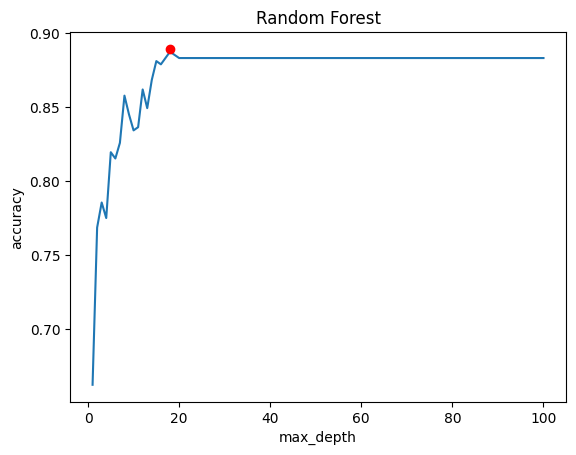

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': range(1, 101),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': [5],
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)

print(gs_rf.best_params_)
print(gs_rf.best_score_)

plt.plot(range(1, 101), gs_rf.cv_results_['mean_test_score'])
plt.plot(18, 0.8893460246360582, 'ro')


plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('Random Forest')
plt.xlim(1, 100)

CPU times: user 1.23 s, sys: 8.94 ms, total: 1.24 s
Wall time: 1.26 s
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


Text(0.5, 1.0, 'Random Forest')

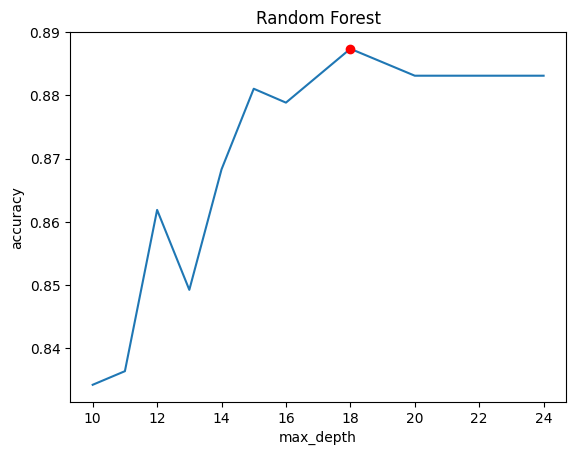

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': range(10, 25),
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': [5],
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)

print(gs_rf.best_params_)
print(gs_rf.best_score_)

plt.plot(range(10, 25), gs_rf.cv_results_['mean_test_score'])
plt.plot(18, 0.8873460246360582, 'ro')

plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('Random Forest')
plt.xlim(10, 24)

CPU times: user 10 s, sys: 44.9 ms, total: 10 s
Wall time: 10.1 s
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


Text(0.5, 1.0, 'Random Forest')

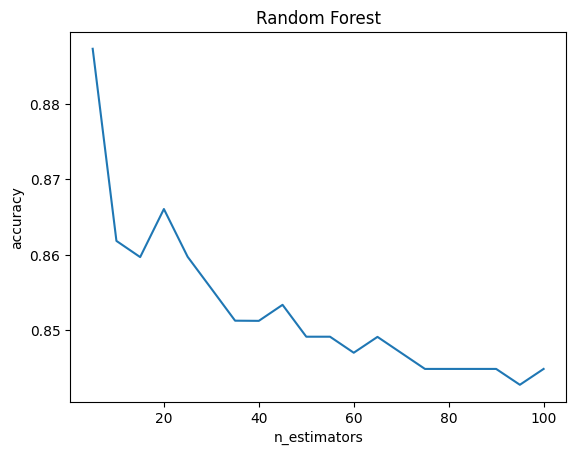

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': [18],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(5, 101, 5),
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)

print(gs_rf.best_params_)
print(gs_rf.best_score_)

plt.plot(range(5, 101, 5), gs_rf.cv_results_['mean_test_score'])

plt.xlabel('n_estimators')
plt.ylabel('accuracy')
plt.title('Random Forest')
plt.xlim(5, 100)

CPU times: user 746 ms, sys: 5 ms, total: 751 ms
Wall time: 752 ms
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


Text(0.5, 1.0, 'Random Forest')

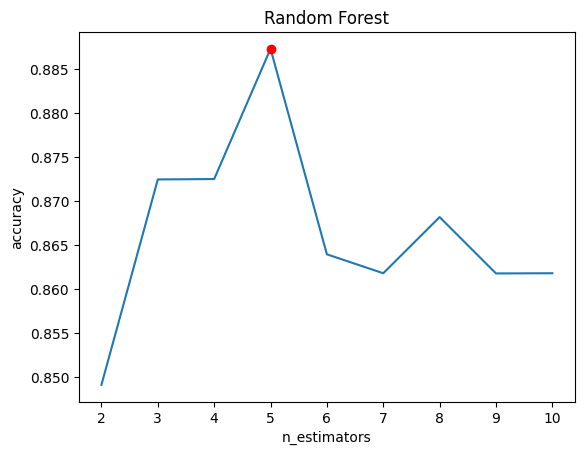

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': [18],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': range(2, 11),
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)

print(gs_rf.best_params_)
print(gs_rf.best_score_)

plt.plot(range(2, 11), gs_rf.cv_results_['mean_test_score'])
plt.plot(5, 0.8873460246360582, 'ro')

plt.xlabel('n_estimators')
plt.ylabel('accuracy')
plt.title('Random Forest')
plt.xlim(2, 10)

CPU times: user 784 ms, sys: 2.99 ms, total: 786 ms
Wall time: 786 ms
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


Text(0.5, 1.0, 'Random Forest')

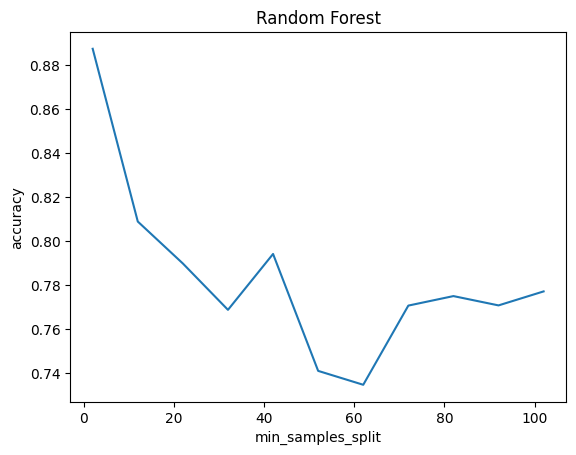

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': [18],
         'min_samples_split': range(2, 103, 10),
         'min_samples_leaf': [1],
         'n_estimators': [5],
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)

print(gs_rf.best_params_)
print(gs_rf.best_score_)

plt.plot(range(2, 103, 10), gs_rf.cv_results_['mean_test_score'])

plt.xlabel('min_samples_split')
plt.ylabel('accuracy')
plt.title('Random Forest')
plt.xlim(2, 102)

CPU times: user 760 ms, sys: 7.98 ms, total: 768 ms
Wall time: 767 ms
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}
0.8873460246360582


Text(0.5, 1.0, 'Random Forest')

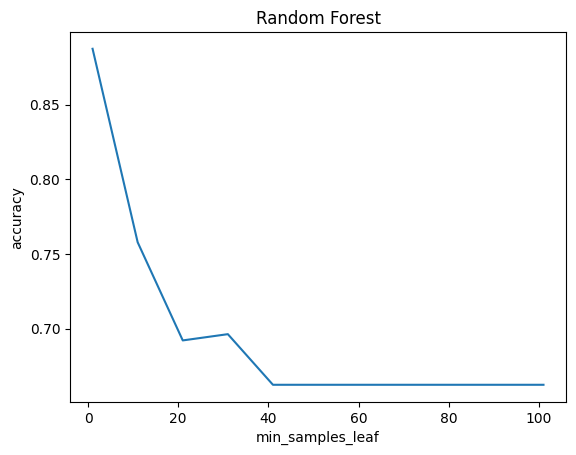

In [ ]:
param_rf = {'criterion': ['gini'],
         'max_depth': [18],
         'min_samples_split': [2],
         'min_samples_leaf': range(1, 103, 10),
         'n_estimators': [5],
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)

print(gs_rf.best_params_)
print(gs_rf.best_score_)

plt.plot(range(1, 103, 10), gs_rf.cv_results_['mean_test_score'])

plt.xlabel('min_samples_leaf')
plt.ylabel('accuracy')
plt.title('Random Forest')
plt.xlim(1, 102)

In [ ]:
param_rf = {'criterion': ['gini', 'entropy'],
         'max_depth': [18],
         'min_samples_split': [2],
         'min_samples_leaf': [1],
         'n_estimators': [5],
         'random_state': [131]}

gs_rf = GridSearchCV(rfc, param_rf, cv = 5, scoring = "accuracy")
%time gs_rf.fit(X_encoded, y01)
print(gs_rf.cv_results_['mean_test_score'])
print(gs_rf.cv_results_['params'])


CPU times: user 158 ms, sys: 2 ms, total: 160 ms
Wall time: 161 ms
[0.88734602 0.85547592]
[{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}, {'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}]


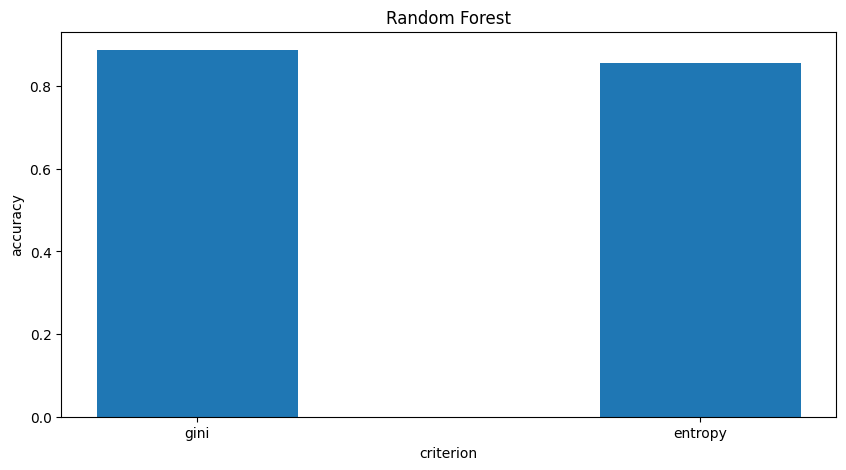

In [ ]:
rf_bar = {'gini':0.88734602 , 'entropy':0.85547592}
courses = list(rf_bar.keys())
values = list(rf_bar.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, width = 0.4)

plt.xlabel("criterion")
plt.ylabel("accuracy")
plt.title('Random Forest')
plt.show()

Result

In [ ]:
print(gs_kn.best_score_)
print(gs_sv_l.best_score_)
print(gs_sv_r.best_score_)
#print(gs_sv_p.best_score_)
print(gs_lo.best_score_)
print(gs_dt.best_score_)
print(gs_rf.best_score_)

0.8724300111982084
0.8047256438969764
0.8321612541993281
0.7877043673012317
0.8575139977603584
0.8873460246360582


In [ ]:
print(gs_kn.best_params_)
print(gs_sv_l.best_params_)
print(gs_sv_r.best_params_)
#print(gs_sv_p.best_params_)
print(gs_lo.best_params_)
print(gs_dt.best_params_)
print(gs_rf.best_params_)

{'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'distance'}
{'C': 0.03125, 'kernel': 'linear'}
{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}
{'C': 0.25, 'penalty': 'l1', 'solver': 'liblinear'}
{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 80, 'splitter': 'best'}
{'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5, 'random_state': 131}


## Modeling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y01, test_size= 0.2)

In [ ]:
#initialize

knc = KNeighborsClassifier(metric='manhattan', n_neighbors=23, weights='distance')
svc = SVC(C=1, gamma=0.5, kernel='rbf')
lor = LogisticRegression(C=0.25, penalty='l1', solver='liblinear')
dtc = DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=1, min_samples_split=2, random_state=80, splitter='best')
rfc = RandomForestClassifier(criterion='gini', max_depth=18, min_samples_leaf=1, min_samples_split=2, n_estimators=5, random_state=131)


In [ ]:
df['v01'].value_counts(sort = True)


,count
v01,
0,312
1,159


In [ ]:
# Data to plot
sizes = df['v01'].value_counts(sort = True)

rcParams['figure.figsize'] = 5,5 # Plot

plt.pie(sizes, explode = (0,0.1), labels=["Over 50%", "Under 50%"], autopct='%.2f%%', shadow=True, startangle=90)

plt.title('Percentage of Viability in Dataset')

KeyError: 'v01'

In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_knc = cross_val_score(knc, X_test, y_test, cv=kf, scoring='accuracy')
print(kf_knc.mean(), kf_knc.std())

0.8631578947368421 0.042105263157894736


In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_dtc = cross_val_score(dtc, X_test, y_test, cv=kf, scoring='accuracy')
print(kf_dtc.mean(), kf_dtc.std())

0.8421052631578947 0.057655006053175396


In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_knc = cross_val_score(knc, X_encoded, y01, cv=kf, scoring='accuracy')
print(kf_knc.mean(), kf_knc.std())

0.8617693169092945 0.06214667020629334


In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_svc = cross_val_score(svc, X_encoded, y01, cv=kf, scoring='accuracy')
print(kf_svc.mean(), kf_svc.std())

0.8449496080627099 0.022248853179838407


In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_lor = cross_val_score(lor, X_encoded, y01, cv=kf, scoring='accuracy')
print(kf_lor.mean(), kf_lor.std())

0.8323404255319149 0.032807379178547015


In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_dtc = cross_val_score(dtc, X_encoded, y01, cv=kf, scoring='accuracy')
print(kf_dtc.mean(), kf_dtc.std())

0.9001567749160134 0.024051978806148615


In [ ]:
kf = KFold(n_splits=5, shuffle=True)
kf_rfc = cross_val_score(rfc, X_encoded, y01, cv=kf, scoring='accuracy')
print(kf_rfc.mean(), kf_rfc.std())

0.8811646136618142 0.046124624714515235


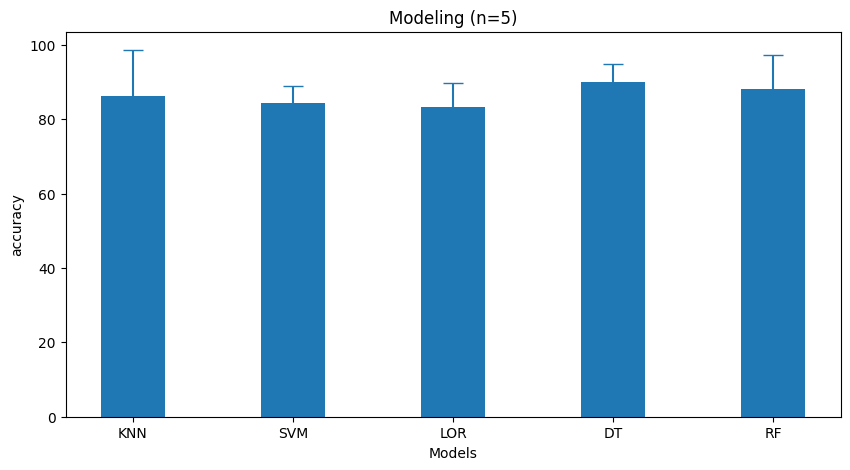

In [ ]:
#Visualize

bar = {'KNN':86.17693169092945  , 'SVM':84.49496080627099 , 'LOR':83.23404255319149  , 'DT':90.01567749160134 , 'RF':88.11646136618142  }
error = np.array([6.214667020629334, 2.2248853179838407, 3.2807379178547015, 2.4051978806148615, 4.6124624714515235])
courses = list(bar.keys())
values = list(bar.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, width = 0.4)
plt.errorbar(courses, values, error*2, capsize=7, linestyle='None')

plt.xlabel("Models")
plt.ylabel("accuracy")
plt.title('Modeling (n=5)')
plt.show()


In [ ]:
#fit

knc.fit(X_train, y_train)
svc.fit(X_train, y_train)
lor.fit(X_train, y_train)
dtc.fit(X_train, y_train)
rfc.fit(X_train, y_train)

RandomForestClassifier(max_depth=18, n_estimators=5, random_state=131)

In [ ]:
# validation

knc_val = knc.predict(X_train)
svc_val = svc.predict(X_train)
lor_val = lor.predict(X_train)
dtc_val = dtc.predict(X_train)
rfc_val = rfc.predict(X_train)


In [ ]:
# predict

knc_pred = knc.predict(X_test)
svc_pred = svc.predict(X_test)
lor_pred = lor.predict(X_test)
dtc_pred = dtc.predict(X_test)
rfc_pred = rfc.predict(X_test)


In [ ]:
# Evaluation

print("KNN (Train): ", accuracy_score(y_train, knc_val), "\t(Test): ", accuracy_score(y_test, knc_pred))
print("SVM (Train): ", accuracy_score(y_train, svc_val), "\t(Test): ", accuracy_score(y_test, svc_pred))
print("LoR (Train): ", accuracy_score(y_train, lor_val), "\t(Test): ", accuracy_score(y_test, lor_pred))
print("DT  (Train): ", accuracy_score(y_train, dtc_val), "\t(Test): ", accuracy_score(y_test, dtc_pred))
print("RF  (Train): ", accuracy_score(y_train, rfc_val), "\t(Test): ", accuracy_score(y_test, rfc_pred))


KNN (Train):  0.9813829787234043 	(Test):  0.8631578947368421
SVM (Train):  0.9547872340425532 	(Test):  0.8105263157894737
LoR (Train):  0.8537234042553191 	(Test):  0.8315789473684211
DT  (Train):  0.9813829787234043 	(Test):  0.9052631578947369
RF  (Train):  0.9680851063829787 	(Test):  0.8842105263157894


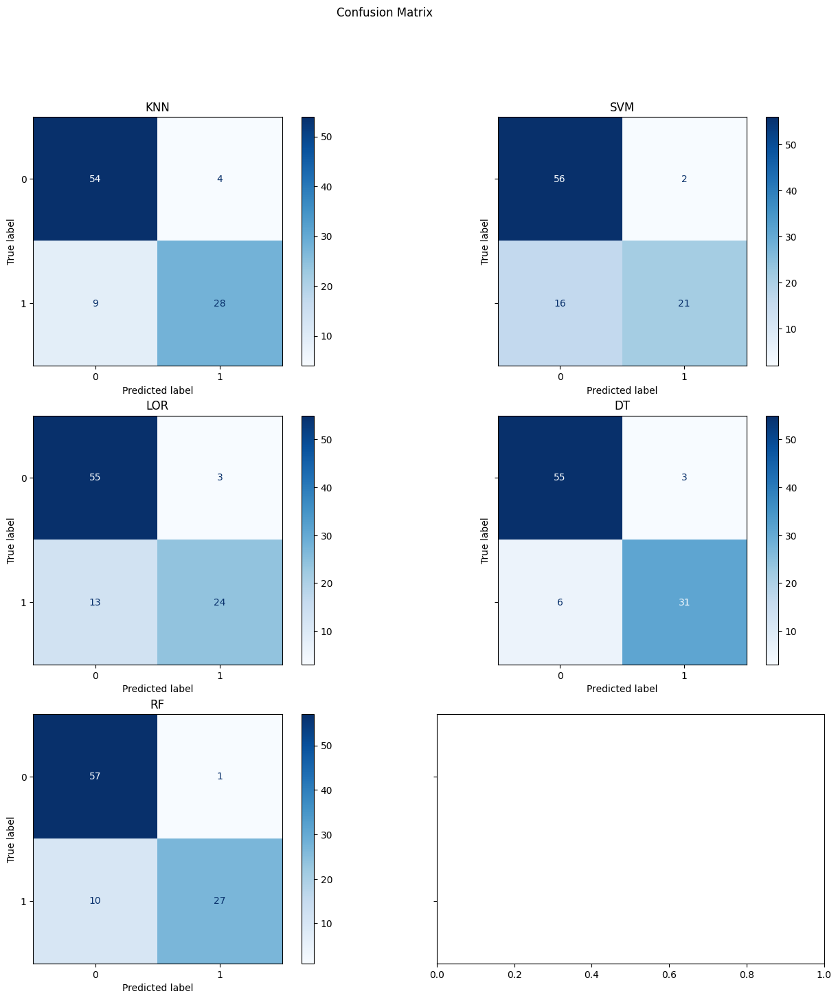

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(16, 16), sharey=True)
fig.suptitle('Confusion Matrix')

cm_knc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, knc_pred))
cm_svc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, svc_pred))
cm_lor = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, lor_pred))
cm_dtc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, dtc_pred))
cm_rfc = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, rfc_pred))


axes[0, 0].set_title('KNN')
cm_knc.plot(cmap='Blues', ax=axes[0, 0])

axes[0, 1].set_title('SVM')
cm_svc.plot(cmap='Blues', ax=axes[0, 1])

axes[1, 0].set_title('LOR')
cm_lor.plot(cmap='Blues', ax=axes[1, 0])

axes[1, 1].set_title('DT')
cm_dtc.plot(cmap='Blues', ax=axes[1, 1])

axes[2, 0].set_title('RF')
cm_rfc.plot(cmap='Blues', ax=axes[2, 0])

plt.show()

In [ ]:
print(classification_report(y_test, knc_pred))
print(classification_report(y_test, svc_pred))
print(classification_report(y_test, lor_pred))
print(classification_report(y_test, dtc_pred))
print(classification_report(y_test, rfc_pred))

              precision    recall  f1-score   support

           0       0.86      0.93      0.89        58
           1       0.88      0.76      0.81        37

    accuracy                           0.86        95
   macro avg       0.87      0.84      0.85        95
weighted avg       0.86      0.86      0.86        95

              precision    recall  f1-score   support

           0       0.78      0.97      0.86        58
           1       0.91      0.57      0.70        37

    accuracy                           0.81        95
   macro avg       0.85      0.77      0.78        95
weighted avg       0.83      0.81      0.80        95

              precision    recall  f1-score   support

           0       0.81      0.95      0.87        58
           1       0.89      0.65      0.75        37

    accuracy                           0.83        95
   macro avg       0.85      0.80      0.81        95
weighted avg       0.84      0.83      0.83        95

              preci

In [ ]:
#fit

knc.fit(X, y01)
svc.fit(X, y01)
lor.fit(X, y01)
dtc.fit(X, y01)
rfc.fit(X, y01)

# validation

knc_val = knc.predict(X)
svc_val = svc.predict(X)
lor_val = lor.predict(X)
dtc_val = dtc.predict(X)
rfc_val = rfc.predict(X)

# Evaluation

print("KNN (Train): ", accuracy_score(y01, knc_val))#, "\t(Test): ", accuracy_score(y_test, knc_pred))
print("SVM (Train): ", accuracy_score(y01, svc_val))#, "\t(Test): ", accuracy_score(y_test, svc_pred))
print("LoR (Train): ", accuracy_score(y01, lor_val))#, "\t(Test): ", accuracy_score(y_test, lor_pred))
print("DT  (Train): ", accuracy_score(y01, dtc_val))#, "\t(Test): ", accuracy_score(y_test, dtc_pred))
print("RF  (Train): ", accuracy_score(y01, rfc_val))#, "\t(Test): ", accuracy_score(y_test, rfc_pred))


KNN (Train):  0.8450106157112527
SVM (Train):  0.8450106157112527
LoR (Train):  0.7749469214437368
DT  (Train):  0.8450106157112527
RF  (Train):  0.8407643312101911


برای زنده مانی 50 به بالا نیاز به چه دوزی داریم؟


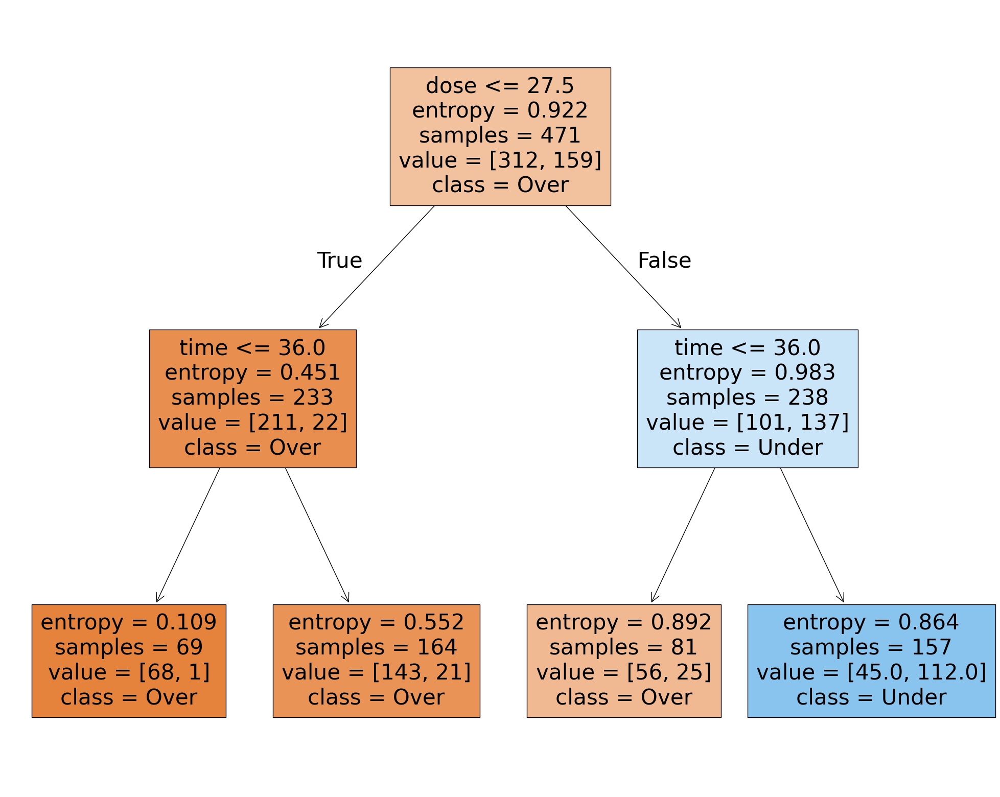

In [ ]:
#Final Model

X_trn, X_tst, y_trn, y_tst = train_test_split(X, y01, test_size= 0.2)

dtc = DecisionTreeClassifier(criterion='entropy', max_depth=2, min_samples_leaf=1, min_samples_split=2, random_state=80, splitter='best')
dtc.fit(X, y01)
dtc_pred = dtc.predict(X)

fig = plt.figure(figsize=(25,20))
_ = plot_tree(dtc, feature_names=['time', 'dose'], class_names=['Over', 'Under'], filled=True)

In [ ]:
accuracy_score(y01, dtc_pred)

0.8046709129511678